# Analyze AFM tip solvation

This notebook demonstrates deposition of an SDS adsorption layer on a non-spherical AFM tip model.

## Initialization

### IPython magic

In [13]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [14]:
%aimport

Modules to reload:
all-except-skipped

Modules to skip:



### Imports

In [15]:
import ase.io # here used for reading pdb files
from ase.visualize import view
from ase.visualize.plot import plot_atoms # has nasty offset issues
from cycler import cycler # here used for cycling through colors in plots
import datetime
import fabric # for pythonic ssh connections
from fireworks import LaunchPad, Firework, Tracker, Workflow 
from fireworks import FileTransferTask, PyTask, ScriptTask

# FireWorks functionality 
from fireworks import Firework, LaunchPad, ScriptTask, Workflow
from fireworks.user_objects.firetasks.templatewriter_task import TemplateWriterTask
from fireworks.user_objects.firetasks.filepad_tasks import AddFilesTask, GetFilesTask, GetFilesByQueryTask
from imteksimfw.fireworks.user_objects.firetasks.cmd_tasks import CmdTask
from fireworks.utilities.filepad import FilePad # direct FilePad access, similar to the familiar LaunchPad

from collections.abc import Iterable
import glob
import gc # manually clean up memory with gc.collect()
import gromacs # GromacsWrapper, here used for evoking gmc commands, reading and writing .ndx files
# from io import StringIO, TextIOWrapper
import io
from IPython.display import display, Image #, Video # display image files within notebook
from ipywidgets import Video  # display video within notebook
import itertools # for products of iterables
import json # generic serialization of lists and dicts
import jinja2 # here used for filling packmol input script template
import jinja2.meta # for gathering variables in a jinja2 template
import logging 
import matplotlib.pyplot as plt
import MDAnalysis as mda # here used for reading and analyzing gromacs trajectories
import MDAnalysis.analysis.rdf as mda_rdf
import MDAnalysis.analysis.rms as mda_rms
from mpl_toolkits.mplot3d import Axes3D # here used for 3d point cloud scatter plot
import miniball # finds minimum bounding sphere of a point set
import nglview
import numpy as np
import os, os.path
import pandas as pd
import panedr # reads GROMACS edr into pandas df, requires pandas and pbr
import parmed as pmd # has quite a few advantages over ASE when it comes to parsing pdb
from pprint import pprint
import pymongo # for sorting in queries
import scipy.constants as sc
import subprocess # used for evoking external packmol
import sys
import tempfile
import yaml

GromacsWrapper might need a file `~/.gromacswrapper.cfg` with content
```cfg
[Gromacs]
tools = gmx gmx_d 
# gmx_mpi_d gmx_mpi_d

# name of the logfile that is written to the current directory
logfilename = gromacs.log

# loglevels (see Python's logging module for details)
#   ERROR   only fatal errors
#   WARN    only warnings
#   INFO    interesting messages
#   DEBUG   everything

# console messages written to screen
loglevel_console = INFO

# file messages written to logfilename
loglevel_file = DEBUG
```
in order to know the GROMACS executables it is allowed to use. Otherwise,
calls to `gmx_mpi` or `gmx_mpi_d` without MPI wrapper might lead to MPI 
warnings in output that cause GromacsWrapper to fail.

### Logging

In [16]:
logging.basicConfig(level=logging.INFO)
logger = logging.getLogger()
logger.setLevel(logging.INFO)

ParmEd needs to know the GROMACS topology folder, usually get this from 
envionment variable `GMXLIB`:

### Function definitions

In [17]:
def find_undeclared_variables(infile):
    """identify all variables evaluated in a jinja 2 template file"""
    env = jinja2.Environment()
    with open(infile) as template_file:
        parsed = env.parse(template_file.read())

    undefined = jinja2.meta.find_undeclared_variables(parsed)
    return undefined

In [18]:
def memuse():
    """Quick overview on memory usage of objects in Jupyter notebook"""
    # https://stackoverflow.com/questions/40993626/list-memory-usage-in-ipython-and-jupyter
    # These are the usual ipython objects, including this one you are creating
    ipython_vars = ['In', 'Out', 'exit', 'quit', 'get_ipython', 'ipython_vars']

    # Get a sorted list of the objects and their sizes
    return sorted([(x, sys.getsizeof(globals().get(x))) for x in dir(sys.modules['__main__']) if not x.startswith('_') and x not in sys.modules and x not in ipython_vars], key=lambda x: x[1], reverse=True)

### Global settings

In [19]:
# pandas settings
pd.options.display.max_rows = 200
pd.options.display.max_columns = 16
pd.options.display.max_colwidth = 256

In [20]:
os.environ['GMXLIB'] = '/gmx_top'

In [21]:
# pmd.gromacs.GROMACS_TOPDIR = os.environ['GMXLIB']
pmd.gromacs.GROMACS_TOPDIR = '/gmx_top'

In [22]:
# prefix = '/mnt/dat/work/testuser/indenter/sandbox/20191110_packmol'
prefix = '/mnt/dat/work'

In [23]:
work_prefix = '/mnt/dat/work/tmp'

In [24]:
try:
    os.mkdir(work_prefix)
except FileExistsError as exc:
    print(exc)

[Errno 17] File exists: '/mnt/dat/work/tmp'


In [25]:
os.chdir(work_prefix)

In [26]:
# the FireWorks LaunchPad
lp = LaunchPad.auto_load() #Define the server and database
# FilePad behaves analogous to LaunchPad
fp = FilePad.auto_load()

## Conversion from LAMMPS data format to PDB

The following bash / tcl snippet converts a LAMMPS data file to PDB, assigning the desired names as mapped in a yaml file
```bash
#!/bin/bash
# echo "package require jlhvmd; jlh lmp2pdb indenter.lammps indenter.pdb" | vmd -eofexit
vmd -eofexit << 'EOF'
package require jlhvmd
topo readlammpsdata indenter.lammps
jlh type2name SDS_type2name.yaml
jlh name2res  SDS_name2res.yaml
set sel [atomselect top all]
$sel writepdb indenter.pdb
EOF

pdb_chain.py indenter.pdb > indenter_wo_chainid.pdb
pdb_reres_by_atom_9999.py indenter_wo_chainid.pdb > indenter_reres.pdb
```

Requires

* VMD (tested with 1.9.3) with topotools
* jlhvmd VMD plugin: https://github.com/jotelha/jlhvmd
* pdb-tools: https://github.com/haddocking/pdb-tools/

## Overview

### Overview on projects in database

In [27]:
query = {'metadata.datetime': {'$gt': '2020'} }

In [28]:
fp.filepad.count_documents(query)

6134

In [29]:
aggregation_pipeline = [
    {
        "$match": query
    },
    {  # group by unique project id
        "$group": { 
            "_id": { 'project': '$metadata.project' },
            "object_count": {"$sum": 1}, # count matching data sets
            "earliest":  {'$min': '$metadata.datetime' },
            "latest":  {'$max': '$metadata.datetime' },
        },
    },
    {  # pull 'project' field up in hierarchy
        "$addFields": { 
            "project": "$_id.project",
        },
    },
    {  # drop nested '_id.project'
        "$project": { 
            "_id": False 
        },
    },
    {  # sort by earliest date, descending
        "$sort": { 
            "earliest": pymongo.DESCENDING,
        }
    }
]

# sort_aggregation
#aggregation_pipeline = [ match_aggregation, group_aggregation, set_aggregation ]
cursor = fp.filepad.aggregate(aggregation_pipeline)

res = [c for c in cursor]
res_df = pd.DataFrame(data=res) # pandas Dataframe is just nice for printing in notebook

In [30]:
res_df

,object_count,earliest,latest,project
0,1674,2020-07-19 22:52:59.921460,2020-07-19 22:53:01.334582,2020-07-19-passivation
1,278,2020-07-19 00:39:08.874821,2020-07-19 00:39:09.172045,2020-07-19-passivation-trial-a
2,278,2020-07-19 00:24:15.492750,2020-07-19 00:24:15.791253,2020-07-18-passivation-trial-c
3,152,2020-07-18 22:33:35.817622,2020-07-18 22:33:36.072923,2020-07-18-passivation-trial-b
4,278,2020-07-18 17:24:37.304667,2020-07-18 17:24:37.643817,2020-07-18-passivation-trial
5,278,2020-07-18 15:13:57.808691,2020-07-18 15:13:58.077915,2020-08-18-passivation-trial
6,121,2020-07-17 21:44:13.197047,2020-07-17 21:44:13.508164,2020-07-17-passivation-trial
7,1386,2020-07-09 01:30:15.276530,2020-07-09 01:30:16.819138,2020-07-09-passivation
8,350,2020-07-08 13:31:27.106684,2020-07-08 14:02:41.994152,2020-07-08-passiv-trial-revisited
9,236,2020-07-02 19:37:19.035754,2020-07-02 19:37:19.770123,2020-07-03-passiv-trial-revisited


### Overview on steps in project

In [31]:
project_id = '2020-07-19-passivation'

In [32]:
# queries to the data base are simple dictionaries
query = {
    'metadata.project': project_id,
}

In [33]:
# use underlying MongoDB functionality to check total number of documents matching query
fp.filepad.count_documents(query)

1687

In [34]:
# check files degenerate by 'metadata.type' ad 'metadata.name'
aggregation_pipeline = [
    {
        "$match": query
    },
    {  # group by unique project id
        "$group": { 
            "_id": { 
                'step': '$metadata.step',
            },
            "object_count": {"$sum": 1}, # count matching data sets
            "earliest":  {'$min': '$metadata.datetime' },
            "latest":  {'$max': '$metadata.datetime' },
        },
    },
    {  # sort by earliest date, descending
        "$sort": { 
            "earliest": pymongo.DESCENDING,
        }
    }
]

cursor = fp.filepad.aggregate(aggregation_pipeline)

res = [ {**c['_id'], **c} for c in cursor]
columns = ['step', 'earliest', 'latest', 'object_count', '_id']
res_df = pd.DataFrame(data=res, columns=columns) # pandas Dataframe is just nice for printing in notebook
del res_df["_id"]

In [35]:
res_df

,step,earliest,latest,object_count
0,GromacsRelaxation:ProcessAnalyzeAndVisualize:push_filepad,2020-07-19 22:53:00.116576,2020-07-19 22:53:01.334582,252
1,GromacsNPTEquilibration:ProcessAnalyzeAndVisualize:push_filepad,2020-07-19 22:53:00.105618,2020-07-19 22:53:01.323013,288
2,GromacsNVTEquilibration:ProcessAnalyzeAndVisualize:push_filepad,2020-07-19 22:53:00.094225,2020-07-19 22:53:01.311597,252
3,GromacsEnergyMinimizationAfterSolvation:ProcessAnalyzeAndVisualize:push_filepad,2020-07-19 22:53:00.082429,2020-07-19 22:53:01.300371,240
4,GromacsSolvate:ProcessAnalyzeAndVisualize:push_filepad,2020-07-19 22:53:00.070735,2020-07-19 22:53:01.289069,24
5,GromacsPull:ProcessAnalyzeAndVisualize:push_filepad,2020-07-19 22:53:00.070520,2020-07-19 22:53:01.288914,276
6,GromacsPullPrep:ProcessAnalyzeAndVisualize:push_filepad,2020-07-19 22:53:00.059439,2020-07-19 22:53:01.277881,48
7,GromacsEnergyMinimization:ProcessAnalyzeAndVisualize:push_filepad,2020-07-19 22:53:00.059082,2020-07-19 22:53:01.277341,228
8,GromacsPrep:ProcessAnalyzeAndVisualize:push_filepad,2020-07-19 22:53:00.048039,2020-07-19 22:53:01.264820,36
9,SphericalSurfactantPacking:ProcessAnalyzeAndVisualize:push_filepad,2020-07-19 22:53:00.047747,2020-07-19 22:53:01.264537,24


In [36]:
res_df['step'].values

array(['GromacsRelaxation:ProcessAnalyzeAndVisualize:push_filepad',
       'GromacsNPTEquilibration:ProcessAnalyzeAndVisualize:push_filepad',
       'GromacsNVTEquilibration:ProcessAnalyzeAndVisualize:push_filepad',
       'GromacsEnergyMinimizationAfterSolvation:ProcessAnalyzeAndVisualize:push_filepad',
       ' GromacsSolvate:ProcessAnalyzeAndVisualize:push_filepad',
       'GromacsPull:ProcessAnalyzeAndVisualize:push_filepad',
       'GromacsPullPrep:ProcessAnalyzeAndVisualize:push_filepad',
       'GromacsEnergyMinimization:ProcessAnalyzeAndVisualize:push_filepad',
       'GromacsPrep:ProcessAnalyzeAndVisualize:push_filepad',
       'SphericalSurfactantPacking:ProcessAnalyzeAndVisualize:push_filepad',
       'PackingConstraintSpheres:ProcessAnalyzeAndVisualize:push_filepad',
       'SurfactantMoleculeMeasures:ProcessAnalyzeAndVisualize:push_filepad',
       'IndenterBoundingSphere:ProcessAnalyzeAndVisualize:push_filepad',
       'IndenterBoundingSphere:IndenterBoundingSphereMain:pu

### Overview on objects in project

In [37]:
# queries to the data base are simple dictionaries
query = {
    'metadata.project': project_id,
}

In [38]:
# use underlying MongoDB functionality to check total number of documents matching query
fp.filepad.count_documents(query)

1687

In [39]:
# check files degenerate by 'metadata.type' ad 'metadata.name'
aggregation_pipeline = [
    {
        "$match": query
    },
    {  # group by unique project id
        "$group": { 
            "_id": { 
                'type': '$metadata.type',
                'name': '$metadata.name',
                'step': '$metadata.step',
            },
            "object_count": {"$sum": 1}, # count matching data sets
            "earliest":  {'$min': '$metadata.datetime' },
            "latest":  {'$max': '$metadata.datetime' },
        },
    },
    {  # sort by earliest date, descending
        "$sort": { 
            "earliest": pymongo.DESCENDING,
        }
    }
]

cursor = fp.filepad.aggregate(aggregation_pipeline)

res = [ {**c['_id'], **c} for c in cursor]
columns = ['type', 'step', 'name', 'earliest', 'latest', 'object_count', '_id']
res_df = pd.DataFrame(data=res, columns=columns) # pandas Dataframe is just nice for printing in notebook
del res_df["_id"]

In [40]:
res_df

,type,step,name,earliest,latest,object_count
0,mp4_file,GromacsRelaxation:ProcessAnalyzeAndVisualize:push_filepad,NaN,2020-07-19 22:53:00.116638,2020-07-19 22:53:01.334582,12
1,surfactant_tail_rmsd,GromacsRelaxation:ProcessAnalyzeAndVisualize:push_filepad,NaN,2020-07-19 22:53:00.116633,2020-07-19 22:53:01.334580,12
2,surfactant_head_rmsd,GromacsRelaxation:ProcessAnalyzeAndVisualize:push_filepad,NaN,2020-07-19 22:53:00.116631,2020-07-19 22:53:01.334577,12
3,substrate_rmsd,GromacsRelaxation:ProcessAnalyzeAndVisualize:push_filepad,NaN,2020-07-19 22:53:00.116628,2020-07-19 22:53:01.334575,12
4,counterion_rmsd,GromacsRelaxation:ProcessAnalyzeAndVisualize:push_filepad,NaN,2020-07-19 22:53:00.116626,2020-07-19 22:53:01.334569,12
5,surfactant_tail_surfactant_tail_rdf,GromacsRelaxation:ProcessAnalyzeAndVisualize:push_filepad,NaN,2020-07-19 22:53:00.116623,2020-07-19 22:53:01.334567,12
6,surfactant_head_surfactant_tail_rdf,GromacsRelaxation:ProcessAnalyzeAndVisualize:push_filepad,NaN,2020-07-19 22:53:00.116621,2020-07-19 22:53:01.334565,12
7,surfactant_head_surfactant_head_rdf,GromacsRelaxation:ProcessAnalyzeAndVisualize:push_filepad,NaN,2020-07-19 22:53:00.116619,2020-07-19 22:53:01.334562,12
8,substrate_surfactant_tail_rdf,GromacsRelaxation:ProcessAnalyzeAndVisualize:push_filepad,NaN,2020-07-19 22:53:00.116616,2020-07-19 22:53:01.334560,12
9,substrate_surfactant_head_rdf,GromacsRelaxation:ProcessAnalyzeAndVisualize:push_filepad,NaN,2020-07-19 22:53:00.116614,2020-07-19 22:53:01.334558,12


### Overview on images by distinct steps

In [41]:
query = {
    'metadata.project': project_id,
    'metadata.type': 'png_file',
}

In [42]:
# use underlying MongoDB functionality to check total number of documents matching query
fp.filepad.count_documents(query)

15

In [43]:
# check files degenerate by 'metadata.type' ad 'metadata.name'

aggregation_pipeline = [
    {
        "$match": query
    },
    {  # group by unique project id
        "$group": { 
            "_id": { 
                'type': '$metadata.type',
                'name': '$metadata.name',
                'step': '$metadata.step',
            },
            "object_count": {"$sum": 1}, # count matching data sets
            "earliest":  {'$min': '$metadata.datetime' },
            "latest":  {'$max': '$metadata.datetime' },
        },
    },
    {  # sort by earliest date, descending
        "$sort": { 
            "earliest": pymongo.DESCENDING,
        }
    }
]

cursor = fp.filepad.aggregate(aggregation_pipeline)

res = [ {**c['_id'], **c} for c in cursor]
columns = ['step', 'type', 'name', 'earliest', 'latest', 'object_count', '_id']
res_df = pd.DataFrame(data=res, columns=columns) # pandas Dataframe is just nice for printing in notebook
del res_df["_id"]

In [44]:
res_df

,step,type,name,earliest,latest,object_count
0,SphericalSurfactantPacking:ProcessAnalyzeAndVisualize:push_filepad,png_file,NaN,2020-07-19 22:53:00.047755,2020-07-19 22:53:01.264537,12
1,PackingConstraintSpheres:ProcessAnalyzeAndVisualize:push_filepad,png_file,NaN,2020-07-19 22:53:00.006362,2020-07-19 22:53:00.006362,1
2,SurfactantMoleculeMeasures:ProcessAnalyzeAndVisualize:push_filepad,png_file,NaN,2020-07-19 22:52:59.975523,2020-07-19 22:52:59.975523,1
3,IndenterBoundingSphere:ProcessAnalyzeAndVisualize:push_filepad,png_file,NaN,2020-07-19 22:52:59.921476,2020-07-19 22:52:59.921476,1


In [45]:
res_df["step"][0]

'SphericalSurfactantPacking:ProcessAnalyzeAndVisualize:push_filepad'

## Packing visualization

### Indenter bounding sphere

In [46]:
query = {
    'metadata.project': project_id,
    'metadata.type': 'png_file',
    'metadata.step': {'$regex': 'IndenterBoundingSphere'}
}

In [47]:
# use underlying MongoDB functionality to check total number of documents matching query
fp.filepad.count_documents(query)

1

In [48]:
# check files degenerate by 'metadata.type' ad 'metadata.name'

aggregation_pipeline = [
    {
        "$match": query
    },
    {
        "$sort": { 
            "metadata.datetime": pymongo.DESCENDING,
        }
    },
]

cursor = fp.filepad.aggregate(aggregation_pipeline)

obj_list = []
for i, c in enumerate(cursor): 
    content, metadata = fp.get_file_by_id(c["gfs_id"])
    with tempfile.NamedTemporaryFile(suffix='.png') as tmp:
        tmp.write(content)
        obj_list.append(Image(filename=tmp.name)) 
    print('.',end='')

.

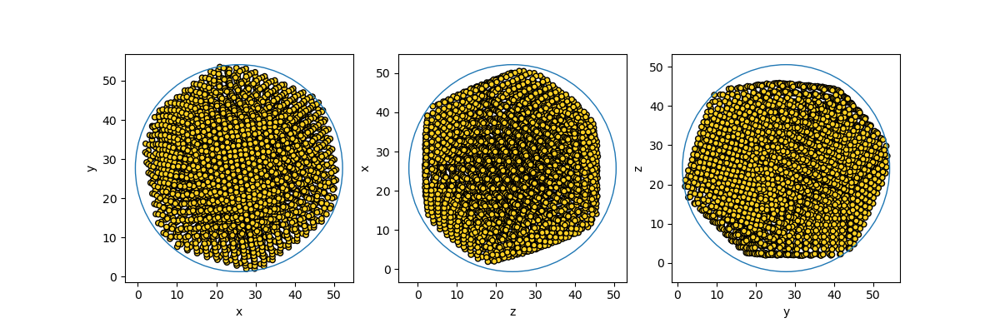

In [49]:
for obj in obj_list:
    display(obj)

### Surfactant measures

In [50]:
query = {
    'metadata.project': project_id,
    'metadata.type': 'png_file',
    'metadata.step': {'$regex': 'SurfactantMoleculeMeasures'}
}

In [51]:
# use underlying MongoDB functionality to check total number of documents matching query
fp.filepad.count_documents(query)

1

In [52]:
# check files degenerate by 'metadata.type' ad 'metadata.name'

aggregation_pipeline = [
    {
        "$match": query
    },
    {
        "$sort": { 
            "metadata.datetime": pymongo.DESCENDING,
        }
    },
]

cursor = fp.filepad.aggregate(aggregation_pipeline)

obj_list = []
for i, c in enumerate(cursor): 
    content, metadata = fp.get_file_by_id(c["gfs_id"])
    with tempfile.NamedTemporaryFile(suffix='.png') as tmp:
        tmp.write(content)
        obj_list.append(Image(filename=tmp.name)) 
    print('.',end='')

.

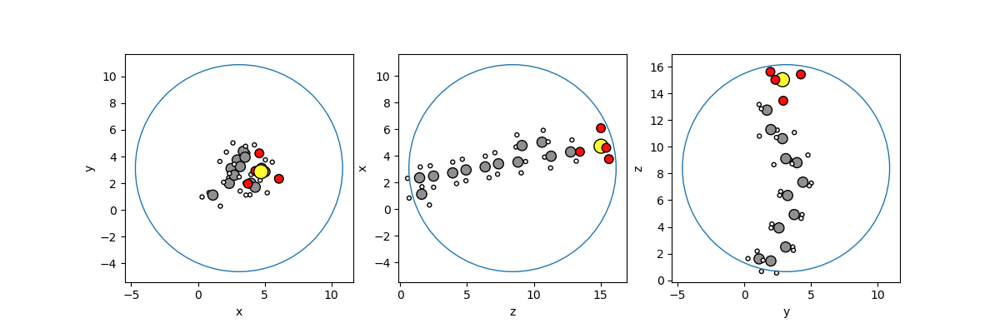

In [53]:
obj_list[0]

### Packing constraints

In [54]:
query = {
    'metadata.project': project_id,
    'metadata.type': 'png_file',
    'metadata.step': {'$regex': 'PackingConstraintSpheres'}
}

In [55]:
# use underlying MongoDB functionality to check total number of documents matching query
fp.filepad.count_documents(query)

1

In [56]:
# check files degenerate by 'metadata.type' ad 'metadata.name'

aggregation_pipeline = [
    {
        "$match": query
    },
    {
        "$sort": { 
            "metadata.datetime": pymongo.DESCENDING,
        }
    },
]

cursor = fp.filepad.aggregate(aggregation_pipeline)

obj_list = []
for i, c in enumerate(cursor): 
    content, metadata = fp.get_file_by_id(c["gfs_id"])
    with tempfile.NamedTemporaryFile(suffix='.png') as tmp:
        tmp.write(content)
        obj_list.append(Image(filename=tmp.name)) 
    print('.',end='')

.

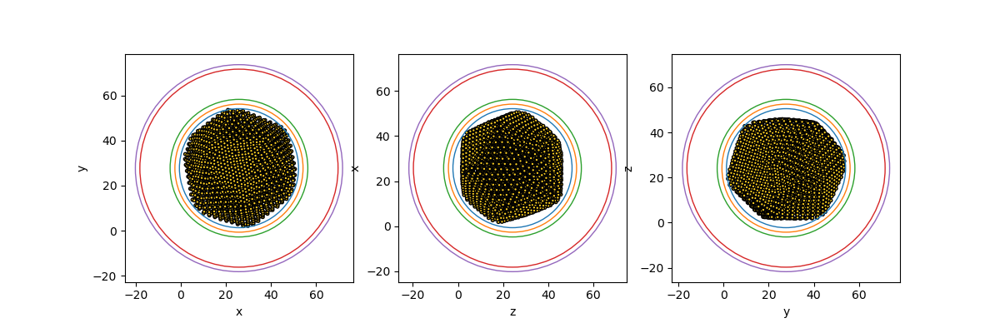

In [57]:
obj_list[0]

### Packed film

In [58]:
query = {
    'metadata.project': project_id,
    'metadata.type': 'png_file',
    'metadata.step': {'$regex': 'SphericalSurfactantPacking'}
}

In [59]:
# use underlying MongoDB functionality to check total number of documents matching query
fp.filepad.count_documents(query)

12

In [60]:
# check files degenerate by 'metadata.type' ad 'metadata.name'

aggregation_pipeline = [
    {
        "$match": query
    },
    {
        "$sort": { 
            "metadata.datetime": pymongo.DESCENDING,
        }
    },
]

cursor = fp.filepad.aggregate(aggregation_pipeline)

obj_list = []
for i, c in enumerate(cursor): 
    content, metadata = fp.get_file_by_id(c["gfs_id"])
    with tempfile.NamedTemporaryFile(suffix='.png') as tmp:
        tmp.write(content)
        obj_list.append(Image(filename=tmp.name)) 
    print('.',end='')

............

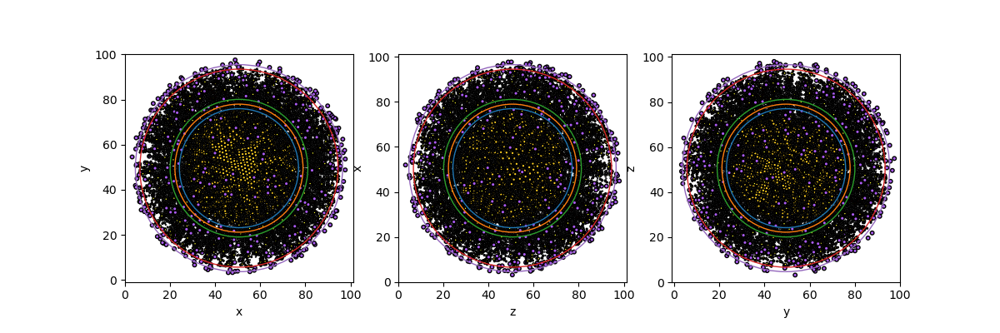

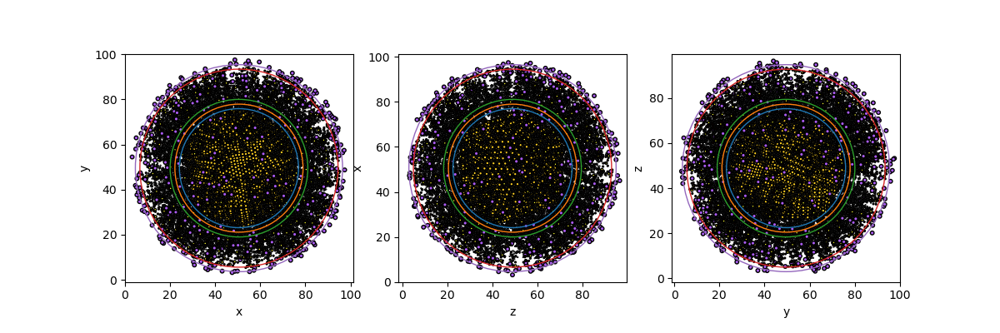

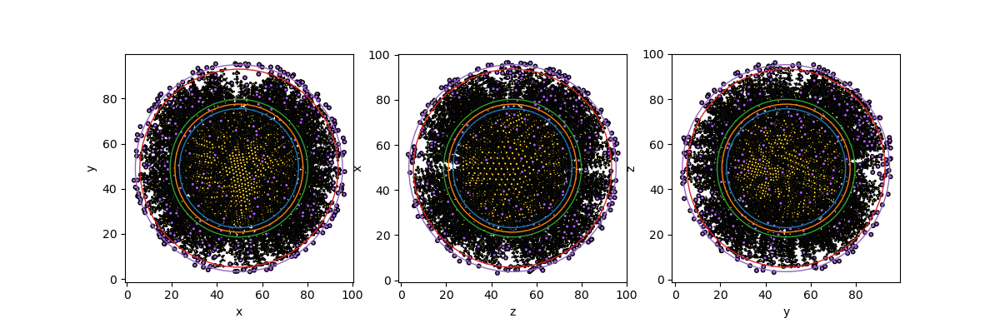

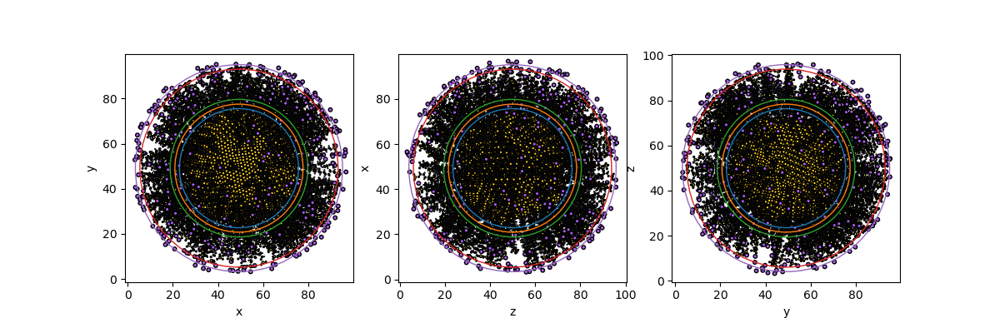

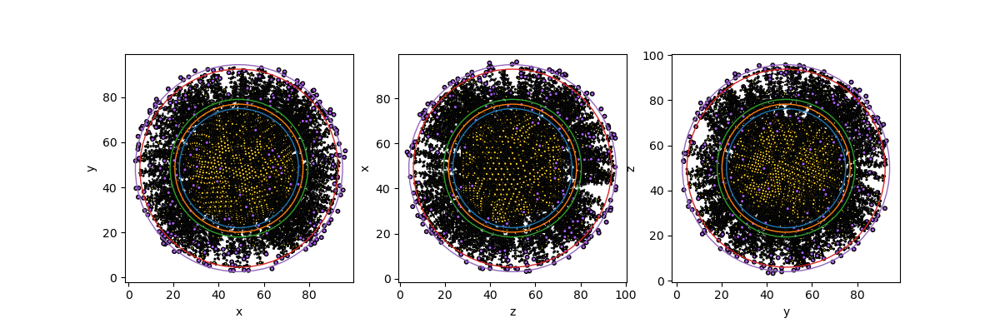

...

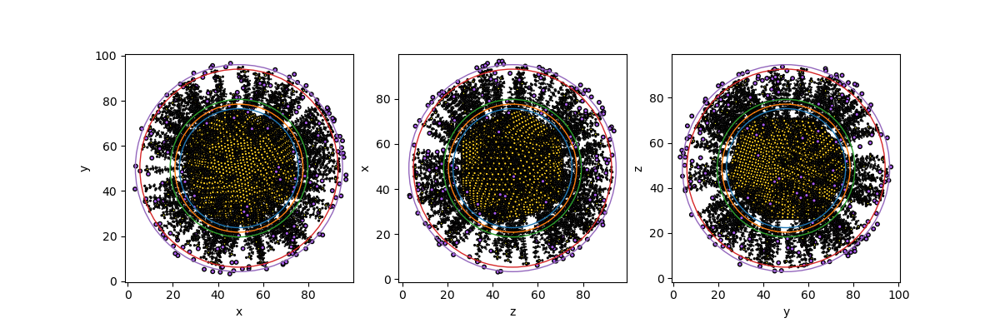

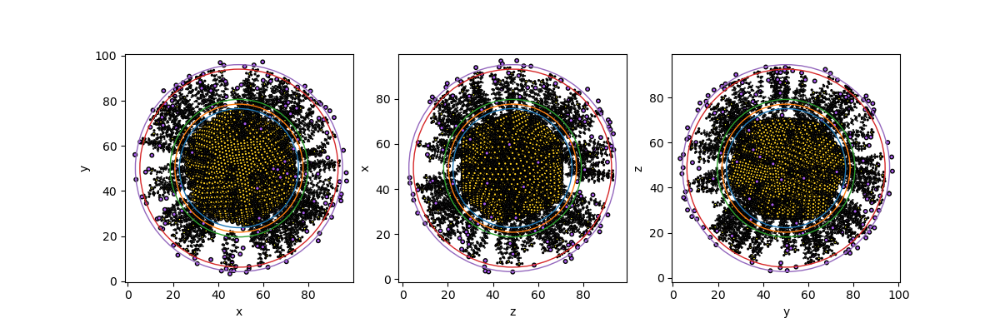

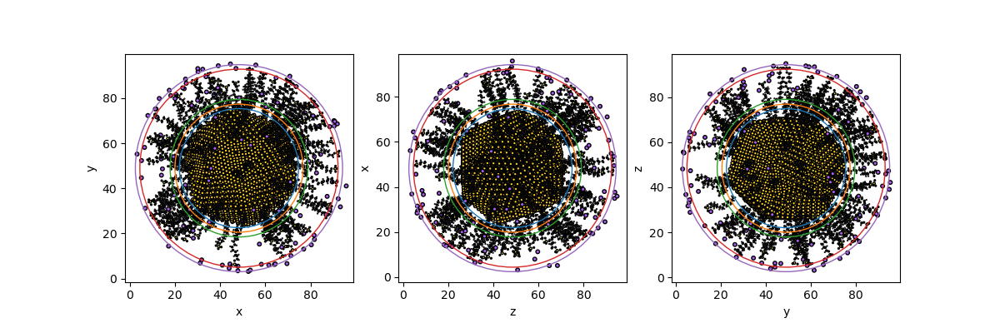

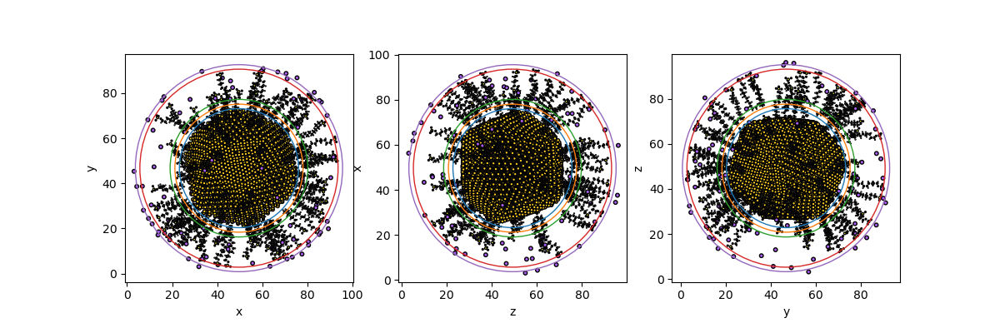

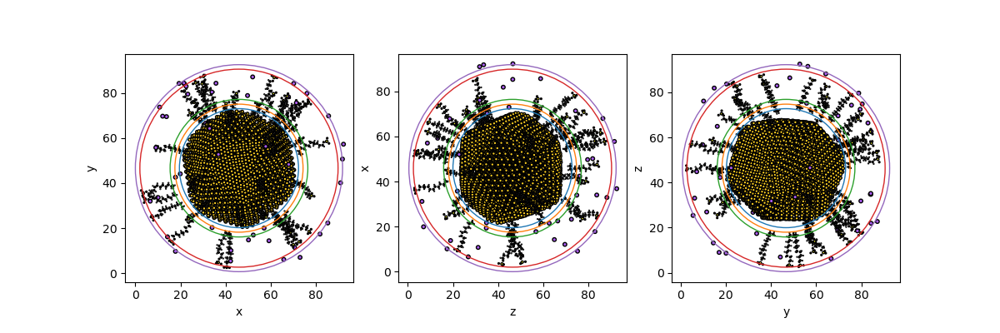

In [61]:
for obj in obj_list:
    display(obj)

## Energy minimization analysis

### Overview on objects in step

In [62]:
# queries to the data base are simple dictionaries
query = {
    'metadata.project': project_id,
    'metadata.step': 'GromacsEnergyMinimization:ProcessAnalyzeAndVisualize:push_filepad'
}

In [63]:
# use underlying MongoDB functionality to check total number of documents matching query
fp.filepad.count_documents(query)

228

In [64]:
# check files degenerate by 'metadata.type' ad 'metadata.name'
aggregation_pipeline = [
    {
        "$match": query
    },
    {  # group by unique project id
        "$group": { 
            "_id": { 
                'type': '$metadata.type',
                'name': '$metadata.name',
            },
            "object_count": {"$sum": 1}, # count matching data sets
            "earliest":  {'$min': '$metadata.datetime' },
            "latest":  {'$max': '$metadata.datetime' },
        },
    },
    {  # sort by earliest date, descending
        "$sort": { 
            "earliest": pymongo.DESCENDING,
        }
    }
]

cursor = fp.filepad.aggregate(aggregation_pipeline)

res = [ {**c['_id'], **c} for c in cursor]
columns = ['type', 'name', 'earliest', 'latest', 'object_count', '_id']
res_df = pd.DataFrame(data=res, columns=columns) # pandas Dataframe is just nice for printing in notebook
del res_df["_id"]

In [65]:
res_df

,type,name,earliest,latest,object_count
0,mp4_file,NaN,2020-07-19 22:53:00.059128,2020-07-19 22:53:01.277341,12
1,surfactant_tail_rmsd,NaN,2020-07-19 22:53:00.059126,2020-07-19 22:53:01.277336,12
2,surfactant_head_rmsd,NaN,2020-07-19 22:53:00.059123,2020-07-19 22:53:01.277331,12
3,substrate_rmsd,NaN,2020-07-19 22:53:00.059121,2020-07-19 22:53:01.277327,12
4,counterion_rmsd,NaN,2020-07-19 22:53:00.059119,2020-07-19 22:53:01.277323,12
5,surfactant_tail_surfactant_tail_rdf,NaN,2020-07-19 22:53:00.059116,2020-07-19 22:53:01.277319,12
6,surfactant_head_surfactant_tail_rdf,NaN,2020-07-19 22:53:00.059114,2020-07-19 22:53:01.277316,12
7,surfactant_head_surfactant_head_rdf,NaN,2020-07-19 22:53:00.059112,2020-07-19 22:53:01.277312,12
8,substrate_surfactant_tail_rdf,NaN,2020-07-19 22:53:00.059110,2020-07-19 22:53:01.277309,12
9,substrate_surfactant_head_rdf,NaN,2020-07-19 22:53:00.059107,2020-07-19 22:53:01.277305,12


### Global observables

In [66]:
query = { 
    "metadata.project": project_id,
    'metadata.step': 'GromacsEnergyMinimization:ProcessAnalyzeAndVisualize:push_filepad',  #{'$regex': 'GromacsEnergyMinimization'}
    "metadata.type": 'energy_file',
}
fp.filepad.count_documents(query)

12

In [67]:
parameter_dict = {'nmolecules': 'metadata.system.surfactant.nmolecules'}

In [68]:
aggregation_pipeline = [
    {
        "$match": query
    },
    {
        "$sort": { 
            "metadata.datetime": pymongo.DESCENDING,
        }
    },
    { 
        "$group": { 
            "_id": { field: '${}'.format(key) for field, key in parameter_dict.items() },
            "degeneracy": {"$sum": 1}, # number matching data sets
            "latest":     {"$first": "$gfs_id"} # unique gridfs id of file
        }
    },
]

cursor = fp.filepad.aggregate(aggregation_pipeline)

In [69]:
[ c for c in cursor]

[{'_id': {'nmolecules': 350},
  'degeneracy': 1,
  'latest': '5f14c2357dc9cfbf449d1a06'},
 {'_id': {'nmolecules': 525},
  'degeneracy': 1,
  'latest': '5f14bbd47dc9cfbf449d0d38'},
 {'_id': {'nmolecules': 263},
  'degeneracy': 1,
  'latest': '5f14dec37dc9cfbf449dfa1e'},
 {'_id': {'nmolecules': 481},
  'degeneracy': 1,
  'latest': '5f14bcd27dc9cfbf449d0ee1'},
 {'_id': {'nmolecules': 306},
  'degeneracy': 1,
  'latest': '5f14d0d67dc9cfbf449d8dd9'},
 {'_id': {'nmolecules': 219},
  'degeneracy': 1,
  'latest': '5f14e7727dc9cfbf449e3415'},
 {'_id': {'nmolecules': 175},
  'degeneracy': 1,
  'latest': '5f14edae7dc9cfbf449e67b0'},
 {'_id': {'nmolecules': 131},
  'degeneracy': 1,
  'latest': '5f14f21d7dc9cfbf449e7c12'},
 {'_id': {'nmolecules': 88},
  'degeneracy': 1,
  'latest': '5f14fe407dc9cfbf449ee191'},
 {'_id': {'nmolecules': 44},
  'degeneracy': 1,
  'latest': '5f14ff647dc9cfbf449eef29'},
 {'_id': {'nmolecules': 438},
  'degeneracy': 1,
  'latest': '5f14bd2c7dc9cfbf449d0fe3'},
 {'_id': {'n

In [70]:
res_mi_list = []

aggregation_pipeline = [
    {
        "$match": query
    },
    {
        "$sort": { 
            "metadata.datetime": pymongo.DESCENDING,
        }
    },
    { 
        "$group": { 
            "_id": { field: '${}'.format(key) for field, key in parameter_dict.items() },
            "degeneracy": {"$sum": 1}, # number matching data sets
            "latest":     {"$first": "$gfs_id"} # unique gridfs id of file
        }
    },
]

cursor = fp.filepad.aggregate(aggregation_pipeline)

for i, c in enumerate(cursor): 
    content, metadata = fp.get_file_by_id(c["latest"])
    with tempfile.NamedTemporaryFile(suffix='.edr') as tmp:
        tmp.write(content)
        em_df = panedr.edr_to_df(tmp.name)
        
        mi = pd.MultiIndex.from_product(
            [c["_id"].values(),em_df.index],
            names=[*c["_id"].keys(),'step'])
        em_mi_df = em_df.set_index(mi)        
        res_mi_list.append(em_mi_df)
    print('.',end='')
print('')

res_mi_df = pd.concat(res_mi_list)
res_df = res_mi_df.reset_index()

............


In [71]:
res_mi_df

Time          Bond           U-B   Proper Dih.  \
nmolecules step                                                       
175        0.0        0.0  70977.585938  41767.292969   6486.596680   
           1.0        1.0  70512.937500  41704.984375   6486.666504   
           2.0        2.0  69955.039062  41630.210938   6486.758301   
           3.0        3.0  69285.273438  41540.414062   6486.883301   
           4.0        4.0  68480.921875  41432.589844   6487.045898   
...                   ...           ...           ...           ...   
525        9994.0  9994.0    783.403870  40738.222656  14467.318359   
           9995.0  9995.0    783.662354  40741.503906  14467.341797   
           9997.0  9997.0    782.888550  40739.394531  14467.355469   
           9998.0  9998.0    784.021301  40741.851562  14467.424805   
           9999.0  9999.0    782.983643  40738.820312  14467.438477   

                         LJ-14     Coulomb-14      LJ (SR)   Coulomb (SR)  \
nmolecules step                                                             
175        0.0     4012.422852   46502.460938 -586426.3125  -73249.890625   
           1.0     4006.664307   46499.429688 -586434.1250  -73255.750000   
           2.0     3999.720459   46495.757812 -586443.4375  -73262.828125   
           3.0     3991.342285   46491.343750 -586454.6250  -73271.359375   
           4.0     3981.211426   46486.011719 -586467.9375  -73281.664062   
...                        ...            ...          ...            ...   
525        9994.0  3326.141357  135453.031250 -600861.2500 -381380.687500   
           9995.0  3325.624512  135452.625000 -600862.6875 -381382.312500   
           9997.0  3325.936279  135452.843750 -600862.0000 -381381.843750   
           9998.0  3325.574219  135452.546875 -600863.4375 -381383.937500   
           9999.0  3326.022217  135452.859375 -600862.5000 -381383.125000   

                   ...  Pres-YX  Pres-YY  Pres-YZ  Pres-ZX  Pres-ZY  Pres-ZZ  \
nmolecules step    ...                                                         
175        0.0     ...      0.0      0.0      0.0      0.0      0.0      0.0   
           1.0     ...      0.0      0.0      0.0      0.0      0.0      0.0   
           2.0     ...      0.0      0.0      0.0      0.0      0.0      0.0   
           3.0     ...      0.0      0.0      0.0      0.0      0.0      0.0   
           4.0     ...      0.0      0.0      0.0      0.0      0.0      0.0   
...                ...      ...      ...      ...      ...      ...      ...   
525        9994.0  ...      0.0      0.0      0.0      0.0      0.0      0.0   
           9995.0  ...      0.0      0.0      0.0      0.0      0.0      0.0   
           9997.0  ...      0.0      0.0      0.0      0.0      0.0      0.0   
           9998.0  ...      0.0      0.0      0.0      0.0      0.0      0.0   
           9999.0  ...      0.0      0.0      0.0      0.0      0.0      0.0   

                   #Surf*SurfTen  T-rest  
nmolecules step                           
175        0.0               0.0     0.0  
           1.0               0.0     0.0  
           2.0               0.0     0.0  
           3.0               0.0     0.0  
           4.0               0.0     0.0  
...                          ...     ...  
525        9994.0            0.0     0.0  
           9995.0            0.0     0.0  
           9997.0            0.0     0.0  
           9998.0            0.0     0.0  
           9999.0            0.0     0.0  

[93789 rows x 31 columns]

In [72]:
res_df

,nmolecules,step,Time,Bond,U-B,Proper Dih.,LJ-14,Coulomb-14,...,Pres-YX,Pres-YY,Pres-YZ,Pres-ZX,Pres-ZY,Pres-ZZ,#Surf*SurfTen,T-rest
0,175,0.0,0.0,70977.585938,41767.292969,6486.596680,4012.422852,46502.460938,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,175,1.0,1.0,70512.937500,41704.984375,6486.666504,4006.664307,46499.429688,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,175,2.0,2.0,69955.039062,41630.210938,6486.758301,3999.720459,46495.757812,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,175,3.0,3.0,69285.273438,41540.414062,6486.883301,3991.342285,46491.343750,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,175,4.0,4.0,68480.921875,41432.589844,6487.045898,3981.211426,46486.011719,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
93784,525,9994.0,9994.0,783.403870,40738.222656,14467.318359,3326.141357,135453.031250,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
93785,525,9995.0,9995.0,783.662354,40741.503906,14467.341797,3325.624512,135452.625000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
93786,525,9997.0,9997.0,782.888550,40739.394531,14467.355469,3325.936279,135452.843750,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
93787,525,9998.0,9998.0,784.021301,40741.851562,14467.424805,3325.574219,135452.546875,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


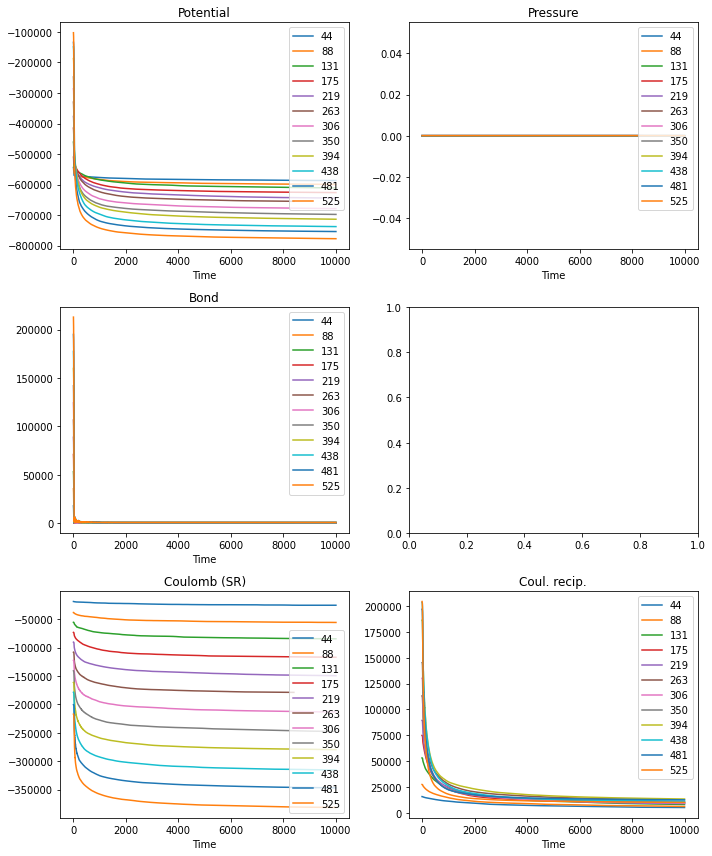

In [73]:
y_quantities = [
    'Potential',
    'Pressure',
    'Bond',
    'Coulomb (SR)',
    'Coul. recip.',
    ]

positions = [
    (0,0),
    (0,1),
    (1,0),
    (2,0),
    (2,1),
]
fig, ax = plt.subplots(3,2,figsize=(10,12))
for key, grp in res_df.groupby(['nmolecules']):
    for y_quantity, position in zip(y_quantities, positions):
        grp.plot('Time',y_quantity,ax=ax[position],label=key,title=y_quantity)
        
fig.tight_layout()

###  Visualize trajectory

In [74]:
query = {
    'metadata.project': project_id,
    'metadata.step': 'GromacsEnergyMinimization:ProcessAnalyzeAndVisualize:push_filepad',
    'metadata.type': 'mp4_file',
}

In [75]:
# use underlying MongoDB functionality to check total number of documents matching query
fp.filepad.count_documents(query)

12

In [76]:
# check files degenerate by 'metadata.type' ad 'metadata.name'

aggregation_pipeline = [
    {
        "$match": query
    },
    {  # group by unique project id
        "$group": { 
            "_id": { 
                'type': '$metadata.type',
                'name': '$metadata.name',
                'step': '$metadata.step',
            },
            "object_count": {"$sum": 1}, # count matching data sets
            "earliest":  {'$min': '$metadata.datetime' },
            "latest":  {'$max': '$metadata.datetime' },
        },
    },
    {  # sort by earliest date, descending
        "$sort": { 
            "earliest": pymongo.DESCENDING,
        }
    }
]

cursor = fp.filepad.aggregate(aggregation_pipeline)

res = [ {**c['_id'], **c} for c in cursor]
columns = ['step', 'type', 'name', 'earliest', 'latest', 'object_count', '_id']
res_df = pd.DataFrame(data=res, columns=columns) # pandas Dataframe is just nice for printing in notebook
del res_df["_id"]

In [77]:
res_df

,step,type,name,earliest,latest,object_count
0,GromacsEnergyMinimization:ProcessAnalyzeAndVisualize:push_filepad,mp4_file,NaN,2020-07-19 22:53:00.059128,2020-07-19 22:53:01.277341,12


In [78]:
aggregation_pipeline = [
    {
        "$match": query
    },
    {
        "$sort": { 
            "metadata.datetime": pymongo.DESCENDING,
        }
    },
]

cursor = fp.filepad.aggregate(aggregation_pipeline)

obj_list = []
for i, c in enumerate(cursor): 
    content, metadata = fp.get_file_by_id(c["gfs_id"])
    with tempfile.NamedTemporaryFile(suffix='.mp4',delete=False) as tmp:
        tmp.write(content)
        # obj_list.append(Video(filename=tmp.name)) 
        # obj_list.append(tmp.name)
        obj_list.append(Video.from_file(tmp.name))
    print('.',end='')

............

In [79]:
obj_list[-1]

Video(value=b'\x00\x00\x00 ftypisom\x00\x00\x02\x00isomiso2avc1mp41\x00\x00\x00\x08free\x00\x08|=mdat\x00\x00\…

## Pulling analysis

### Overview on objects in step

In [80]:
# queries to the data base are simple dictionaries
query = {
    'metadata.project': project_id,
    'metadata.step': 'GromacsPull:ProcessAnalyzeAndVisualize:push_filepad'
}

In [81]:
# use underlying MongoDB functionality to check total number of documents matching query
fp.filepad.count_documents(query)

276

In [82]:
# check files degenerate by 'metadata.type' ad 'metadata.name'
aggregation_pipeline = [
    {
        "$match": query
    },
    {  # group by unique project id
        "$group": { 
            "_id": { 
                'type': '$metadata.type',
                'name': '$metadata.name',
            },
            "object_count": {"$sum": 1}, # count matching data sets
            "earliest":  {'$min': '$metadata.datetime' },
            "latest":  {'$max': '$metadata.datetime' },
        },
    },
    {  # sort by earliest date, descending
        "$sort": { 
            "earliest": pymongo.DESCENDING,
        }
    }
]

cursor = fp.filepad.aggregate(aggregation_pipeline)

res = [ {**c['_id'], **c} for c in cursor]
columns = ['type', 'name', 'earliest', 'latest', 'object_count', '_id']
res_df = pd.DataFrame(data=res, columns=columns) # pandas Dataframe is just nice for printing in notebook
del res_df["_id"]

In [83]:
res_df

,type,name,earliest,latest,object_count
0,mp4_file,NaN,2020-07-19 22:53:00.070575,2020-07-19 22:53:01.288914,12
1,surfactant_tail_rmsd,NaN,2020-07-19 22:53:00.070573,2020-07-19 22:53:01.288912,12
2,surfactant_head_rmsd,NaN,2020-07-19 22:53:00.070571,2020-07-19 22:53:01.288908,12
3,substrate_rmsd,NaN,2020-07-19 22:53:00.070568,2020-07-19 22:53:01.288906,12
4,counterion_rmsd,NaN,2020-07-19 22:53:00.070566,2020-07-19 22:53:01.288904,12
5,surfactant_tail_surfactant_tail_rdf,NaN,2020-07-19 22:53:00.070564,2020-07-19 22:53:01.288901,12
6,surfactant_head_surfactant_tail_rdf,NaN,2020-07-19 22:53:00.070561,2020-07-19 22:53:01.288899,12
7,surfactant_head_surfactant_head_rdf,NaN,2020-07-19 22:53:00.070559,2020-07-19 22:53:01.288896,12
8,substrate_surfactant_tail_rdf,NaN,2020-07-19 22:53:00.070557,2020-07-19 22:53:01.288894,12
9,substrate_surfactant_head_rdf,NaN,2020-07-19 22:53:00.070554,2020-07-19 22:53:01.288891,12


### Global observables

The `gmx energy` table:

```
  1  Restraint-Pot.   2  U-B              3  Proper-Dih.      4  LJ-14         
  5  Coulomb-14       6  LJ-(SR)          7  Coulomb-(SR)     8  Coul.-recip.  
  9  Position-Rest.  10  COM-Pull-En.    11  Potential       12  Kinetic-En.   
 13  Total-Energy    14  Temperature     15  Pressure        16  Constr.-rmsd  
 17  Vir-XX          18  Vir-XY          19  Vir-XZ          20  Vir-YX        
 21  Vir-YY          22  Vir-YZ          23  Vir-ZX          24  Vir-ZY        
 25  Vir-ZZ          26  Pres-XX         27  Pres-XY         28  Pres-XZ       
 29  Pres-YX         30  Pres-YY         31  Pres-YZ         32  Pres-ZX       
 33  Pres-ZY         34  Pres-ZZ         35  #Surf*SurfTen   36  T-rest       
 ```
 converted to dict with regex
 
     \s+([0-9]+)\s+([^\s]+)
 
 and replacement
 
     '$2': $1,\n

In [84]:
gmx_energy_dict = {
    'Restraint-Pot.': 1,
    'U-B': 2,
    'Proper-Dih.': 3,
    'LJ-14': 4,
    'Coulomb-14': 5,
    'LJ-(SR)': 6,
    'Coulomb-(SR)': 7,
    'Coul.-recip.': 8,
    'Position-Rest.': 9,
    'COM-Pull-En.': 10,
    'Potential': 11,
    'Kinetic-En.': 12,
    'Total-Energy': 13,
    'Temperature': 14,
    'Pressure': 15,
    'Constr.-rmsd': 16,
    'Vir-XX': 17,
    'Vir-XY': 18,
    'Vir-XZ': 19,
    'Vir-YX': 20,
    'Vir-YY': 21,
    'Vir-YZ': 22,
    'Vir-ZX': 23,
    'Vir-ZY': 24,
    'Vir-ZZ': 25,
    'Pres-XX': 26,
    'Pres-XY': 27,
    'Pres-XZ': 28,
    'Pres-YX': 29,
    'Pres-YY': 30,
    'Pres-YZ': 31,
    'Pres-ZX': 32,
    'Pres-ZY': 33,
    'Pres-ZZ': 34,
    '#Surf*SurfTen': 35,
    'T-rest': 36,
}

In [85]:
query = { 
    "metadata.project": project_id,
    "metadata.type":    'energy_file',
    "metadata.step": "GromacsPull:ProcessAnalyzeAndVisualize:push_filepad",
}

fp.filepad.count_documents(query)

12

In [86]:
parameter_dict = {
    'nmolecules': 'metadata.system.surfactant.nmolecules'}

In [87]:
gmx_energy_selection = [
    'Restraint-Pot.',
    'Position-Rest.',
    'COM-Pull-En.',
    'Potential',
    'Kinetic-En.',
    'Total-Energy',
    'Temperature',
    'Pressure',
    'Constr.-rmsd',
]

In [88]:
res_list = []
failed_list = []

match_aggregation = {
        "$match": query
    }
sort_aggregation = {
        "$sort": { 
            "metadata.datetime": pymongo.DESCENDING,
        }
    }
group_aggregation = { 
    "$group": { 
        "_id": { field: '${}'.format(key) for field, key in parameter_dict.items() },
        "degeneracy": {"$sum": 1}, # number matching data sets
        "latest":     {"$first": "$gfs_id"} # unique gridfs id of file
    }
}
aggregation_pipeline = [ match_aggregation, sort_aggregation, group_aggregation ]
cursor = fp.filepad.aggregate(aggregation_pipeline)

res_df_list = []
for i, c in enumerate(cursor): 
    content, metadata = fp.get_file_by_id(c["latest"])
    nmolecules = int(c["_id"]["nmolecules"])
    
    #df = panedr.edr_to_df(tmp.name), fails
    tmpin = tempfile.NamedTemporaryFile(mode='w+b',suffix='.edr', delete=False)
    
    # cur_res_dict = {}
    with tmpin:
        tmpin.write(content)
        #tmpin.seek(0)
       
    res_df = None
    for sel in gmx_energy_selection:  
        try:
            tmpout = tempfile.NamedTemporaryFile(suffix='.xvg', delete=False)
            res = gromacs.energy(f=tmpin.name,o=tmpout.name,
                                 input=str(gmx_energy_dict[sel]))
            #with open(tmpout.name,'r') as f:
            #    xvg = f.read()
            #tmpout.delete()
            xvg = mda.auxiliary.XVG.XVGReader(tmpout.name)
            xvg_time = xvg.read_all_times()
            xvg_data = np.array([ f.data[1:] for f in xvg ]).flatten() # 1st entry contains times
            os.unlink(tmpout.name)
        except: 
            logger.warning("Failed to read '{:s}' from data set {:d}.".format(sel,i))
            failed_list.append((nmolecules, sel))
        else:
            r = {'nmolecules': [nmolecules]*len(xvg_time), 'time': xvg_time, sel: xvg_data}
            cur_df = pd.DataFrame(r)
            if res_df is None:
                res_df = cur_df
            else:
                res_df = pd.merge(res_df, cur_df, how='outer', on=['nmolecules', 'time'])
    res_df_list.append(res_df)
    os.unlink(tmpin.name)
    print('.',end='')
print('')
res_df = pd.concat(res_df_list)
res_df_mi = res_df.set_index(['nmolecules','time'])

............


In [89]:
res_df_mi

Restraint-Pot.  Position-Rest.  COM-Pull-En.    Potential  \
nmolecules time                                                              
88         0.00     1493.480591        0.000000      0.000531 -597754.6875   
           0.02      742.482788        0.014380      1.347937 -598352.1875   
           0.04      211.578461        0.258170      9.330186 -598732.2500   
           0.06       86.002968        1.406035     19.936806 -598830.5000   
           0.08       76.946274        3.596749     29.678221 -598815.8125   
           0.10       84.384720        8.241014     41.989948 -598852.6250   
           0.12       92.128899       15.452235     50.172047 -598762.7500   
           0.14       77.307365       23.783371     52.395569 -598822.8750   
           0.16       60.879116       35.931637     53.148029 -598735.3125   
           0.18       60.419201       52.029709     55.594635 -598739.5625   
           0.20       71.150993       69.232933     62.492477 -598731.8750   
44         0.00      328.474915        0.000000      0.000214 -586198.1875   
           0.02      154.236404        0.004559      0.571383 -586346.1250   
           0.04       37.618614        0.057044      3.940316 -586392.9375   
           0.06       13.926350        0.259215      8.321849 -586382.4375   
           0.08       14.375679        0.799992     12.601824 -586406.8125   
           0.10       31.645020        1.935078     17.939360 -586422.4375   
           0.12       38.431602        3.885602     21.493801 -586418.0000   
           0.14       22.140791        6.880564     22.757519 -586445.0000   
           0.16       10.551405       11.193547     23.809597 -586437.0625   
           0.18        4.676281       17.088915     26.599503 -586471.3125   
           0.20        3.778655       24.678282     31.761971 -586463.1875   
438        0.00     7758.632324        0.000000      0.003609 -728824.7500   
           0.02     3483.291748        0.044684      6.999135 -732201.1250   
           0.04      904.910156        1.917580     49.792530 -733586.1875   
           0.06      431.056061       10.018900    107.124191 -733629.4375   
           0.08      463.053925       24.228683    159.585251 -733499.8125   
           0.10      722.669312       42.863976    216.961929 -733307.8125   
           0.12      728.341125       64.390976    246.327728 -733277.0000   
           0.14      504.542664       88.204720    249.874741 -733450.3750   
           0.16      398.171021      113.320412    250.525116 -733193.1250   
           0.18      451.732758      139.405441    260.177277 -733258.3125   
           0.20      578.219666      165.859543    293.536987 -733307.0000   
394        0.00    11153.032227        0.000000      0.002766 -701380.5625   
           0.02     5175.661133        0.029903      9.719401 -705958.7500   
           0.04     1388.958374        1.713053     70.931076 -708225.8125   
           0.06      580.233398       10.463760    150.519775 -708553.9375   
           0.08      497.414459       27.786430    221.173691 -708173.5000   
           0.10      721.945679       56.056725    308.627136 -707836.1250   
           0.12      795.619202       95.645821    360.062439 -707478.8750   
           0.14      645.407593      141.712265    367.164978 -707640.2500   
           0.16      536.192871      190.179138    370.243866 -707199.5000   
           0.18      598.552185      240.939117    375.614685 -707394.4375   
           0.20      676.540894      286.954498    393.765961 -707266.6875   
350        0.00     7545.695801        0.000000      0.002528 -689301.0000   
           0.02     3466.935547        0.022239      8.092226 -692411.8750   
           0.04     1004.460327        0.674029     57.397018 -693776.4375   
           0.06      508.296936        3.862727    121.058868 -693851.9375   
           0.08      447.073303       11.796712    178.167221 -693697.7500   
           0.10      540.257874       2

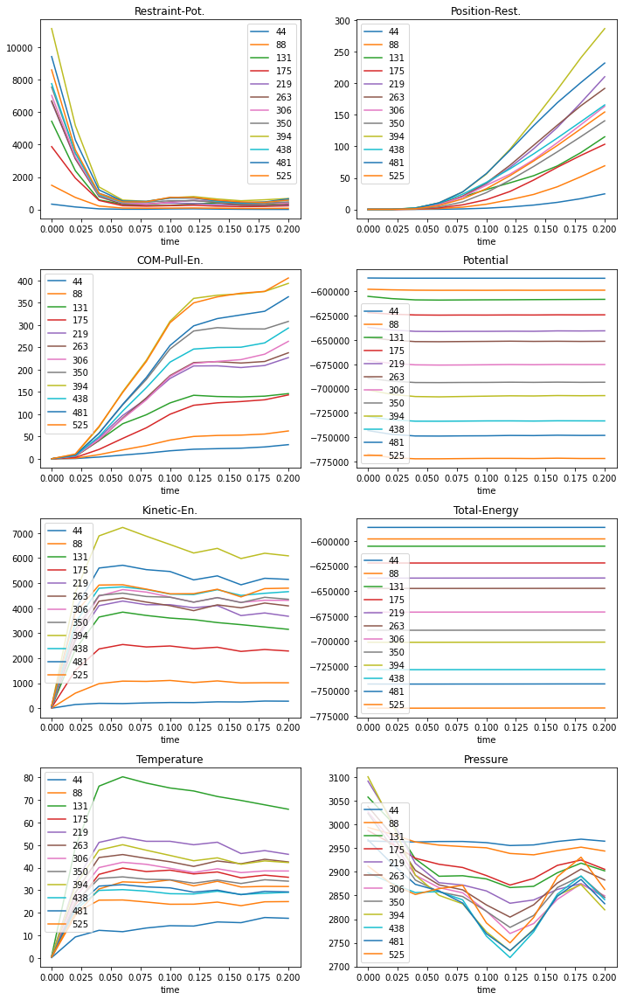

In [90]:
cols = 2
y_quantities = [
    'Restraint-Pot.',
    'Position-Rest.',
    'COM-Pull-En.',
    'Potential',
    'Kinetic-En.',
    'Total-Energy',
    'Temperature',
    'Pressure',
    'Constr.-rmsd',
    ]
n = len(y_quantities)
rows = round(n/cols)
positions = [(i,j) for i in range(rows) for j in range(cols)][:n]
fig, ax = plt.subplots(rows,cols,figsize=(5*cols,4*rows))
for key, grp in res_df.groupby(['nmolecules']):
    for y_quantity, position in zip(y_quantities, positions):
        grp.plot('time',y_quantity,ax=ax[position],label=key,title=y_quantity)
        
fig.tight_layout()

### Pulling forces

In [91]:
res_df_list = []
failed_list = []

query = { 
    "metadata.project": project_id,
    "metadata.step": "GromacsPull:ProcessAnalyzeAndVisualize:push_filepad",
    "metadata.type": 'pullf_file',
}

fp.filepad.count_documents(query)
match_aggregation = {
        "$match": query
    }
sort_aggregation = {
        "$sort": { 
            "metadata.datetime": pymongo.DESCENDING,
        }
    }
group_aggregation = { 
    "$group": { 
        "_id": { field: '${}'.format(key) for field, key in parameter_dict.items() },
        "degeneracy": {"$sum": 1}, # number matching data sets
        "latest":     {"$first": "$gfs_id"} # unique gridfs id of file
    }
}
aggregation_pipeline = [ match_aggregation, sort_aggregation, group_aggregation ]
cursor = fp.filepad.aggregate(aggregation_pipeline)

for i, c in enumerate(cursor): 
    content, metadata = fp.get_file_by_id(c["latest"])
    nmolecules = int(c["_id"]["nmolecules"])
    
    tmpin = tempfile.NamedTemporaryFile(mode='w+b',suffix='.xvg', delete=False)
    
    with tmpin:
        tmpin.write(content)
        
    try:
        xvg = mda.auxiliary.XVG.XVGReader(tmpin.name)
        xvg_time = xvg.read_all_times()
        xvg_data = np.array([ f.data[1:] for f in xvg ])# .flatten() # 1st entry contains times
    except: 
        logger.warning("Failed to read data set {:d}.".format(i))
        failed_list.append(nmolecules)
    else:
        res_df_list.append(pd.DataFrame({
            'nmolecules': np.array([nmolecules]*len(xvg_time), dtype=int),
            'time': xvg_time, 
            **{i: xvg_data[:,i] for i in range(nmolecules)}
        }))
    os.unlink(tmpin.name)
    print('.',end='')
print('')
res_df = pd.concat(res_df_list)
res_df_mi = res_df.set_index(['nmolecules','time'])

............


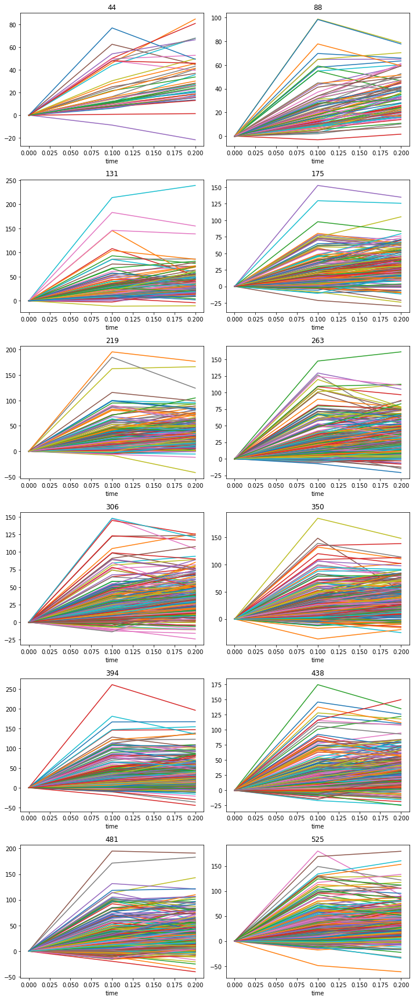

In [92]:
# pulling forces
n = len(res_df['nmolecules'].unique())
cols = 2 if n > 1 else 1
rows = round(n/cols)
if rows > 1:
    positions = [(i,j) for i in range(rows) for j in range(cols)][:n]
else:
    positions = [i for i in range(cols)][:n]
    
fig, ax = plt.subplots(rows,cols,figsize=(5*cols,4*rows))
if not isinstance(ax, Iterable):
    ax = [ax]
for pos, (key, grp) in zip(positions,res_df.groupby(['nmolecules'])):
    columns = list(set(grp.columns) - set(['nmolecules','time']))
    grp.plot('time', columns, ax=ax[pos],title=key,legend=None)
fig.tight_layout()

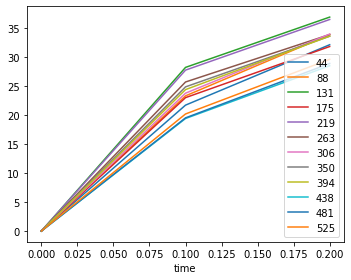

In [93]:
# mean pulling force
fig, ax = plt.subplots(1,1,figsize=(5,4))
for key, grp in res_df.groupby(['nmolecules']):
    columns = list(set(grp.columns) - set(['nmolecules','time']))
    grp = grp.set_index('time')
    grp = grp.drop(columns='nmolecules')
    grp.mean(axis=1).plot(legend=True, label=key, ax=ax)
fig.tight_layout()
#fig.legend()

### Pulling groups movement

In [94]:
res_df_list = []
failed_list = []

query = { 
    "metadata.project": project_id,
    "metadata.step": "GromacsPull:ProcessAnalyzeAndVisualize:push_filepad",
    "metadata.type":    'pullx_file',
}

fp.filepad.count_documents(query)
match_aggregation = {
        "$match": query
    }
sort_aggregation = {
        "$sort": { 
            "metadata.datetime": pymongo.DESCENDING,
        }
    }
group_aggregation = { 
    "$group": { 
        "_id": { field: '${}'.format(key) for field, key in parameter_dict.items() },
        "degeneracy": {"$sum": 1}, # number matching data sets
        "latest":     {"$first": "$gfs_id"} # unique gridfs id of file
    }
}
aggregation_pipeline = [ match_aggregation, sort_aggregation, group_aggregation ]
cursor = fp.filepad.aggregate(aggregation_pipeline)


for i, c in enumerate(cursor): 
    print(c["_id"])
    content, metadata = fp.get_file_by_id(c["latest"])
    nmolecules = int(c["_id"]["nmolecules"])  # int(metadata["metadata"]["nmolecules"])
    
    tmpin = tempfile.NamedTemporaryFile(mode='w+b',suffix='.xvg', delete=False)
    
    with tmpin:
        tmpin.write(content)
        
    try:
        xvg = gromacs.fileformats.XVG(tmpin.name)
        xvg_time = xvg.array[0,:]
        
        #xvg_labels = ['1', '1 ref', '1 dX', '1 dY', '1 dZ', '1 g 1 X', '1 g 1 Y', '1 g 1 Z', '1 g 2 X', '1 g 2 Y', '1 g 2 Z']
        N_pull_coords = nmolecules
        N_cols = len(xvg.names)
        N_cols_per_coord = int(N_cols / N_pull_coords)
        
        xvg_labels = xvg.names[:N_cols_per_coord]
        xvg_data = {}
        for j in range(N_pull_coords):
            for k in range(N_cols_per_coord):
                xvg_data[(j,xvg_labels[k])] = xvg.array[
                    1+j*N_cols_per_coord+k,:]
        
    except: 
        logger.exception("Failed to read data set {:d}.".format(i))
        failed_list.append(nmolecules)

    else:
        res_df_list.append(pd.DataFrame({
            'nmolecules': np.array([nmolecules]*len(xvg_time), dtype=int),
            'time': xvg_time, 
            **xvg_data # {i: xvg_data[:,i] for i in range(nmolecules)}
        }))
    os.unlink(tmpin.name)
res_df = pd.concat(res_df_list)
res_df_mi = res_df.set_index(['nmolecules','time'])
res_df_mi.columns = pd.MultiIndex.from_tuples(res_df_mi.columns, names=['nmolecule', 'coord'])

{'nmolecules': 481}
{'nmolecules': 438}
{'nmolecules': 394}
{'nmolecules': 350}
{'nmolecules': 263}
{'nmolecules': 219}
{'nmolecules': 175}
{'nmolecules': 131}
{'nmolecules': 306}
{'nmolecules': 44}
{'nmolecules': 525}
{'nmolecules': 88}


In [95]:
res_df_mi

nmolecule            0                                                   \
coord                  1    1 ref      1 dX      1 dY      1 dZ 1 g 1 X   
nmolecules time                                                           
481        0.0   3.02906  3.02901  2.669190  0.972790 -1.050880   6.799   
           0.2   3.03794  3.04901  2.673090  0.983246 -1.056830   6.799   
438        0.0   3.06981  3.06970 -1.695070 -0.217678  2.550120   6.789   
           0.2   3.05914  3.08970 -1.693620 -0.208617  2.538990   6.789   
394        0.0   3.05858  3.05857  1.789350  2.047640  1.400090   6.749   
           0.2   3.05402  3.07857  1.785950  2.048270  1.393560   6.749   
350        0.0   2.91510  2.91528  1.507870 -1.258800 -2.153960   6.720   
           0.2   2.91157  2.93528  1.523610 -1.230070 -2.154710   6.720   
263        0.0   3.09102  3.09096  1.908980 -1.902280  1.513770   6.719   
           0.2   3.11048  3.11096  1.924900 -1.903870  1.531380   6.719   
219        0.0   3.08224  3.08202 -1.097430 -2.056400  2.016690   6.783   
           0.2   3.09812  3.10202 -1.135390 -2.050320  2.026190   6.783   
175        0.0   2.98740  2.98736 -1.122020  2.768040 -0.059902   6.715   
           0.2   2.98779  3.00736 -1.125900  2.766770 -0.064975   6.715   
131        0.0   3.09045  3.09024 -0.850902 -1.544340  2.538080   6.785   
           0.2   3.08927  3.11024 -0.843101 -1.545660  2.538450   6.785   
306        0.0   2.99688  2.99656  2.234560 -1.989880  0.168659   6.785   
           0.2   2.98128  3.01656  2.212180 -1.992180  0.159765   6.785   
44         0.0   2.87939  2.87932  2.060960  1.771370 -0.951617   6.660   
           0.2   2.88188  2.89932  2.055500  1.778930 -0.956850   6.660   
525        0.0   3.04277  3.04264 -3.012120 -0.408986  0.135390   6.778   
           0.2   3.05486  3.06264 -3.021620 -0.423459  0.150595   6.778   
88         0.0   2.96425  2.96426  2.212950  0.236086 -1.958030   6.624   
           0.2   2.92075  2.98426  2.210040  0.260372 -1.891750   6.624   

nmolecule                        ...       524                           \
coord           1 g 1 Y 1 g 1 Z  ...      1 dY     1 dZ 1 g 1 X 1 g 1 Y   
nmolecules time                  ...                                      
481        0.0    6.864   6.719  ...       NaN      NaN     NaN     NaN   
           0.2    6.864   6.719  ...       NaN      NaN     NaN     NaN   
438        0.0    6.821   6.695  ...       NaN      NaN     NaN     NaN   
           0.2    6.821   6.695  ...       NaN      NaN     NaN     NaN   
394        0.0    6.708   6.695  ...       NaN      NaN     NaN     NaN   
           0.2    6.708   6.695  ...       NaN      NaN     NaN     NaN   
350        0.0    6.803   6.789  ...       NaN      NaN     NaN     NaN   
           0.2    6.803   6.789  ...       NaN      NaN     NaN     NaN   
263        0.0    6.928   6.938  ...       NaN      NaN     NaN     NaN   
           0.2    6.928   6.938  ...       NaN      NaN     NaN     NaN   
219        0.0    6.773   6.687  ...       NaN      NaN     NaN     NaN   
           0.2    6.773   6.687  ...       NaN      NaN     NaN     NaN   
175        0.0    6.790   6.825  ...       NaN      NaN     NaN     NaN   
           0.2    6.790   6.825  ...       NaN      NaN     NaN     NaN   
131        0.0    6.624   6.675  ...       NaN      NaN     NaN     NaN   
           0.2    6.624   6.675  ...       NaN      NaN     NaN     NaN   
306        0.0    6.759   6.790  ...       NaN      NaN     NaN     NaN   
           0.2    6.759   6.790  ...       NaN      NaN     NaN     NaN   
44         0.0    6.627   6.730  ...       NaN      NaN     NaN     NaN   
           0.2    6.627   6.730  ...       NaN      NaN     NaN     NaN   
525        0.0    6.802   6.763  ... -0.989800  2.01098   6.778   6.802   
           0.2    6.802   6.763  ... -0.956393  2.01185   6.778   6.802   
88         0.0    6.903   6.676  ...       NaN      NaN     NaN     NaN   
           0.2    6.903 

In [96]:
res_df = res_df_mi.groupby(axis=1,level='coord').mean().reset_index()

In [97]:
res_df

coord,nmolecules,time,1,1 dX,1 dY,1 dZ,1 g 1 X,1 g 1 Y,1 g 1 Z,1 g 2 X,1 g 2 Y,1 g 2 Z,1 ref
0,481,0.0,3.034603,-0.014782,-0.072324,0.067737,6.799,6.864,6.719,6.784223,6.791673,6.786737,3.034543
1,481,0.2,3.025667,-0.013379,-0.071653,0.067348,6.799,6.864,6.719,6.785626,6.792344,6.786349,3.054543
2,438,0.0,3.034992,-0.005472,-0.046267,0.093900,6.789,6.821,6.695,6.783532,6.774730,6.788901,3.034932
3,438,0.2,3.026447,-0.006146,-0.046641,0.094356,6.789,6.821,6.695,6.782858,6.774356,6.789357,3.054932
4,394,0.0,3.039270,0.042538,0.071386,0.102983,6.749,6.708,6.695,6.791542,6.779382,6.797985,3.039219
5,394,0.2,3.025625,0.040787,0.071826,0.102654,6.749,6.708,6.695,6.789791,6.779823,6.797655,3.059219
6,350,0.0,3.036760,0.080290,-0.023688,0.004388,6.720,6.803,6.789,6.800295,6.779309,6.793390,3.036711
7,350,0.2,3.023129,0.081602,-0.021021,0.004253,6.720,6.803,6.789,6.801606,6.781976,6.793254,3.056711
8,263,0.0,3.037367,0.090980,-0.167417,-0.159162,6.719,6.928,6.938,6.809985,6.760580,6.778839,3.037313
9,263,0.2,3.023441,0.092386,-0.165892,-0.159699,6.719,6.928,6.938,6.811390,6.762104,6.778302,3.057313


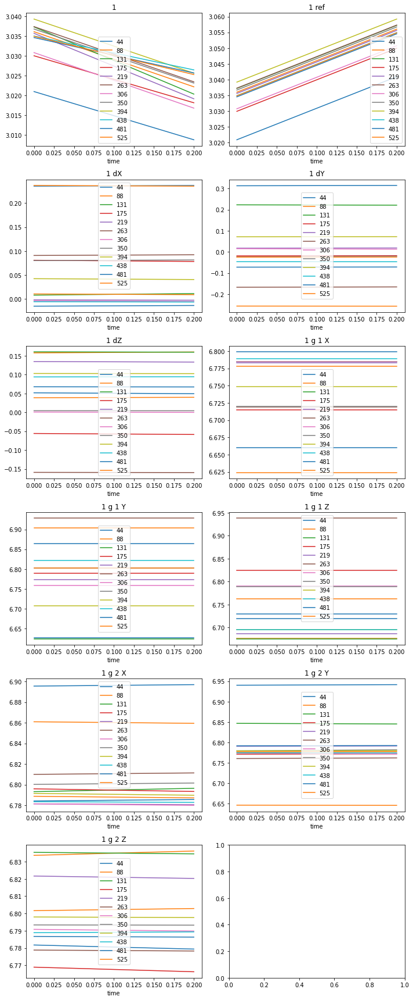

In [98]:
cols = 2
y_quantities = [
    '1', 
    '1 ref', 
    '1 dX', 
    '1 dY', 
    '1 dZ', 
    '1 g 1 X', 
    '1 g 1 Y', 
    '1 g 1 Z', 
    '1 g 2 X', 
    '1 g 2 Y', 
    '1 g 2 Z'
]
n = len(y_quantities)
rows = round(n/cols)
positions = [(i,j) for i in range(rows) for j in range(cols)][:n]
fig, ax = plt.subplots(rows,cols,figsize=(5*cols,4*rows))
for key, grp in res_df.groupby(['nmolecules']):
    for y_quantity, position in zip(y_quantities, positions):
        grp.plot('time',y_quantity,ax=ax[position],label=key,title=y_quantity)
        
fig.tight_layout()

###  Rendered videos

In [99]:
query = {
    'metadata.project': project_id,
    'metadata.step': 'GromacsPull:ProcessAnalyzeAndVisualize:push_filepad',
    'metadata.type': 'mp4_file',
}

In [100]:
# use underlying MongoDB functionality to check total number of documents matching query
fp.filepad.count_documents(query)

12

In [101]:
# check files degenerate by 'metadata.type' ad 'metadata.name'

aggregation_pipeline = [
    {
        "$match": query
    },
    {  # group by unique project id
        "$group": { 
            "_id": { 
                'type': '$metadata.type',
                'name': '$metadata.name',
                'step': '$metadata.step',
            },
            "object_count": {"$sum": 1}, # count matching data sets
            "earliest":  {'$min': '$metadata.datetime' },
            "latest":  {'$max': '$metadata.datetime' },
        },
    },
    {  # sort by earliest date, descending
        "$sort": { 
            "earliest": pymongo.DESCENDING,
        }
    }
]

cursor = fp.filepad.aggregate(aggregation_pipeline)

res = [ {**c['_id'], **c} for c in cursor]
columns = ['step', 'type', 'name', 'earliest', 'latest', 'object_count', '_id']
res_df = pd.DataFrame(data=res, columns=columns) # pandas Dataframe is just nice for printing in notebook
del res_df["_id"]

In [102]:
res_df

,step,type,name,earliest,latest,object_count
0,GromacsPull:ProcessAnalyzeAndVisualize:push_filepad,mp4_file,NaN,2020-07-19 22:53:00.070575,2020-07-19 22:53:01.288914,12


In [103]:
aggregation_pipeline = [
    {
        "$match": query
    },
    {
        "$sort": { 
            "metadata.datetime": pymongo.DESCENDING,
        }
    },
]

cursor = fp.filepad.aggregate(aggregation_pipeline)

obj_list = []
for i, c in enumerate(cursor): 
    content, metadata = fp.get_file_by_id(c["gfs_id"])
    with tempfile.NamedTemporaryFile(suffix='.mp4',delete=False) as tmp:
        tmp.write(content)
        # obj_list.append(Video(filename=tmp.name)) 
        # obj_list.append(tmp.name)
        obj_list.append(Video.from_file(tmp.name))
    print('.',end='')

............

In [104]:
for obj in obj_list:
    display(obj)

Video(value=b'\x00\x00\x00 ftypisom\x00\x00\x02\x00isomiso2avc1mp41\x00\x00\x00\x08free\x00\x03\xbb\'mdat\x00\…

Video(value=b'\x00\x00\x00 ftypisom\x00\x00\x02\x00isomiso2avc1mp41\x00\x00\x00\x08free\x00\x02m\x0emdat\x00\x…

Video(value=b'\x00\x00\x00 ftypisom\x00\x00\x02\x00isomiso2avc1mp41\x00\x00\x00\x08free\x00\x02\x8a\xebmdat\x0…

Video(value=b'\x00\x00\x00 ftypisom\x00\x00\x02\x00isomiso2avc1mp41\x00\x00\x00\x08free\x00\x03\x18?mdat\x00\x…

Video(value=b'\x00\x00\x00 ftypisom\x00\x00\x02\x00isomiso2avc1mp41\x00\x00\x00\x08free\x00\x02\xab\xedmdat\x0…

Video(value=b'\x00\x00\x00 ftypisom\x00\x00\x02\x00isomiso2avc1mp41\x00\x00\x00\x08free\x00\x03[\xc9mdat\x00\x…

Video(value=b'\x00\x00\x00 ftypisom\x00\x00\x02\x00isomiso2avc1mp41\x00\x00\x00\x08free\x00\x02\x05\x9cmdat\x0…

Video(value=b'\x00\x00\x00 ftypisom\x00\x00\x02\x00isomiso2avc1mp41\x00\x00\x00\x08free\x00\x02\xf4\\mdat\x00\…

Video(value=b'\x00\x00\x00 ftypisom\x00\x00\x02\x00isomiso2avc1mp41\x00\x00\x00\x08free\x00\x02Z2mdat\x00\x00\…

Video(value=b'\x00\x00\x00 ftypisom\x00\x00\x02\x00isomiso2avc1mp41\x00\x00\x00\x08free\x00\x02\xb2\xf4mdat\x0…

Video(value=b'\x00\x00\x00 ftypisom\x00\x00\x02\x00isomiso2avc1mp41\x00\x00\x00\x08free\x00\x025\x86mdat\x00\x…

Video(value=b'\x00\x00\x00 ftypisom\x00\x00\x02\x00isomiso2avc1mp41\x00\x00\x00\x08free\x00\x01\xcf?mdat\x00\x…


### Pre-evaluated RDF

#### Overview

In [105]:
query = { 
    "metadata.project": project_id,
    "metadata.type": {'$regex': '.*rdf$'},
    "metadata.step": "GromacsPull:ProcessAnalyzeAndVisualize:push_filepad",
}

fp.filepad.count_documents(query)

120

In [106]:
# check files degenerate by 'metadata.type' ad 'metadata.name'
aggregation_pipeline = [
    {
        "$match": query
    },
    {  # group by unique project id
        "$group": { 
            "_id": { 
                'type': '$metadata.type',
            },
            "object_count": {"$sum": 1}, # count matching data sets
            "earliest":  {'$min': '$metadata.datetime' },
            "latest":  {'$max': '$metadata.datetime' },
        },
    },
    {  # sort by earliest date, descending
        "$sort": { 
            "earliest": pymongo.DESCENDING,
        }
    }
]

cursor = fp.filepad.aggregate(aggregation_pipeline)

res = [ {**c['_id'], **c} for c in cursor]
columns = ['type', 'earliest', 'latest', 'object_count', '_id']
res_df = pd.DataFrame(data=res, columns=columns) # pandas Dataframe is just nice for printing in notebook
del res_df["_id"]

In [107]:
res_df

,type,earliest,latest,object_count
0,surfactant_tail_surfactant_tail_rdf,2020-07-19 22:53:00.070564,2020-07-19 22:53:01.288901,12
1,surfactant_head_surfactant_tail_rdf,2020-07-19 22:53:00.070561,2020-07-19 22:53:01.288899,12
2,surfactant_head_surfactant_head_rdf,2020-07-19 22:53:00.070559,2020-07-19 22:53:01.288896,12
3,substrate_surfactant_tail_rdf,2020-07-19 22:53:00.070557,2020-07-19 22:53:01.288894,12
4,substrate_surfactant_head_rdf,2020-07-19 22:53:00.070554,2020-07-19 22:53:01.288891,12
5,substrate_substrate_rdf,2020-07-19 22:53:00.070552,2020-07-19 22:53:01.288889,12
6,counterion_surfactant_tail_rdf,2020-07-19 22:53:00.070550,2020-07-19 22:53:01.288883,12
7,counterion_surfactant_head_rdf,2020-07-19 22:53:00.070547,2020-07-19 22:53:01.288880,12
8,counterion_substrate_rdf,2020-07-19 22:53:00.070545,2020-07-19 22:53:01.288878,12
9,counterion_counterion_rdf,2020-07-19 22:53:00.070543,2020-07-19 22:53:01.288876,12


#### Substrate - surfactant head RDF

In [108]:
parameter_dict = {
    'nmolecules': 'metadata.system.surfactant.nmolecules'}

In [109]:
query = { 
    "metadata.project": project_id,
    "metadata.type": 'substrate_surfactant_head_rdf',
    "metadata.step": "GromacsPull:ProcessAnalyzeAndVisualize:push_filepad",
}

fp.filepad.count_documents(query)

12

In [110]:
res_dict = {}
failed_list = []

match_aggregation = {
        "$match": query
    }
sort_aggregation = {
        "$sort": { 
            "metadata.datetime": pymongo.DESCENDING,
        }
    }
group_aggregation = { 
    "$group": { 
        "_id": { field: '${}'.format(key) for field, key in parameter_dict.items() },
        "degeneracy": {"$sum": 1}, # number matching data sets
        "latest":     {"$first": "$gfs_id"} # unique gridfs id of file
    }
}
aggregation_pipeline = [ match_aggregation, sort_aggregation, group_aggregation ]
cursor = fp.filepad.aggregate(aggregation_pipeline)

# res_list = []
for i, c in enumerate(cursor): 
    content, metadata = fp.get_file_by_id(c["latest"])
    nmolecules = int(c["_id"]["nmolecules"])
    data_str = io.StringIO(content.decode())
    data = np.loadtxt(data_str, comments='#')
    d = data[0] # distance bins
    rdf = data[1:]
    res_dict[nmolecules] = {'dist': d, 'rdf': rdf}
    # res_list.append(data)
    print('.',end='')
print('')

............


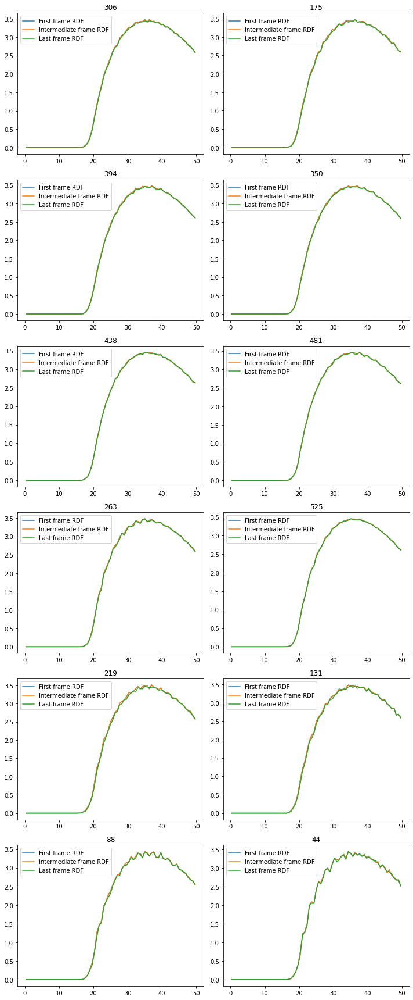

In [111]:
n = len(res_dict)
cols = 2 if n > 1 else 1
rows = round(n/cols)
if rows > 1:
    positions = [(i,j) for i in range(rows) for j in range(cols)][:n]
else:
    positions = [i for i in range(cols)][:n]
    
fig, ax = plt.subplots(rows,cols,figsize=(5*cols,4*rows))
if not isinstance(ax, Iterable):
    ax = [ax]
# for key, grp in res_df.groupby(['nmolecules']):
for pos, (nmolecules, data) in zip(positions, res_dict.items()):
    ax[pos].plot(data['dist'],data['rdf'][0], label='First frame RDF')
    ax[pos].plot(data['dist'],data['rdf'][len(data)//2],label='Intermediate frame RDF')
    ax[pos].plot(data['dist'],data['rdf'][-1],label='Last frame RDF')
    ax[pos].set_title(nmolecules)
    ax[pos].legend()

fig.tight_layout()
# fig.legend()
fig.show()

#### Substrate - surfactant tail RDF

In [112]:
parameter_dict = {
    'nmolecules': 'metadata.system.surfactant.nmolecules'}

In [113]:
query = { 
    "metadata.project": project_id,
    "metadata.type": 'substrate_surfactant_tail_rdf',
    "metadata.step": "GromacsPull:ProcessAnalyzeAndVisualize:push_filepad",
}

fp.filepad.count_documents(query)

12

In [114]:
res_dict = {}
failed_list = []

match_aggregation = {
        "$match": query
    }
sort_aggregation = {
        "$sort": { 
            "metadata.datetime": pymongo.DESCENDING,
        }
    }
group_aggregation = { 
    "$group": { 
        "_id": { field: '${}'.format(key) for field, key in parameter_dict.items() },
        "degeneracy": {"$sum": 1}, # number matching data sets
        "latest":     {"$first": "$gfs_id"} # unique gridfs id of file
    }
}
second_sort_aggregation = {
    "$sort": { 
        "_id.nmolecules": pymongo.DESCENDING,
    }
}


aggregation_pipeline = [ 
    match_aggregation, sort_aggregation, group_aggregation, second_sort_aggregation ]
cursor = fp.filepad.aggregate(aggregation_pipeline)

# res_list = []
for i, c in enumerate(cursor): 
    content, metadata = fp.get_file_by_id(c["latest"])
    nmolecules = int(c["_id"]["nmolecules"])
    data_str = io.StringIO(content.decode())
    data = np.loadtxt(data_str, comments='#')
    d = data[0] # distance bins
    rdf = data[1:]
    res_dict[nmolecules] = {'dist': d, 'rdf': rdf}
    # res_list.append(data)
    print('.',end='')
print('')

............


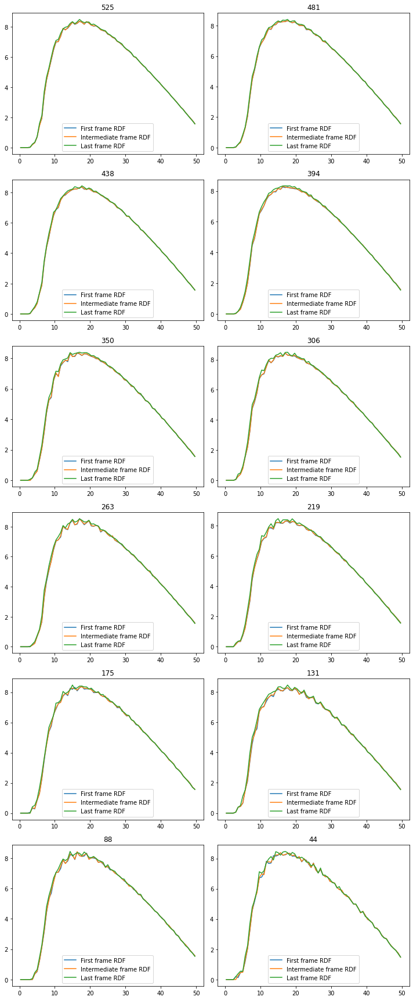

In [115]:
n = len(res_dict)
cols = 2 if n > 1 else 1
rows = round(n/cols)
if rows > 1:
    positions = [(i,j) for i in range(rows) for j in range(cols)][:n]
else:
    positions = [i for i in range(cols)][:n]
    
fig, ax = plt.subplots(rows,cols,figsize=(5*cols,4*rows))
if not isinstance(ax, Iterable):
    ax = [ax]
    
# for key, grp in res_df.groupby(['nmolecules']):
for pos, (nmolecules, data) in zip(positions, res_dict.items()):
    ax[pos].plot(data['dist'],data['rdf'][0], label='First frame RDF')
    ax[pos].plot(data['dist'],data['rdf'][len(data)//2],label='Intermediate frame RDF')
    ax[pos].plot(data['dist'],data['rdf'][-1],label='Last frame RDF')
    ax[pos].set_title(nmolecules)
    ax[pos].legend()

fig.tight_layout()
# fig.legend()
fig.show()

#### Surfactant head - surfactant tail RDF

In [116]:
parameter_dict = {
    'nmolecules': 'metadata.system.surfactant.nmolecules'}

In [117]:
query = { 
    "metadata.project": project_id,
    "metadata.type": 'surfactant_head_surfactant_tail_rdf',
    "metadata.step": "GromacsPull:ProcessAnalyzeAndVisualize:push_filepad",
}

fp.filepad.count_documents(query)

12

In [118]:
res_dict = {}
failed_list = []

match_aggregation = {
        "$match": query
    }
sort_aggregation = {
        "$sort": { 
            "metadata.datetime": pymongo.DESCENDING,
        }
    }
group_aggregation = { 
    "$group": { 
        "_id": { field: '${}'.format(key) for field, key in parameter_dict.items() },
        "degeneracy": {"$sum": 1}, # number matching data sets
        "latest":     {"$first": "$gfs_id"} # unique gridfs id of file
    }
}
second_sort_aggregation = {
    "$sort": { 
        "_id.nmolecules": pymongo.DESCENDING,
    }
}


aggregation_pipeline = [ 
    match_aggregation, sort_aggregation, group_aggregation, second_sort_aggregation ]
cursor = fp.filepad.aggregate(aggregation_pipeline)

# res_list = []
for i, c in enumerate(cursor): 
    content, metadata = fp.get_file_by_id(c["latest"])
    nmolecules = int(c["_id"]["nmolecules"])
    data_str = io.StringIO(content.decode())
    data = np.loadtxt(data_str, comments='#')
    d = data[0] # distance bins
    rdf = data[1:]
    res_dict[nmolecules] = {'dist': d, 'rdf': rdf}
    # res_list.append(data)
    print('.',end='')
print('')

............


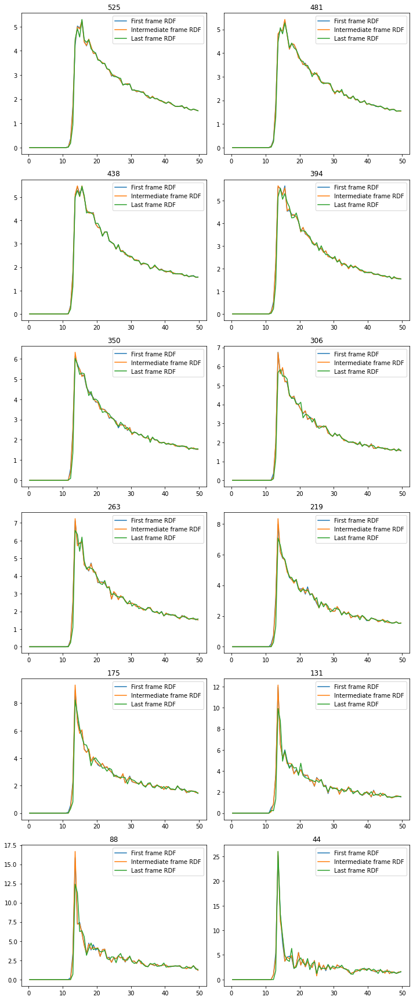

In [119]:
n = len(res_dict)
cols = 2 if n > 1 else 1
rows = round(n/cols)
if rows > 1:
    positions = [(i,j) for i in range(rows) for j in range(cols)][:n]
else:
    positions = [i for i in range(cols)][:n]
    
fig, ax = plt.subplots(rows,cols,figsize=(5*cols,4*rows))
if not isinstance(ax, Iterable):
    ax = [ax]
# for key, grp in res_df.groupby(['nmolecules']):
for pos, (nmolecules, data) in zip(positions, res_dict.items()):
    ax[pos].plot(data['dist'],data['rdf'][0], label='First frame RDF')
    ax[pos].plot(data['dist'],data['rdf'][len(data)//2],label='Intermediate frame RDF')
    ax[pos].plot(data['dist'],data['rdf'][-1],label='Last frame RDF')
    ax[pos].set_title(nmolecules)
    ax[pos].legend()

fig.tight_layout()
# fig.legend()
fig.show()

## Energy minimization after solvation analysis

### Overview on objects in step

In [120]:
# queries to the data base are simple dictionaries
query = {
    'metadata.project': project_id,
    'metadata.step': 'GromacsEnergyMinimizationAfterSolvation:ProcessAnalyzeAndVisualize:push_filepad'
}

In [121]:
# use underlying MongoDB functionality to check total number of documents matching query
fp.filepad.count_documents(query)

240

In [122]:
# check files degenerate by 'metadata.type' ad 'metadata.name'
aggregation_pipeline = [
    {
        "$match": query
    },
    {  # group by unique project id
        "$group": { 
            "_id": { 
                'type': '$metadata.type',
                'name': '$metadata.name',
            },
            "object_count": {"$sum": 1}, # count matching data sets
            "earliest":  {'$min': '$metadata.datetime' },
            "latest":  {'$max': '$metadata.datetime' },
        },
    },
    {  # sort by earliest date, descending
        "$sort": { 
            "earliest": pymongo.DESCENDING,
        }
    }
]

cursor = fp.filepad.aggregate(aggregation_pipeline)

res = [ {**c['_id'], **c} for c in cursor]
columns = ['type', 'name', 'earliest', 'latest', 'object_count', '_id']
res_df = pd.DataFrame(data=res, columns=columns) # pandas Dataframe is just nice for printing in notebook
del res_df["_id"]

In [123]:
res_df

,type,name,earliest,latest,object_count
0,mp4_file,NaN,2020-07-19 22:53:00.082476,2020-07-19 22:53:01.300371,12
1,surfactant_tail_rmsd,NaN,2020-07-19 22:53:00.082474,2020-07-19 22:53:01.300369,12
2,surfactant_head_rmsd,NaN,2020-07-19 22:53:00.082471,2020-07-19 22:53:01.300367,12
3,substrate_rmsd,NaN,2020-07-19 22:53:00.082469,2020-07-19 22:53:01.300364,12
4,counterion_rmsd,NaN,2020-07-19 22:53:00.082467,2020-07-19 22:53:01.300362,12
5,surfactant_tail_surfactant_tail_rdf,NaN,2020-07-19 22:53:00.082464,2020-07-19 22:53:01.300360,12
6,surfactant_head_surfactant_tail_rdf,NaN,2020-07-19 22:53:00.082462,2020-07-19 22:53:01.300357,12
7,surfactant_head_surfactant_head_rdf,NaN,2020-07-19 22:53:00.082460,2020-07-19 22:53:01.300355,12
8,substrate_surfactant_tail_rdf,NaN,2020-07-19 22:53:00.082458,2020-07-19 22:53:01.300353,12
9,substrate_surfactant_head_rdf,NaN,2020-07-19 22:53:00.082455,2020-07-19 22:53:01.300351,12


### Global observables

In [124]:
query = { 
    "metadata.project": project_id,
    'metadata.step': 'GromacsEnergyMinimizationAfterSolvation:ProcessAnalyzeAndVisualize:push_filepad',  #{'$regex': 'GromacsEnergyMinimization'}
    "metadata.type": 'energy_file',
}
fp.filepad.count_documents(query)

12

In [125]:
parameter_dict = {'nmolecules': 'metadata.system.surfactant.nmolecules'}

In [126]:
aggregation_pipeline = [
    {
        "$match": query
    },
    {
        "$sort": { 
            "metadata.datetime": pymongo.DESCENDING,
        }
    },
    { 
        "$group": { 
            "_id": { field: '${}'.format(key) for field, key in parameter_dict.items() },
            "degeneracy": {"$sum": 1}, # number matching data sets
            "latest":     {"$first": "$gfs_id"} # unique gridfs id of file
        }
    },
]

cursor = fp.filepad.aggregate(aggregation_pipeline)

In [127]:
res_mi_list = []

aggregation_pipeline = [
    {
        "$match": query
    },
    {
        "$sort": { 
            "metadata.datetime": pymongo.DESCENDING,
        }
    },
    { 
        "$group": { 
            "_id": { field: '${}'.format(key) for field, key in parameter_dict.items() },
            "degeneracy": {"$sum": 1}, # number matching data sets
            "latest":     {"$first": "$gfs_id"} # unique gridfs id of file
        }
    },
]

cursor = fp.filepad.aggregate(aggregation_pipeline)

for i, c in enumerate(cursor): 
    content, metadata = fp.get_file_by_id(c["latest"])
    with tempfile.NamedTemporaryFile(suffix='.edr') as tmp:
        tmp.write(content)
        em_df = panedr.edr_to_df(tmp.name)
        
        mi = pd.MultiIndex.from_product(
            [c["_id"].values(),em_df.index],
            names=[*c["_id"].keys(),'step'])
        em_mi_df = em_df.set_index(mi)        
        res_mi_list.append(em_mi_df)
    print('.',end='')
print('')

res_mi_df = pd.concat(res_mi_list)
res_df = res_mi_df.reset_index()

............


In [128]:
res_mi_df

Time        Bond           U-B   Proper Dih.  \
nmolecules step                                                     
481        0.0        0.0  141.694092  40054.796875  14063.016602   
           1.0        1.0  141.661545  40054.625000  14063.023438   
           2.0        2.0  141.649338  40054.390625  14063.034180   
           3.0        3.0  141.683838  40054.140625  14063.042969   
           4.0        4.0  141.793335  40053.808594  14063.057617   
...                   ...         ...           ...           ...   
88         9994.0  9994.0   99.860451   6682.258301   2362.781250   
           9995.0  9995.0  101.397034   6682.396973   2362.779053   
           9997.0  9997.0   96.772743   6681.637207   2362.777588   
           9998.0  9998.0  103.469955   6682.873047   2362.764404   
           9999.0  9999.0   97.318970   6681.770020   2362.762695   

                         LJ-14     Coulomb-14        LJ (SR)  Coulomb (SR)  \
nmolecules step                                                              
481        0.0     3293.846924  124254.132812  935492.687500   -3714741.75   
           1.0     3294.069824  124254.476562  933008.437500   -3714762.75   
           2.0     3294.339600  124254.914062  930034.500000   -3714788.00   
           3.0     3294.667725  124255.429688  926463.375000   -3714819.00   
           4.0     3295.075684  124256.093750  922176.000000   -3714856.50   
...                        ...            ...            ...           ...   
88         9994.0   559.270020   22817.695312  -91124.109375   -4491545.50   
           9995.0   560.352173   22818.513672  -91123.562500   -4491552.50   
           9997.0   559.687805   22818.021484  -91122.265625   -4491554.00   
           9998.0   560.463501   22818.607422  -91115.492188   -4491580.50   
           9999.0   559.520203   22817.896484  -91113.968750   -4491582.00   

                   ...    Pres-YX     Pres-YY    Pres-YZ    Pres-ZX  \
nmolecules step    ...                                                
481        0.0     ...  38.823322 -281.488861 -34.370895  62.575344   
           1.0     ...  38.673538 -281.520721 -34.422112  62.373291   
           2.0     ...  38.493793 -281.558563 -34.479385  62.131145   
           3.0     ...  38.278286 -281.602325 -34.545727  61.843330   
           4.0     ...  38.020149 -281.654419 -34.619755  61.499599   
...                ...        ...         ...        ...        ...   
88         9994.0  ... -10.067997 -402.108795   6.482723  12.649333   
           9995.0  ... -10.068232 -402.109344   6.482833  12.649398   
           9997.0  ... -10.068281 -402.109894   6.482832  12.649323   
           9998.0  ... -10.069194 -402.112305   6.482836  12.649473   
           9999.0  ... -10.069223 -402.112488   6.482925  12.649437   

                     Pres-ZY     Pres-ZZ  #Surf*SurfTen  T-rest  
nmolecules step                                                  
481        0.0    -34.370895 -278.940094           -0.0     0.0  
           1.0    -34.422123 -279.148682           -0.0     0.0  
           2.0    -34.479393 -279.397156           -0.0     0.0  
           3.0    -34.545715 -279.693451           -0.0     0.0  
           4.0    -34.619751 -280.043854           -0.0     0.0  
...                      ...         ...            ...     ...  
88         9994.0   6.482725 -396.173065            0.0     0.0  
           9995.0   6.482831 -396.173828            0.0     0.0  
           9997.0   6.482830 -396.173920            0.0     0.0  
           9998.0   6.482837 -396.177673            0.0     0.0  
           9999.0   6.482922 -396.177856            0.0     0.0  

[95071 rows x 33 columns]

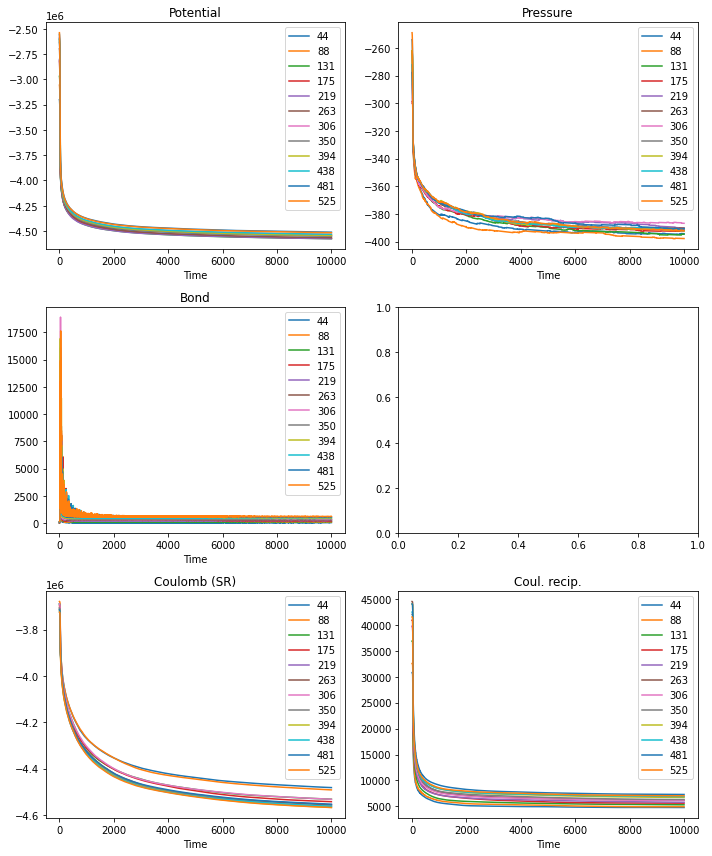

In [129]:
y_quantities = [
    'Potential',
    'Pressure',
    'Bond',
    'Coulomb (SR)',
    'Coul. recip.',
    ]

positions = [
    (0,0),
    (0,1),
    (1,0),
    (2,0),
    (2,1),
]
fig, ax = plt.subplots(3,2,figsize=(10,12))
for key, grp in res_df.groupby(['nmolecules']):
    for y_quantity, position in zip(y_quantities, positions):
        grp.plot('Time',y_quantity,ax=ax[position],label=key,title=y_quantity)
        
fig.tight_layout()

###  Visualize trajectory

In [130]:
query = {
    'metadata.project': project_id,
    'metadata.step': 'GromacsEnergyMinimizationAfterSolvation:ProcessAnalyzeAndVisualize:push_filepad',
    'metadata.type': 'mp4_file',
}

In [131]:
# use underlying MongoDB functionality to check total number of documents matching query
fp.filepad.count_documents(query)

12

In [132]:
# check

aggregation_pipeline = [
    {
        "$match": query
    },
    {  # group by unique project id
        "$group": { 
            "_id": { 
                'nmolecules': '$metadata.system.surfactant.nmolecules'
            },
            "object_count": {"$sum": 1}, # count matching data sets
            "earliest":  {'$min': '$metadata.datetime' },
            "latest":  {'$max': '$metadata.datetime' },
        },
    },
    {  # sort by earliest date, descending
        "$sort": { 
            "earliest": pymongo.DESCENDING,
        }
    }
]

cursor = fp.filepad.aggregate(aggregation_pipeline)

# for i, c in enumerate(cursor): 
#    content, metadata = fp.get_file_by_id(c["latest"])
#    nmolecules = int(c["_id"]["nmolecules"])
    

res = [ {**c['_id'], **c} for c in cursor]
columns = ['nmolecules', 'name', 'earliest', 'latest', 'object_count', '_id']
res_df = pd.DataFrame(data=res, columns=columns) # pandas Dataframe is just nice for printing in notebook
del res_df["_id"]

In [133]:
res_df

,nmolecules,name,earliest,latest,object_count
0,525,NaN,2020-07-19 22:53:01.300371,2020-07-19 22:53:01.300371,1
1,481,NaN,2020-07-19 22:53:01.193994,2020-07-19 22:53:01.193994,1
2,438,NaN,2020-07-19 22:53:01.089856,2020-07-19 22:53:01.089856,1
3,394,NaN,2020-07-19 22:53:00.973687,2020-07-19 22:53:00.973687,1
4,350,NaN,2020-07-19 22:53:00.864885,2020-07-19 22:53:00.864885,1
5,306,NaN,2020-07-19 22:53:00.754997,2020-07-19 22:53:00.754997,1
6,263,NaN,2020-07-19 22:53:00.640411,2020-07-19 22:53:00.640411,1
7,219,NaN,2020-07-19 22:53:00.530289,2020-07-19 22:53:00.530289,1
8,175,NaN,2020-07-19 22:53:00.415275,2020-07-19 22:53:00.415275,1
9,131,NaN,2020-07-19 22:53:00.303640,2020-07-19 22:53:00.303640,1


In [134]:
aggregation_pipeline = [
    {
        "$match": query
    },
    {
        "$sort": { 
            "metadata.datetime": pymongo.DESCENDING,
        }
    },
    { 
        "$group": { 
            "_id": { field: '${}'.format(key) for field, key in parameter_dict.items() },
            "degeneracy": {"$sum": 1}, # number matching data sets
            "latest":     {"$first": "$gfs_id"} # unique gridfs id of file
        }
    },
]

cursor = fp.filepad.aggregate(aggregation_pipeline)

obj_dict = {}
for i, c in enumerate(cursor): 
    content, metadata = fp.get_file_by_id(c["latest"])
    # print(metadata['metadata'])
    with tempfile.NamedTemporaryFile(suffix='.mp4',delete=False) as tmp:
        tmp.write(content)
        # obj_list.append(Video(filename=tmp.name)) 
        # obj_list.append(tmp.name)
        obj_dict.update({metadata['metadata']['system']['surfactant']['nmolecules']: Video.from_file(tmp.name)})
    print('.',end='')

............

In [135]:
for key, obj in obj_dict.items():
    print(key)
    display(obj)

525


Video(value=b'\x00\x00\x00 ftypisom\x00\x00\x02\x00isomiso2avc1mp41\x00\x00\x00\x08free\x00\x05m\xabmdat\x00\x…

394


Video(value=b'\x00\x00\x00 ftypisom\x00\x00\x02\x00isomiso2avc1mp41\x00\x00\x00\x08free\x00\x05\xd0[mdat\x00\x…

438


Video(value=b'\x00\x00\x00 ftypisom\x00\x00\x02\x00isomiso2avc1mp41\x00\x00\x00\x08free\x00\x05\x8f\xbfmdat\x0…

350


Video(value=b'\x00\x00\x00 ftypisom\x00\x00\x02\x00isomiso2avc1mp41\x00\x00\x00\x08free\x00\x05\xe7\xa0mdat\x0…

263


Video(value=b'\x00\x00\x00 ftypisom\x00\x00\x02\x00isomiso2avc1mp41\x00\x00\x00\x08free\x00\x06\'Omdat\x00\x00…

175


Video(value=b'\x00\x00\x00 ftypisom\x00\x00\x02\x00isomiso2avc1mp41\x00\x00\x00\x08free\x00\x06\x8b\xe4mdat\x0…

131


Video(value=b'\x00\x00\x00 ftypisom\x00\x00\x02\x00isomiso2avc1mp41\x00\x00\x00\x08free\x00\x05\xd8Dmdat\x00\x…

44


Video(value=b'\x00\x00\x00 ftypisom\x00\x00\x02\x00isomiso2avc1mp41\x00\x00\x00\x08free\x00\x03\xcb\xf5mdat\x0…

306


Video(value=b'\x00\x00\x00 ftypisom\x00\x00\x02\x00isomiso2avc1mp41\x00\x00\x00\x08free\x00\x06\x07\xdemdat\x0…

88


Video(value=b'\x00\x00\x00 ftypisom\x00\x00\x02\x00isomiso2avc1mp41\x00\x00\x00\x08free\x00\x05\xbdemdat\x00\x…

481


Video(value=b'\x00\x00\x00 ftypisom\x00\x00\x02\x00isomiso2avc1mp41\x00\x00\x00\x08free\x00\x05q\xdemdat\x00\x…

219


Video(value=b'\x00\x00\x00 ftypisom\x00\x00\x02\x00isomiso2avc1mp41\x00\x00\x00\x08free\x00\x06\n\xcdmdat\x00\…

## NVT equilibration analysis

### Overview on objects in step

In [136]:
# queries to the data base are simple dictionaries
query = {
    'metadata.project': project_id,
    'metadata.step': 'GromacsNVTEquilibration:ProcessAnalyzeAndVisualize:push_filepad'
}

In [137]:
# use underlying MongoDB functionality to check total number of documents matching query
fp.filepad.count_documents(query)

252

In [138]:
# check files degenerate by 'metadata.type' ad 'metadata.name'
aggregation_pipeline = [
    {
        "$match": query
    },
    {  # group by unique project id
        "$group": { 
            "_id": { 
                'type': '$metadata.type',
                'name': '$metadata.name',
            },
            "object_count": {"$sum": 1}, # count matching data sets
            "earliest":  {'$min': '$metadata.datetime' },
            "latest":  {'$max': '$metadata.datetime' },
        },
    },
    {  # sort by earliest date, descending
        "$sort": { 
            "earliest": pymongo.DESCENDING,
        }
    }
]

cursor = fp.filepad.aggregate(aggregation_pipeline)

res = [ {**c['_id'], **c} for c in cursor]
columns = ['type', 'name', 'earliest', 'latest', 'object_count', '_id']
res_df = pd.DataFrame(data=res, columns=columns) # pandas Dataframe is just nice for printing in notebook
del res_df["_id"]

In [139]:
res_df

,type,name,earliest,latest,object_count
0,mp4_file,NaN,2020-07-19 22:53:00.094277,2020-07-19 22:53:01.311597,12
1,surfactant_tail_rmsd,NaN,2020-07-19 22:53:00.094274,2020-07-19 22:53:01.311594,12
2,surfactant_head_rmsd,NaN,2020-07-19 22:53:00.094272,2020-07-19 22:53:01.311588,12
3,substrate_rmsd,NaN,2020-07-19 22:53:00.094270,2020-07-19 22:53:01.311585,12
4,counterion_rmsd,NaN,2020-07-19 22:53:00.094267,2020-07-19 22:53:01.311583,12
5,surfactant_tail_surfactant_tail_rdf,NaN,2020-07-19 22:53:00.094265,2020-07-19 22:53:01.311580,12
6,surfactant_head_surfactant_tail_rdf,NaN,2020-07-19 22:53:00.094262,2020-07-19 22:53:01.311578,12
7,surfactant_head_surfactant_head_rdf,NaN,2020-07-19 22:53:00.094260,2020-07-19 22:53:01.311575,12
8,substrate_surfactant_tail_rdf,NaN,2020-07-19 22:53:00.094258,2020-07-19 22:53:01.311573,12
9,substrate_surfactant_head_rdf,NaN,2020-07-19 22:53:00.094255,2020-07-19 22:53:01.311571,12


### Global observables

In [140]:
query = { 
    "metadata.project": project_id,
    'metadata.step': 'GromacsNVTEquilibration:ProcessAnalyzeAndVisualize:push_filepad',
    "metadata.type":    'energy_file',
}
fp.filepad.count_documents(query)

12

In [141]:
parameter_dict = {'nmolecules': 'metadata.system.surfactant.nmolecules'}

In [142]:
aggregation_pipeline = [
    {
        "$match": query
    },
    {
        "$sort": { 
            "metadata.datetime": pymongo.DESCENDING,
        }
    },
    { 
        "$group": { 
            "_id": { field: '${}'.format(key) for field, key in parameter_dict.items() },
            "degeneracy": {"$sum": 1}, # number matching data sets
            "latest":     {"$first": "$gfs_id"} # unique gridfs id of file
        }
    },
]

cursor = fp.filepad.aggregate(aggregation_pipeline)

In [143]:
[ c for c in cursor]

[{'_id': {'nmolecules': 481},
  'degeneracy': 1,
  'latest': '5f14c8957dc9cfbf449d3b16'},
 {'_id': {'nmolecules': 438},
  'degeneracy': 1,
  'latest': '5f14c9497dc9cfbf449d47c2'},
 {'_id': {'nmolecules': 394},
  'degeneracy': 1,
  'latest': '5f14cf9c7dc9cfbf449d7ac3'},
 {'_id': {'nmolecules': 350},
  'degeneracy': 1,
  'latest': '5f14dcd67dc9cfbf449de717'},
 {'_id': {'nmolecules': 263},
  'degeneracy': 1,
  'latest': '5f14eb837dc9cfbf449e4201'},
 {'_id': {'nmolecules': 219},
  'degeneracy': 1,
  'latest': '5f14f7ab7dc9cfbf449e9617'},
 {'_id': {'nmolecules': 175},
  'degeneracy': 1,
  'latest': '5f14fdb97dc9cfbf449ed4ea'},
 {'_id': {'nmolecules': 131},
  'degeneracy': 1,
  'latest': '5f14feb17dc9cfbf449ee20f'},
 {'_id': {'nmolecules': 306},
  'degeneracy': 1,
  'latest': '5f14e3b77dc9cfbf449e081b'},
 {'_id': {'nmolecules': 44},
  'degeneracy': 1,
  'latest': '5f1510107dc9cfbf449f6c6f'},
 {'_id': {'nmolecules': 525},
  'degeneracy': 1,
  'latest': '5f14c75c7dc9cfbf449d277d'},
 {'_id': {'

In [144]:
res_list = []

aggregation_pipeline = [
    {
        "$match": query
    },
    {
        "$sort": { 
            "metadata.datetime": pymongo.DESCENDING,
        }
    },
    { 
        "$group": { 
            "_id": { field: '${}'.format(key) for field, key in parameter_dict.items() },
            "degeneracy": {"$sum": 1}, # number matching data sets
            "latest":     {"$first": "$gfs_id"} # unique gridfs id of file
        }
    },
]

cursor = fp.filepad.aggregate(aggregation_pipeline)

for i, c in enumerate(cursor): 
    content, metadata = fp.get_file_by_id(c["latest"])
    with tempfile.NamedTemporaryFile(suffix='.edr') as tmp:
        tmp.write(content)
        res_df = panedr.edr_to_df(tmp.name)
        
        mi = pd.MultiIndex.from_product(
            [c["_id"].values(),res_df.index],
            names=[*c["_id"].keys(),'step'])
        res_mi_df = res_df.set_index(mi)
        res_list.append(res_mi_df)
    print('.',end='')
print('')
res_df_mi = pd.concat(res_list)
res_df = res_df_mi.reset_index()

............


In [145]:
res_df.columns

Index(['nmolecules', 'step', 'Time', 'Bond', 'U-B', 'Proper Dih.', 'LJ-14',
       'Coulomb-14', 'LJ (SR)', 'Coulomb (SR)', 'Coul. recip.',
       'Position Rest.', 'Potential', 'Kinetic En.', 'Total Energy',
       'Conserved En.', 'Temperature', 'Pressure', 'Constr. rmsd', 'Vir-XX',
       'Vir-XY', 'Vir-XZ', 'Vir-YX', 'Vir-YY', 'Vir-YZ', 'Vir-ZX', 'Vir-ZY',
       'Vir-ZZ', 'Pres-XX', 'Pres-XY', 'Pres-XZ', 'Pres-YX', 'Pres-YY',
       'Pres-YZ', 'Pres-ZX', 'Pres-ZY', 'Pres-ZZ', '#Surf*SurfTen',
       'Coul-SR:Surfactant-Surfactant', 'LJ-SR:Surfactant-Surfactant',
       'Coul-14:Surfactant-Surfactant', 'LJ-14:Surfactant-Surfactant',
       'Coul-SR:Surfactant-Substrate', 'LJ-SR:Surfactant-Substrate',
       'Coul-14:Surfactant-Substrate', 'LJ-14:Surfactant-Substrate',
       'Coul-SR:Surfactant-Ion', 'LJ-SR:Surfactant-Ion',
       'Coul-14:Surfactant-Ion', 'LJ-14:Surfactant-Ion',
       'Coul-SR:Surfactant-rest', 'LJ-SR:Surfactant-rest',
       'Coul-14:Surfactant-rest', 'LJ-14:Sur

In [146]:
res_df_mi

Time         Bond           U-B   Proper Dih.        LJ-14  \
nmolecules step                                                                 
481        0.0      0.0   733.488892  36992.550781  13402.288086  3134.245850   
           1.0      1.0  6369.137695  64824.730469  16620.417969  4206.083008   
           2.0      2.0  7395.747070  69906.039062  17395.628906  4475.372559   
           3.0      3.0  7853.290527  73333.234375  17740.519531  4637.836426   
           4.0      4.0  8203.024414  75309.648438  17998.080078  4786.134766   
...                 ...          ...           ...           ...          ...   
88         96.0    96.0  1538.663696  13889.666016   3269.358887   872.792786   
           97.0    97.0  1510.632324  13696.390625   3206.569580   860.664246   
           98.0    98.0  1533.184814  13870.621094   3201.865967   866.572021   
           99.0    99.0  1587.037842  13696.195312   3265.381104   871.215820   
           100.0  100.0  1644.579956  13734.527344   3153.703125   845.706726   

                     Coulomb-14        LJ (SR)  Coulomb (SR)  ...  \
nmolecules step                                               ...   
481        0.0    124551.203125 -148020.031250   -4553320.50  ...   
           1.0    124065.750000 -205432.328125   -4107370.50  ...   
           2.0    123771.125000 -224666.703125   -4011863.50  ...   
           3.0    123693.906250 -247252.812500   -3930259.75  ...   
           4.0    123690.250000 -257208.343750   -3876227.50  ...   
...                         ...            ...           ...  ...   
88         96.0    22596.740234 -260288.562500   -3574433.75  ...   
           97.0    22673.849609 -261339.484375   -3576860.75  ...   
           98.0    22687.105469 -261641.171875   -3574124.50  ...   
           99.0    22692.685547 -261064.265625   -3576364.50  ...   
           100.0   22697.308594 -261413.187500   -3575528.25  ...   

                  Coul-SR:rest-rest  LJ-SR:rest-rest  Coul-14:rest-rest  \
nmolecules step                                                           
481        0.0          -4130818.75     480839.90625                0.0   
           1.0          -3678724.50     420730.21875                0.0   
           2.0          -3578490.75     400638.96875                0.0   
           3.0          -3496063.25     378916.96875                0.0   
           4.0          -3439610.00     368469.34375                0.0   
...                             ...              ...                ...   
88         96.0         -3483944.00     348176.00000                0.0   
           97.0         -3486768.75     347314.34375                0.0   
           98.0         -3483832.00     347003.90625                0.0   
           99.0         -3485767.25     347491.00000                0.0   
           100.0        -3485915.25     347481.93750                0.0   

                  LJ-14:rest-rest  T-non-Substrate  T-Substrate  \
nmolecules step                                                   
481        0.0                0.0       298.916260          0.0   
           1.0                0.0       206.726028          0.0   
           2.0                0.0       238.717941          0.0   
           3.0                0.0       256.919708          0.0   
           4.0                0.0       269.385254          0.0   
...                           ...              ...          ...   
88         96.0               0.0       296.900513          0.0   
           97.0               0.0       298.103668          0.0   
           98.0               0.0       297.654694          0.0   
           99.0               0.0       298.297089          0.0   
           100.0              0.0       299.450104          0.0   

                  Lamb-non-Substrate  Lamb-Substrate  
nmolecules step                                       
481        0.0                   1.0             1.0  
           1.0                   1.0             1.0  

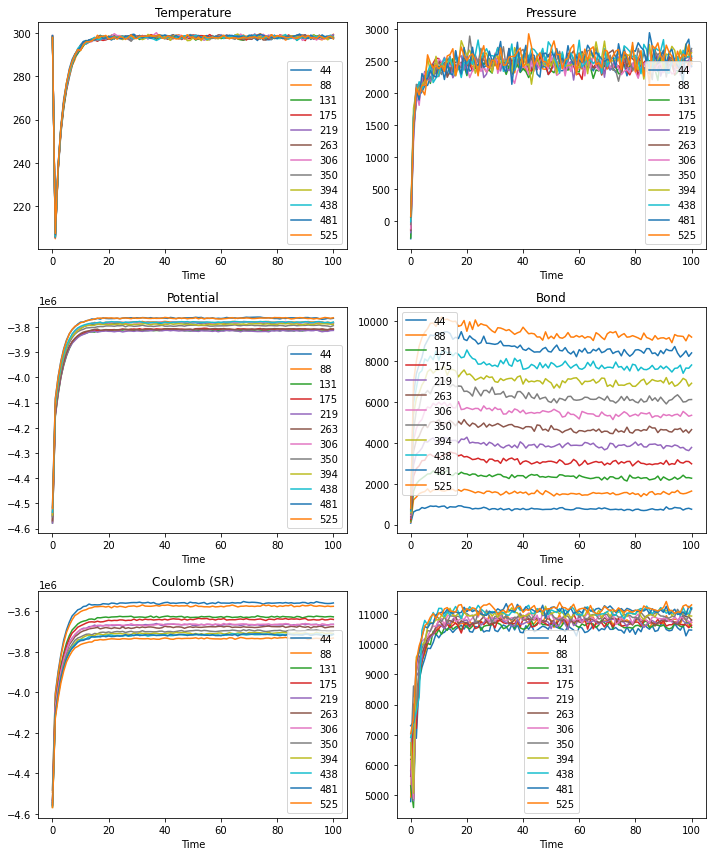

In [147]:
#n = len(res_df['nmolecules'].unique())
y_quantities = [
    'Temperature',
    'Pressure',
    'Potential',
    'Bond',
    'Coulomb (SR)',
    'Coul. recip.',
    ]

n = len(y_quantities)
cols = 2
rows = round(n/cols)
if rows > 1:
    positions = [(i,j) for i in range(rows) for j in range(cols)][:n]
else:
    positions = [i for i in range(cols)][:n]
    
fig, ax = plt.subplots(rows,cols,figsize=(5*cols,4*rows))
for key, grp in res_df.groupby(['nmolecules']):
    for y_quantity, position in zip(y_quantities, positions):
        grp.plot('Time',y_quantity,ax=ax[position],label=key,title=y_quantity)
        
fig.tight_layout()

### Visualize trajectory

In [148]:
query = {
    'metadata.project': project_id,
    'metadata.step': 'GromacsNVTEquilibration:ProcessAnalyzeAndVisualize:push_filepad',
    'metadata.type': 'mp4_file',
}

In [149]:
# use underlying MongoDB functionality to check total number of documents matching query
fp.filepad.count_documents(query)

12

In [150]:
parameter_dict = {'nmolecules': 'metadata.system.surfactant.nmolecules'}

aggregation_pipeline = [
    {
        "$match": query
    },
    {
        "$sort": { 
            "metadata.datetime": pymongo.DESCENDING,
        }
    },
    { 
        "$group": { 
            "_id": { field: '${}'.format(key) for field, key in parameter_dict.items() },
            "degeneracy": {"$sum": 1}, # number matching data sets
            "latest":     {"$first": "$gfs_id"} # unique gridfs id of file
        }
    },
]

cursor = fp.filepad.aggregate(aggregation_pipeline)

obj_dict = {}
for i, c in enumerate(cursor): 
    content, metadata = fp.get_file_by_id(c["latest"])
    # print(metadata['metadata'])
    with tempfile.NamedTemporaryFile(suffix='.mp4',delete=False) as tmp:
        tmp.write(content)
        # obj_list.append(Video(filename=tmp.name)) 
        # obj_list.append(tmp.name)
        key = tuple(c["_id"].values())
        obj_dict.update({key: Video.from_file(tmp.name)})
    print('.',end='')

............

In [151]:
for key, obj in obj_dict.items():
    print(key)
    display(obj)

(525,)


Video(value=b'\x00\x00\x00 ftypisom\x00\x00\x02\x00isomiso2avc1mp41\x00\x00\x00\x08free\x00 \xca\x18mdat\x00\x…

(394,)


Video(value=b'\x00\x00\x00 ftypisom\x00\x00\x02\x00isomiso2avc1mp41\x00\x00\x00\x08free\x00 \x84Pmdat\x00\x00\…

(438,)


Video(value=b'\x00\x00\x00 ftypisom\x00\x00\x02\x00isomiso2avc1mp41\x00\x00\x00\x08free\x00 \xd1\x19mdat\x00\x…

(350,)


Video(value=b'\x00\x00\x00 ftypisom\x00\x00\x02\x00isomiso2avc1mp41\x00\x00\x00\x08free\x00 \x89*mdat\x00\x00\…

(263,)


Video(value=b'\x00\x00\x00 ftypisom\x00\x00\x02\x00isomiso2avc1mp41\x00\x00\x00\x08free\x00\x1d\xc4Umdat\x00\x…

(175,)


Video(value=b'\x00\x00\x00 ftypisom\x00\x00\x02\x00isomiso2avc1mp41\x00\x00\x00\x08free\x00\x1c8Mmdat\x00\x00\…

(131,)


Video(value=b'\x00\x00\x00 ftypisom\x00\x00\x02\x00isomiso2avc1mp41\x00\x00\x00\x08free\x00\x19h\x87mdat\x00\x…

(44,)


Video(value=b'\x00\x00\x00 ftypisom\x00\x00\x02\x00isomiso2avc1mp41\x00\x00\x00\x08free\x00\x0ea\x03mdat\x00\x…

(306,)


Video(value=b'\x00\x00\x00 ftypisom\x00\x00\x02\x00isomiso2avc1mp41\x00\x00\x00\x08free\x00\x1f\xe6\xb4mdat\x0…

(88,)


Video(value=b'\x00\x00\x00 ftypisom\x00\x00\x02\x00isomiso2avc1mp41\x00\x00\x00\x08free\x00\x14\xcf\nmdat\x00\…

(481,)


Video(value=b'\x00\x00\x00 ftypisom\x00\x00\x02\x00isomiso2avc1mp41\x00\x00\x00\x08free\x00 )\x88mdat\x00\x00\…

(219,)


Video(value=b'\x00\x00\x00 ftypisom\x00\x00\x02\x00isomiso2avc1mp41\x00\x00\x00\x08free\x00\x1e\x1a\xd4mdat\x0…

## NPT equilibration analysis

### Datasets in step

In [152]:
# queries to the data base are simple dictionaries
query = {
    'metadata.project': project_id,
    'metadata.step': 'GromacsNPTEquilibration:ProcessAnalyzeAndVisualize:push_filepad'
}

In [153]:
# check files degenerate by 'metadata.type' ad 'metadata.name'
aggregation_pipeline = [
    {
        "$match": query
    },
    {  # group by unique project id
        "$group": { 
            "_id": { 
                'dataset': '$metadata.step_specific.dtool_push.remote_dataset',
            },
            "object_count": {"$sum": 1}, # count matching data sets
            "earliest":  {'$min': '$metadata.datetime' },
            "latest":  {'$max': '$metadata.datetime' },
        },
    },
    {  # sort by earliest date, descending
        "$sort": { 
            "earliest": pymongo.DESCENDING,
        }
    }
]

cursor = fp.filepad.aggregate(aggregation_pipeline)

res = [ {**c['_id']['dataset'], **c} for c in cursor]
columns = ['uuid', 'name', 'uri', 'earliest', 'latest', 'object_count', '_id']
res_df = pd.DataFrame(data=res, columns=columns) # pandas Dataframe is just nice for printing in notebook
del res_df["_id"]

In [154]:
res_df

,uuid,name,uri,earliest,latest,object_count
0,fab5395e-d1a2-46c8-96da-035cb7a5a8bf,2020-07-19-22-53-01-317367-n-525-m-525-gromacsnptequilibration,file://juwels01.ib.juwels.fzj.de/p/project/chfr13/hoermann4/dtool/DATASETS/2020-07-19-22-53-01-317367-n-525-m-525-gromacsnptequilibration,2020-07-19 22:53:01.322963,2020-07-19 22:53:01.323013,21
1,e3b6a546-e189-4db9-a07b-3740d640670c,2020-07-19-22-53-01-211770-n-481-m-481-gromacsnptequilibration,file://juwels01.ib.juwels.fzj.de/p/project/chfr13/hoermann4/dtool/DATASETS/2020-07-19-22-53-01-211770-n-481-m-481-gromacsnptequilibration,2020-07-19 22:53:01.216982,2020-07-19 22:53:01.217035,21
2,0bc96782-99e4-4a02-b247-d40002781c0a,2020-07-19-22-53-01-108983-n-438-m-438-gromacsnptequilibration,file://juwels01.ib.juwels.fzj.de/p/project/chfr13/hoermann4/dtool/DATASETS/2020-07-19-22-53-01-108983-n-438-m-438-gromacsnptequilibration,2020-07-19 22:53:01.114240,2020-07-19 22:53:01.114294,21
3,db86544d-4056-4f0f-91d0-c93447ff6805,2020-07-19-22-53-00-992464-n-394-m-394-gromacsnptequilibration,file://juwels01.ib.juwels.fzj.de/p/project/chfr13/hoermann4/dtool/DATASETS/2020-07-19-22-53-00-992464-n-394-m-394-gromacsnptequilibration,2020-07-19 22:53:00.998190,2020-07-19 22:53:00.998308,21
4,89555ade-154b-48ac-a338-2151715af8df,2020-07-19-22-53-00-883201-n-350-m-350-gromacsnptequilibration,file://juwels01.ib.juwels.fzj.de/p/project/chfr13/hoermann4/dtool/DATASETS/2020-07-19-22-53-00-883201-n-350-m-350-gromacsnptequilibration,2020-07-19 22:53:00.888952,2020-07-19 22:53:00.889014,21
5,b8b840d0-6f04-414d-8383-4123b273cc8d,2020-07-19-22-53-00-772561-n-306-m-306-gromacsnptequilibration,file://juwels01.ib.juwels.fzj.de/p/project/chfr13/hoermann4/dtool/DATASETS/2020-07-19-22-53-00-772561-n-306-m-306-gromacsnptequilibration,2020-07-19 22:53:00.778654,2020-07-19 22:53:00.778710,21
6,16e29772-082e-4661-978f-643566753a36,2020-07-19-22-53-00-658358-n-263-m-263-gromacsnptequilibration,file://juwels01.ib.juwels.fzj.de/p/project/chfr13/hoermann4/dtool/DATASETS/2020-07-19-22-53-00-658358-n-263-m-263-gromacsnptequilibration,2020-07-19 22:53:00.665453,2020-07-19 22:53:00.665552,21
7,cc81eb50-8ab8-46c2-ac34-46afe79b7417,2020-07-19-22-53-00-549951-n-219-m-219-gromacsnptequilibration,file://juwels01.ib.juwels.fzj.de/p/project/chfr13/hoermann4/dtool/DATASETS/2020-07-19-22-53-00-549951-n-219-m-219-gromacsnptequilibration,2020-07-19 22:53:00.555606,2020-07-19 22:53:00.555659,21
8,c4df4417-9051-493f-9187-55a6812ec6da,2020-07-19-22-53-00-433112-n-175-m-175-gromacsnptequilibration,file://juwels01.ib.juwels.fzj.de/p/project/chfr13/hoermann4/dtool/DATASETS/2020-07-19-22-53-00-433112-n-175-m-175-gromacsnptequilibration,2020-07-19 22:53:00.438717,2020-07-19 22:53:00.438769,21
9,8ec3c13e-14e0-481f-a453-401b3e284b0f,2020-07-19-22-53-00-320961-n-131-m-131-gromacsnptequilibration,file://juwels01.ib.juwels.fzj.de/p/project/chfr13/hoermann4/dtool/DATASETS/2020-07-19-22-53-00-320961-n-131-m-131-gromacsnptequilibration,2020-07-19 22:53:00.326980,2020-07-19 22:53:00.327036,57


### Overview on objects in step

In [155]:
# queries to the data base are simple dictionaries
query = {
    'metadata.project': project_id,
    'metadata.step': 'GromacsNPTEquilibration:ProcessAnalyzeAndVisualize:push_filepad'
}

In [156]:
# use underlying MongoDB functionality to check total number of documents matching query
fp.filepad.count_documents(query)

288

In [157]:
# check files degenerate by 'metadata.type' ad 'metadata.name'
aggregation_pipeline = [
    {
        "$match": query
    },
    {  # group by unique project id
        "$group": { 
            "_id": { 
                'type': '$metadata.type',
                'name': '$metadata.name',
            },
            "object_count": {"$sum": 1}, # count matching data sets
            "earliest":  {'$min': '$metadata.datetime' },
            "latest":  {'$max': '$metadata.datetime' },
        },
    },
    {  # sort by earliest date, descending
        "$sort": { 
            "earliest": pymongo.DESCENDING,
        }
    }
]

cursor = fp.filepad.aggregate(aggregation_pipeline)

res = [ {**c['_id'], **c} for c in cursor]
columns = ['type', 'name', 'earliest', 'latest', 'object_count', '_id']
res_df = pd.DataFrame(data=res, columns=columns) # pandas Dataframe is just nice for printing in notebook
del res_df["_id"]

In [158]:
res_df

,type,name,earliest,latest,object_count
0,mp4_file,NaN,2020-07-19 22:53:00.105677,2020-07-19 22:53:01.323013,13
1,surfactant_tail_rmsd,NaN,2020-07-19 22:53:00.105675,2020-07-19 22:53:01.323011,13
2,surfactant_head_rmsd,NaN,2020-07-19 22:53:00.105671,2020-07-19 22:53:01.323009,13
3,substrate_rmsd,NaN,2020-07-19 22:53:00.105667,2020-07-19 22:53:01.323006,13
4,counterion_rmsd,NaN,2020-07-19 22:53:00.105660,2020-07-19 22:53:01.323004,13
5,surfactant_tail_surfactant_tail_rdf,NaN,2020-07-19 22:53:00.105657,2020-07-19 22:53:01.323001,13
6,surfactant_head_surfactant_tail_rdf,NaN,2020-07-19 22:53:00.105655,2020-07-19 22:53:01.322999,14
7,surfactant_head_surfactant_head_rdf,NaN,2020-07-19 22:53:00.105653,2020-07-19 22:53:01.322997,14
8,substrate_surfactant_tail_rdf,NaN,2020-07-19 22:53:00.105650,2020-07-19 22:53:01.322995,14
9,substrate_surfactant_head_rdf,NaN,2020-07-19 22:53:00.105648,2020-07-19 22:53:01.322992,14


### Global observables

In [159]:
query = { 
    "metadata.project": project_id,
    'metadata.step': 'GromacsNPTEquilibration:ProcessAnalyzeAndVisualize:push_filepad',
    "metadata.type":    'energy_file',
}
fp.filepad.count_documents(query)

14

In [160]:
parameter_dict = {'nmolecules': 'metadata.system.surfactant.nmolecules'}

In [161]:
aggregation_pipeline = [
    {
        "$match": query
    },
    {
        "$sort": { 
            "metadata.datetime": pymongo.DESCENDING,
        }
    },
    { 
        "$group": { 
            "_id": { field: '${}'.format(key) for field, key in parameter_dict.items() },
            "degeneracy": {"$sum": 1}, # number matching data sets
            "latest":     {"$first": "$gfs_id"} # unique gridfs id of file
        }
    },
]

cursor = fp.filepad.aggregate(aggregation_pipeline)

In [162]:
[ c for c in cursor]

[{'_id': {'nmolecules': 175},
  'degeneracy': 1,
  'latest': '5f1503d87dc9cfbf449ef012'},
 {'_id': {'nmolecules': 394},
  'degeneracy': 1,
  'latest': '5f14db6e7dc9cfbf449dda53'},
 {'_id': {'nmolecules': 350},
  'degeneracy': 1,
  'latest': '5f14e3157dc9cfbf449dfb5a'},
 {'_id': {'nmolecules': 438},
  'degeneracy': 1,
  'latest': '5f14cf097dc9cfbf449d6dfd'},
 {'_id': {'nmolecules': 263},
  'degeneracy': 1,
  'latest': '5f14f0e07dc9cfbf449e6877'},
 {'_id': {'nmolecules': 131},
  'degeneracy': 3,
  'latest': '5f15046d7dc9cfbf449efcbc'},
 {'_id': {'nmolecules': 88},
  'degeneracy': 1,
  'latest': '5f1511727dc9cfbf449f78cd'},
 {'_id': {'nmolecules': 44},
  'degeneracy': 1,
  'latest': '5f1515997dc9cfbf449f8548'},
 {'_id': {'nmolecules': 306},
  'degeneracy': 1,
  'latest': '5f14e9d87dc9cfbf449e34cf'},
 {'_id': {'nmolecules': 481},
  'degeneracy': 1,
  'latest': '5f14ce767dc9cfbf449d613e'},
 {'_id': {'nmolecules': 219},
  'degeneracy': 1,
  'latest': '5f14fd247dc9cfbf449ec831'},
 {'_id': {'n

In [163]:
res_list = []

cursor = fp.filepad.aggregate(aggregation_pipeline)

for i, c in enumerate(cursor): 
    content, metadata = fp.get_file_by_id(c["latest"])
    with tempfile.NamedTemporaryFile(suffix='.edr') as tmp:
        tmp.write(content)
        res_df = panedr.edr_to_df(tmp.name)
        
        mi = pd.MultiIndex.from_product(
            [c["_id"].values(),res_df.index],
            names=[*c["_id"].keys(),'step'])
        res_mi_df = res_df.set_index(mi)
        res_list.append(res_mi_df)
    print('.',end='')
print('')
res_df_mi = pd.concat(res_list)
res_df = res_df_mi.reset_index()

............


In [164]:
res_df.columns

Index(['nmolecules', 'step', 'Time', 'Bond', 'U-B', 'Proper Dih.', 'LJ-14',
       'Coulomb-14', 'LJ (SR)', 'Coulomb (SR)', 'Coul. recip.',
       'Position Rest.', 'Potential', 'Kinetic En.', 'Total Energy',
       'Conserved En.', 'Temperature', 'Pressure', 'Constr. rmsd', 'Box-X',
       'Box-Y', 'Box-Z', 'Volume', 'Density', 'pV', 'Enthalpy', 'Vir-XX',
       'Vir-XY', 'Vir-XZ', 'Vir-YX', 'Vir-YY', 'Vir-YZ', 'Vir-ZX', 'Vir-ZY',
       'Vir-ZZ', 'Pres-XX', 'Pres-XY', 'Pres-XZ', 'Pres-YX', 'Pres-YY',
       'Pres-YZ', 'Pres-ZX', 'Pres-ZY', 'Pres-ZZ', '#Surf*SurfTen',
       'Coul-SR:Surfactant-Surfactant', 'LJ-SR:Surfactant-Surfactant',
       'Coul-14:Surfactant-Surfactant', 'LJ-14:Surfactant-Surfactant',
       'Coul-SR:Surfactant-Substrate', 'LJ-SR:Surfactant-Substrate',
       'Coul-14:Surfactant-Substrate', 'LJ-14:Surfactant-Substrate',
       'Coul-SR:Surfactant-Ion', 'LJ-SR:Surfactant-Ion',
       'Coul-14:Surfactant-Ion', 'LJ-14:Surfactant-Ion',
       'Coul-SR:Surfactant-res

In [165]:
res_df_mi

Time         Bond           U-B  Proper Dih.        LJ-14  \
nmolecules step                                                                
88         0.0      0.0  1659.547363  13766.999023  3154.668701   847.508911   
           1.0      1.0  1572.175049  13818.107422  3189.248047   898.012146   
           2.0      2.0  1571.472168  13731.670898  3223.597656   834.129395   
           3.0      3.0  1528.322388  13704.244141  3289.937256   821.232178   
           4.0      4.0  1492.993530  13962.540039  3207.214111   857.790710   
...                 ...          ...           ...          ...          ...   
131        96.0    96.0  2148.888672  19903.812500  4750.384277  1186.712402   
           97.0    97.0  2208.041504  20024.515625  4735.063477  1237.817749   
           98.0    98.0  2216.830566  19570.035156  4817.375000  1288.840820   
           99.0    99.0  2100.892090  19829.517578  4768.525391  1267.084839   
           100.0  100.0  2155.678467  19610.035156  4705.484863  1252.351196   

                    Coulomb-14       LJ (SR)  Coulomb (SR)  ...  \
nmolecules step                                             ...   
88         0.0    22697.826172 -261171.90625   -3575470.75  ...   
           1.0    22620.173828 -289901.28125   -3584997.75  ...   
           2.0    22589.814453 -299930.93750   -3582234.75  ...   
           3.0    22569.693359 -299907.75000   -3591731.00  ...   
           4.0    22536.570312 -305155.71875   -3589980.25  ...   
...                        ...           ...           ...  ...   
131        96.0   33476.066406 -309121.59375   -3652308.50  ...   
           97.0   33407.867188 -304207.53125   -3658998.00  ...   
           98.0   33677.285156 -305323.28125   -3656527.25  ...   
           99.0   33546.695312 -304255.34375   -3657684.75  ...   
           100.0  33563.519531 -306451.09375   -3655839.50  ...   

                  Coul-SR:rest-rest  LJ-SR:rest-rest  Coul-14:rest-rest  \
nmolecules step                                                           
88         0.0          -3485865.50     347726.15625                0.0   
           1.0          -3493904.50     353124.56250                0.0   
           2.0          -3491849.75     350642.40625                0.0   
           3.0          -3500881.75     353351.28125                0.0   
           4.0          -3499615.50     349995.18750                0.0   
...                             ...              ...                ...   
131        96.0         -3518272.50     354399.09375                0.0   
           97.0         -3524644.00     358882.93750                0.0   
           98.0         -3522077.00     357743.59375                0.0   
           99.0         -3523649.00     359175.28125                0.0   
           100.0        -3521580.75     356740.15625                0.0   

                  LJ-14:rest-rest  T-non-Substrate  T-Substrate  \
nmolecules step                                                   
88         0.0                0.0       300.657349     1.699567   
           1.0                0.0       299.429932   260.991699   
           2.0                0.0       297.920380   186.032990   
           3.0                0.0       299.207397   121.649498   
           4.0                0.0       298.351257    94.199387   
...                           ...              ...          ...   
131        96.0               0.0       296.655182    41.124649   
           97.0               0.0       296.436707    42.647045   
           98.0               0.0       296.995514    41.929428   
           99.0               0.0       296.471497    42.151382   
           100.0              0.0       296.461914    43.022167   

                  Lamb-non-Substrate  Lamb-Substrate  
nmolecules step                                       
88         0.0                   1.0             1.0  
           1.0                   1.0             1.0  
           2.0                   1.0  

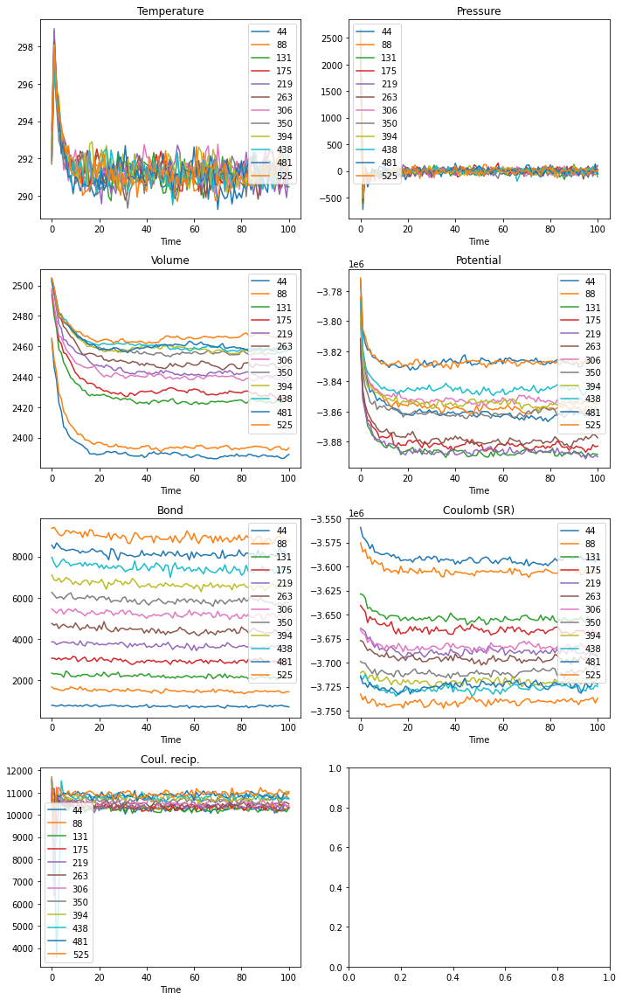

In [166]:
#n = len(res_df['nmolecules'].unique())
y_quantities = [
    'Temperature',
    'Pressure',
    'Volume',
    'Potential',
    'Bond',
    'Coulomb (SR)',
    'Coul. recip.',
    ]

n = len(y_quantities)
cols = 2
rows = round(n/cols)
if rows > 1:
    positions = [(i,j) for i in range(rows) for j in range(cols)][:n]
else:
    positions = [i for i in range(cols)][:n]
    
fig, ax = plt.subplots(rows,cols,figsize=(5*cols,4*rows))
for key, grp in res_df.groupby(['nmolecules']):
    for y_quantity, position in zip(y_quantities, positions):
        grp.plot('Time',y_quantity,ax=ax[position],label=key,title=y_quantity)
        
fig.tight_layout()

### Visualize trajectory

In [167]:
query = {
    'metadata.project': project_id,
    'metadata.step': 'GromacsNPTEquilibration:ProcessAnalyzeAndVisualize:push_filepad',
    'metadata.type': 'mp4_file',
}

In [168]:
# use underlying MongoDB functionality to check total number of documents matching query
fp.filepad.count_documents(query)

13

In [169]:
parameter_dict = {'nmolecules': 'metadata.system.surfactant.nmolecules'}

aggregation_pipeline = [
    {
        "$match": query
    },
    {
        "$sort": { 
            "metadata.datetime": pymongo.DESCENDING,
        }
    },
    { 
        "$group": { 
            "_id": { field: '${}'.format(key) for field, key in parameter_dict.items() },
            "degeneracy": {"$sum": 1}, # number matching data sets
            "latest":     {"$first": "$gfs_id"} # unique gridfs id of file
        }
    },
]

cursor = fp.filepad.aggregate(aggregation_pipeline)

obj_dict = {}
for i, c in enumerate(cursor): 
    content, metadata = fp.get_file_by_id(c["latest"])
    # print(metadata['metadata'])
    with tempfile.NamedTemporaryFile(suffix='.mp4',delete=False) as tmp:
        tmp.write(content)
        # obj_list.append(Video(filename=tmp.name)) 
        # obj_list.append(tmp.name)
        key = tuple(c["_id"].values())
        obj_dict.update({key: Video.from_file(tmp.name)})
    print('.',end='')

............

In [170]:
for key, obj in obj_dict.items():
    print(key)
    display(obj)

(219,)


Video(value=b'\x00\x00\x00 ftypisom\x00\x00\x02\x00isomiso2avc1mp41\x00\x00\x00\x08free\x00\x1c\xf3\xe8mdat\x0…

(438,)


Video(value=b'\x00\x00\x00 ftypisom\x00\x00\x02\x00isomiso2avc1mp41\x00\x00\x00\x08free\x00\x1f\xf3\xaemdat\x0…

(175,)


Video(value=b'\x00\x00\x00 ftypisom\x00\x00\x02\x00isomiso2avc1mp41\x00\x00\x00\x08free\x00\x1by\xddmdat\x00\x…

(394,)


Video(value=b'\x00\x00\x00 ftypisom\x00\x00\x02\x00isomiso2avc1mp41\x00\x00\x00\x08free\x00 \x94\x16mdat\x00\x…

(350,)


Video(value=b'\x00\x00\x00 ftypisom\x00\x00\x02\x00isomiso2avc1mp41\x00\x00\x00\x08free\x00 \x19.mdat\x00\x00\…

(263,)


Video(value=b'\x00\x00\x00 ftypisom\x00\x00\x02\x00isomiso2avc1mp41\x00\x00\x00\x08free\x00\x1e9]mdat\x00\x00\…

(131,)


Video(value=b'\x00\x00\x00 ftypisom\x00\x00\x02\x00isomiso2avc1mp41\x00\x00\x00\x08free\x00\x1a\xc7\xdemdat\x0…

(88,)


Video(value=b'\x00\x00\x00 ftypisom\x00\x00\x02\x00isomiso2avc1mp41\x00\x00\x00\x08free\x00\x16\xa6\xd7mdat\x0…

(44,)


Video(value=b'\x00\x00\x00 ftypisom\x00\x00\x02\x00isomiso2avc1mp41\x00\x00\x00\x08free\x00\r\x1e\xfemdat\x00\…

(306,)


Video(value=b'\x00\x00\x00 ftypisom\x00\x00\x02\x00isomiso2avc1mp41\x00\x00\x00\x08free\x00\x1fW\x1cmdat\x00\x…

(525,)


Video(value=b'\x00\x00\x00 ftypisom\x00\x00\x02\x00isomiso2avc1mp41\x00\x00\x00\x08free\x00 \xf6!mdat\x00\x00\…

(481,)


Video(value=b'\x00\x00\x00 ftypisom\x00\x00\x02\x00isomiso2avc1mp41\x00\x00\x00\x08free\x00\x1f\xd0\xf3mdat\x0…


### Pre-evaluated RDF

#### Overview

In [171]:
query = { 
    "metadata.project": project_id,
    "metadata.type": {'$regex': '.*rdf$'},
    "metadata.step": "GromacsNPTEquilibration:ProcessAnalyzeAndVisualize:push_filepad",
}

fp.filepad.count_documents(query)

139

In [172]:
# check files degenerate by 'metadata.type' ad 'metadata.name'
aggregation_pipeline = [
    {
        "$match": query
    },
    {  # group by unique project id
        "$group": { 
            "_id": { 
                'type': '$metadata.type',
            },
            "object_count": {"$sum": 1}, # count matching data sets
            "earliest":  {'$min': '$metadata.datetime' },
            "latest":  {'$max': '$metadata.datetime' },
        },
    },
    {  # sort by earliest date, descending
        "$sort": { 
            "earliest": pymongo.DESCENDING,
        }
    }
]

cursor = fp.filepad.aggregate(aggregation_pipeline)

res = [ {**c['_id'], **c} for c in cursor]
columns = ['type', 'earliest', 'latest', 'object_count', '_id']
res_df = pd.DataFrame(data=res, columns=columns) # pandas Dataframe is just nice for printing in notebook
del res_df["_id"]

In [173]:
res_df

,type,earliest,latest,object_count
0,surfactant_tail_surfactant_tail_rdf,2020-07-19 22:53:00.105657,2020-07-19 22:53:01.323001,13
1,surfactant_head_surfactant_tail_rdf,2020-07-19 22:53:00.105655,2020-07-19 22:53:01.322999,14
2,surfactant_head_surfactant_head_rdf,2020-07-19 22:53:00.105653,2020-07-19 22:53:01.322997,14
3,substrate_surfactant_tail_rdf,2020-07-19 22:53:00.105650,2020-07-19 22:53:01.322995,14
4,substrate_surfactant_head_rdf,2020-07-19 22:53:00.105648,2020-07-19 22:53:01.322992,14
5,substrate_substrate_rdf,2020-07-19 22:53:00.105646,2020-07-19 22:53:01.322990,14
6,counterion_surfactant_tail_rdf,2020-07-19 22:53:00.105643,2020-07-19 22:53:01.322988,14
7,counterion_surfactant_head_rdf,2020-07-19 22:53:00.105641,2020-07-19 22:53:01.322986,14
8,counterion_substrate_rdf,2020-07-19 22:53:00.105638,2020-07-19 22:53:01.322983,14
9,counterion_counterion_rdf,2020-07-19 22:53:00.105636,2020-07-19 22:53:01.322981,14


#### Substrate - surfactant head RDF

In [174]:
parameter_dict = {
    'nmolecules': 'metadata.system.surfactant.nmolecules'}

In [175]:
query = { 
    "metadata.project": project_id,
    "metadata.type": 'substrate_surfactant_head_rdf',
    "metadata.step": "GromacsNPTEquilibration:ProcessAnalyzeAndVisualize:push_filepad",
}

fp.filepad.count_documents(query)

14

In [176]:
res_dict = {}
failed_list = []

match_aggregation = {
        "$match": query
    }
sort_aggregation = {
        "$sort": { 
            "metadata.datetime": pymongo.DESCENDING,
        }
    }
group_aggregation = { 
    "$group": { 
        "_id": { field: '${}'.format(key) for field, key in parameter_dict.items() },
        "degeneracy": {"$sum": 1}, # number matching data sets
        "latest":     {"$first": "$gfs_id"} # unique gridfs id of file
    }
}
aggregation_pipeline = [ match_aggregation, sort_aggregation, group_aggregation ]
cursor = fp.filepad.aggregate(aggregation_pipeline)

# res_list = []
for i, c in enumerate(cursor): 
    content, metadata = fp.get_file_by_id(c["latest"])
    nmolecules = int(c["_id"]["nmolecules"])
    data_str = io.StringIO(content.decode())
    data = np.loadtxt(data_str, comments='#')
    d = data[0] # distance bins
    rdf = data[1:]
    res_dict[nmolecules] = {'dist': d, 'rdf': rdf}
    # res_list.append(data)
    print('.',end='')
print('')

............


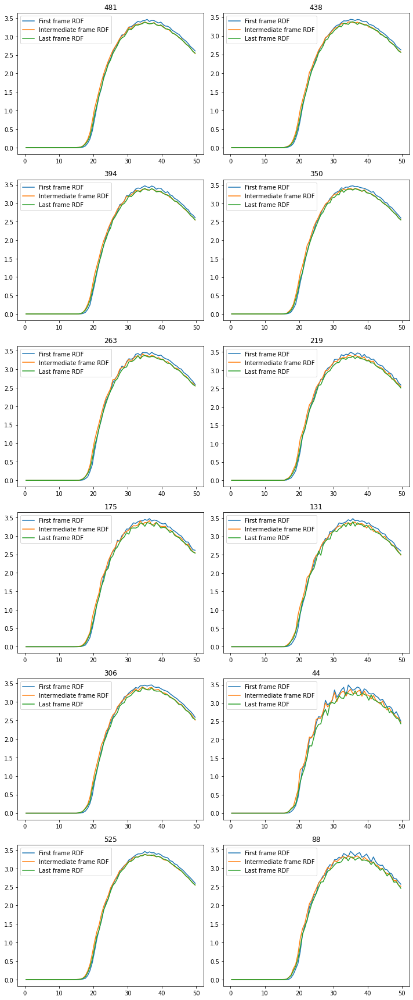

In [177]:
n = len(res_dict)
cols = 2 if n > 1 else 1
rows = round(n/cols)
if rows > 1:
    positions = [(i,j) for i in range(rows) for j in range(cols)][:n]
else:
    positions = [i for i in range(cols)][:n]
    
fig, ax = plt.subplots(rows,cols,figsize=(5*cols,4*rows))
if not isinstance(ax, Iterable):
    ax = [ax]
# for key, grp in res_df.groupby(['nmolecules']):
for pos, (nmolecules, data) in zip(positions, res_dict.items()):
    ax[pos].plot(data['dist'],data['rdf'][0], label='First frame RDF')
    ax[pos].plot(data['dist'],data['rdf'][len(data)//2],label='Intermediate frame RDF')
    ax[pos].plot(data['dist'],data['rdf'][-1],label='Last frame RDF')
    ax[pos].set_title(nmolecules)
    ax[pos].legend()

fig.tight_layout()
# fig.legend()
fig.show()

#### Substrate - surfactant tail RDF

In [178]:
parameter_dict = {
    'nmolecules': 'metadata.system.surfactant.nmolecules'}

In [179]:
query = { 
    "metadata.project": project_id,
    "metadata.type": 'substrate_surfactant_tail_rdf',
    "metadata.step": "GromacsNPTEquilibration:ProcessAnalyzeAndVisualize:push_filepad",
}

fp.filepad.count_documents(query)

14

In [180]:
res_dict = {}
failed_list = []

match_aggregation = {
        "$match": query
    }
sort_aggregation = {
        "$sort": { 
            "metadata.datetime": pymongo.DESCENDING,
        }
    }
group_aggregation = { 
    "$group": { 
        "_id": { field: '${}'.format(key) for field, key in parameter_dict.items() },
        "degeneracy": {"$sum": 1}, # number matching data sets
        "latest":     {"$first": "$gfs_id"} # unique gridfs id of file
    }
}
second_sort_aggregation = {
    "$sort": { 
        "_id.nmolecules": pymongo.DESCENDING,
    }
}


aggregation_pipeline = [ 
    match_aggregation, sort_aggregation, group_aggregation, second_sort_aggregation ]
cursor = fp.filepad.aggregate(aggregation_pipeline)

# res_list = []
for i, c in enumerate(cursor): 
    content, metadata = fp.get_file_by_id(c["latest"])
    nmolecules = int(c["_id"]["nmolecules"])
    data_str = io.StringIO(content.decode())
    data = np.loadtxt(data_str, comments='#')
    d = data[0] # distance bins
    rdf = data[1:]
    res_dict[nmolecules] = {'dist': d, 'rdf': rdf}
    # res_list.append(data)
    print('.',end='')
print('')

............


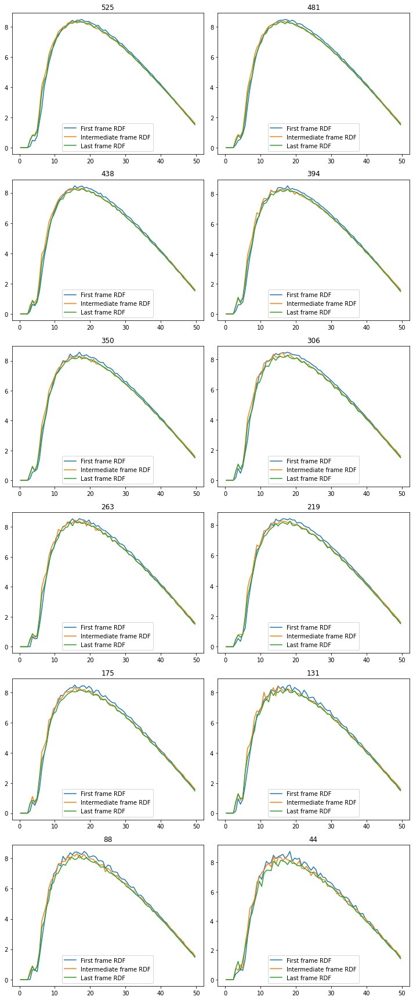

In [181]:
n = len(res_dict)
cols = 2 if n > 1 else 1
rows = round(n/cols)
if rows > 1:
    positions = [(i,j) for i in range(rows) for j in range(cols)][:n]
else:
    positions = [i for i in range(cols)][:n]
    
fig, ax = plt.subplots(rows,cols,figsize=(5*cols,4*rows))
if not isinstance(ax, Iterable):
    ax = [ax]
    
# for key, grp in res_df.groupby(['nmolecules']):
for pos, (nmolecules, data) in zip(positions, res_dict.items()):
    ax[pos].plot(data['dist'],data['rdf'][0], label='First frame RDF')
    ax[pos].plot(data['dist'],data['rdf'][len(data)//2],label='Intermediate frame RDF')
    ax[pos].plot(data['dist'],data['rdf'][-1],label='Last frame RDF')
    ax[pos].set_title(nmolecules)
    ax[pos].legend()

fig.tight_layout()
# fig.legend()
fig.show()

#### Surfactant head - surfactant tail RDF

In [182]:
parameter_dict = {
    'nmolecules': 'metadata.system.surfactant.nmolecules'}

In [183]:
query = { 
    "metadata.project": project_id,
    "metadata.type": 'surfactant_head_surfactant_tail_rdf',
    "metadata.step": "GromacsNPTEquilibration:ProcessAnalyzeAndVisualize:push_filepad",
}

fp.filepad.count_documents(query)

14

In [184]:
res_dict = {}
failed_list = []

match_aggregation = {
        "$match": query
    }
sort_aggregation = {
        "$sort": { 
            "metadata.datetime": pymongo.DESCENDING,
        }
    }
group_aggregation = { 
    "$group": { 
        "_id": { field: '${}'.format(key) for field, key in parameter_dict.items() },
        "degeneracy": {"$sum": 1}, # number matching data sets
        "latest":     {"$first": "$gfs_id"} # unique gridfs id of file
    }
}
second_sort_aggregation = {
    "$sort": { 
        "_id.nmolecules": pymongo.DESCENDING,
    }
}


aggregation_pipeline = [ 
    match_aggregation, sort_aggregation, group_aggregation, second_sort_aggregation ]
cursor = fp.filepad.aggregate(aggregation_pipeline)

# res_list = []
for i, c in enumerate(cursor): 
    content, metadata = fp.get_file_by_id(c["latest"])
    nmolecules = int(c["_id"]["nmolecules"])
    data_str = io.StringIO(content.decode())
    data = np.loadtxt(data_str, comments='#')
    d = data[0] # distance bins
    rdf = data[1:]
    res_dict[nmolecules] = {'dist': d, 'rdf': rdf}
    # res_list.append(data)
    print('.',end='')
print('')

............


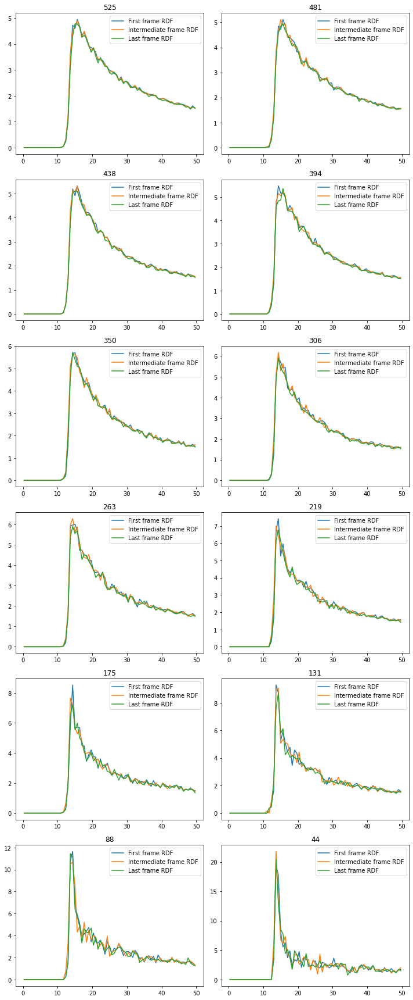

In [185]:
n = len(res_dict)
cols = 2 if n > 1 else 1
rows = round(n/cols)
if rows > 1:
    positions = [(i,j) for i in range(rows) for j in range(cols)][:n]
else:
    positions = [i for i in range(cols)][:n]
    
fig, ax = plt.subplots(rows,cols,figsize=(5*cols,4*rows))
if not isinstance(ax, Iterable):
    ax = [ax]
# for key, grp in res_df.groupby(['nmolecules']):
for pos, (nmolecules, data) in zip(positions, res_dict.items()):
    ax[pos].plot(data['dist'],data['rdf'][0], label='First frame RDF')
    ax[pos].plot(data['dist'],data['rdf'][len(data)//2],label='Intermediate frame RDF')
    ax[pos].plot(data['dist'],data['rdf'][-1],label='Last frame RDF')
    ax[pos].set_title(nmolecules)
    ax[pos].legend()

fig.tight_layout()
# fig.legend()
fig.show()

## Relaxation analysis

### Datasets in step

In [186]:
# queries to the data base are simple dictionaries
query = {
    'metadata.project': project_id,
    'metadata.step': 'GromacsRelaxation:ProcessAnalyzeAndVisualize:push_filepad'
}

In [187]:
# check files degenerate by 'metadata.type' ad 'metadata.name'
aggregation_pipeline = [
    {
        "$match": query
    },
    {  # group by unique project id
        "$group": { 
            "_id": { 
                'dataset': '$metadata.step_specific.dtool_push.remote_dataset',
            },
            "object_count": {"$sum": 1}, # count matching data sets
            "earliest":  {'$min': '$metadata.datetime' },
            "latest":  {'$max': '$metadata.datetime' },
        },
    },
    {  # sort by earliest date, descending
        "$sort": { 
            "earliest": pymongo.DESCENDING,
        }
    }
]

cursor = fp.filepad.aggregate(aggregation_pipeline)

res = [ {**c['_id']['dataset'], **c} for c in cursor]
columns = ['uuid', 'name', 'uri', 'earliest', 'latest', 'object_count', '_id']
res_df = pd.DataFrame(data=res, columns=columns) # pandas Dataframe is just nice for printing in notebook
del res_df["_id"]

In [188]:
res_df

,uuid,name,uri,earliest,latest,object_count
0,46025af3-aa13-4d28-a3a0-16cdfa515080,2020-07-19-22-53-01-328749-n-525-m-525-gromacsrelaxation,file://juwels01.ib.juwels.fzj.de/p/project/chfr13/hoermann4/dtool/DATASETS/2020-07-19-22-53-01-328749-n-525-m-525-gromacsrelaxation,2020-07-19 22:53:01.334529,2020-07-19 22:53:01.334582,21
1,5269e851-3df9-4a76-8e3d-9f0981224fae,2020-07-19-22-53-01-222648-n-481-m-481-gromacsrelaxation,file://juwels01.ib.juwels.fzj.de/p/project/chfr13/hoermann4/dtool/DATASETS/2020-07-19-22-53-01-222648-n-481-m-481-gromacsrelaxation,2020-07-19 22:53:01.228234,2020-07-19 22:53:01.228288,21
2,8d1091f3-1b8b-4e88-9d95-137acb0d23c9,2020-07-19-22-53-01-119574-n-438-m-438-gromacsrelaxation,file://juwels01.ib.juwels.fzj.de/p/project/chfr13/hoermann4/dtool/DATASETS/2020-07-19-22-53-01-119574-n-438-m-438-gromacsrelaxation,2020-07-19 22:53:01.125808,2020-07-19 22:53:01.125857,21
3,a133bff6-9294-4727-8d6c-9639817e2177,2020-07-19-22-53-01-003994-n-394-m-394-gromacsrelaxation,file://juwels01.ib.juwels.fzj.de/p/project/chfr13/hoermann4/dtool/DATASETS/2020-07-19-22-53-01-003994-n-394-m-394-gromacsrelaxation,2020-07-19 22:53:01.010132,2020-07-19 22:53:01.010185,21
4,8cc16694-ccc6-4f37-93dc-2f77af5a4914,2020-07-19-22-53-00-894817-n-350-m-350-gromacsrelaxation,file://juwels01.ib.juwels.fzj.de/p/project/chfr13/hoermann4/dtool/DATASETS/2020-07-19-22-53-00-894817-n-350-m-350-gromacsrelaxation,2020-07-19 22:53:00.900515,2020-07-19 22:53:00.900566,21
5,7e794aa6-e087-46c8-976b-50328119ec30,2020-07-19-22-53-00-784285-n-306-m-306-gromacsrelaxation,file://juwels01.ib.juwels.fzj.de/p/project/chfr13/hoermann4/dtool/DATASETS/2020-07-19-22-53-00-784285-n-306-m-306-gromacsrelaxation,2020-07-19 22:53:00.790355,2020-07-19 22:53:00.790410,21
6,e1886099-69b1-4acd-b377-9e022fe2a6ec,2020-07-19-22-53-00-671734-n-263-m-263-gromacsrelaxation,file://juwels01.ib.juwels.fzj.de/p/project/chfr13/hoermann4/dtool/DATASETS/2020-07-19-22-53-00-671734-n-263-m-263-gromacsrelaxation,2020-07-19 22:53:00.677699,2020-07-19 22:53:00.677752,21
7,4318c0c1-15da-427a-bd36-8cc09abd5605,2020-07-19-22-53-00-561385-n-219-m-219-gromacsrelaxation,file://juwels01.ib.juwels.fzj.de/p/project/chfr13/hoermann4/dtool/DATASETS/2020-07-19-22-53-00-561385-n-219-m-219-gromacsrelaxation,2020-07-19 22:53:00.567673,2020-07-19 22:53:00.567724,21
8,f6e3e648-1409-4eba-b1af-a982146e4f58,2020-07-19-22-53-00-446008-n-175-m-175-gromacsrelaxation,file://juwels01.ib.juwels.fzj.de/p/project/chfr13/hoermann4/dtool/DATASETS/2020-07-19-22-53-00-446008-n-175-m-175-gromacsrelaxation,2020-07-19 22:53:00.451482,2020-07-19 22:53:00.451532,21
9,9a060f1a-2933-4289-a6b8-073b4f80bbdf,2020-07-19-22-53-00-333996-n-131-m-131-gromacsrelaxation,file://juwels01.ib.juwels.fzj.de/p/project/chfr13/hoermann4/dtool/DATASETS/2020-07-19-22-53-00-333996-n-131-m-131-gromacsrelaxation,2020-07-19 22:53:00.342447,2020-07-19 22:53:00.342501,21


### Overview on objects in step

In [189]:
# use underlying MongoDB functionality to check total number of documents matching query
fp.filepad.count_documents(query)

252

In [190]:
# check files degenerate by 'metadata.type' ad 'metadata.name'
aggregation_pipeline = [
    {
        "$match": query
    },
    {  # group by unique project id
        "$group": { 
            "_id": { 
                'type': '$metadata.type',
                'name': '$metadata.name',
            },
            "object_count": {"$sum": 1}, # count matching data sets
            "earliest":  {'$min': '$metadata.datetime' },
            "latest":  {'$max': '$metadata.datetime' },
        },
    },
    {  # sort by earliest date, descending
        "$sort": { 
            "earliest": pymongo.DESCENDING,
        }
    }
]

cursor = fp.filepad.aggregate(aggregation_pipeline)

res = [ {**c['_id'], **c} for c in cursor]
columns = ['type', 'name', 'earliest', 'latest', 'object_count', '_id']
res_df = pd.DataFrame(data=res, columns=columns) # pandas Dataframe is just nice for printing in notebook
del res_df["_id"]

In [191]:
res_df

,type,name,earliest,latest,object_count
0,mp4_file,NaN,2020-07-19 22:53:00.116638,2020-07-19 22:53:01.334582,12
1,surfactant_tail_rmsd,NaN,2020-07-19 22:53:00.116633,2020-07-19 22:53:01.334580,12
2,surfactant_head_rmsd,NaN,2020-07-19 22:53:00.116631,2020-07-19 22:53:01.334577,12
3,substrate_rmsd,NaN,2020-07-19 22:53:00.116628,2020-07-19 22:53:01.334575,12
4,counterion_rmsd,NaN,2020-07-19 22:53:00.116626,2020-07-19 22:53:01.334569,12
5,surfactant_tail_surfactant_tail_rdf,NaN,2020-07-19 22:53:00.116623,2020-07-19 22:53:01.334567,12
6,surfactant_head_surfactant_tail_rdf,NaN,2020-07-19 22:53:00.116621,2020-07-19 22:53:01.334565,12
7,surfactant_head_surfactant_head_rdf,NaN,2020-07-19 22:53:00.116619,2020-07-19 22:53:01.334562,12
8,substrate_surfactant_tail_rdf,NaN,2020-07-19 22:53:00.116616,2020-07-19 22:53:01.334560,12
9,substrate_surfactant_head_rdf,NaN,2020-07-19 22:53:00.116614,2020-07-19 22:53:01.334558,12


### Global observables

In [192]:
query = { 
    "metadata.project": project_id,
    'metadata.step': 'GromacsRelaxation:ProcessAnalyzeAndVisualize:push_filepad',
    "metadata.type":    'energy_file',
}
fp.filepad.count_documents(query)

12

In [193]:
parameter_dict = {'nmolecules': 'metadata.system.surfactant.nmolecules'}

In [194]:
aggregation_pipeline = [
    {
        "$match": query
    },
    {
        "$sort": { 
            "metadata.datetime": pymongo.DESCENDING,
        }
    },
    { 
        "$group": { 
            "_id": { field: '${}'.format(key) for field, key in parameter_dict.items() },
            "degeneracy": {"$sum": 1}, # number matching data sets
            "latest":     {"$first": "$gfs_id"} # unique gridfs id of file
        }
    },
]

cursor = fp.filepad.aggregate(aggregation_pipeline)

In [195]:
[ c for c in cursor]

[{'_id': {'nmolecules': 481},
  'degeneracy': 1,
  'latest': '5f14d8507dc9cfbf449da85b'},
 {'_id': {'nmolecules': 438},
  'degeneracy': 1,
  'latest': '5f14d9777dc9cfbf449dc151'},
 {'_id': {'nmolecules': 394},
  'degeneracy': 1,
  'latest': '5f14e4507dc9cfbf449e14b6'},
 {'_id': {'nmolecules': 350},
  'degeneracy': 1,
  'latest': '5f14ec127dc9cfbf449e4ea8'},
 {'_id': {'nmolecules': 263},
  'degeneracy': 1,
  'latest': '5f14f9a57dc9cfbf449eaf44'},
 {'_id': {'nmolecules': 219},
  'degeneracy': 1,
  'latest': '5f1505b57dc9cfbf449f0f72'},
 {'_id': {'nmolecules': 175},
  'degeneracy': 1,
  'latest': '5f150c897dc9cfbf449f3ae8'},
 {'_id': {'nmolecules': 131},
  'degeneracy': 1,
  'latest': '5f150d917dc9cfbf449f53b3'},
 {'_id': {'nmolecules': 306},
  'degeneracy': 1,
  'latest': '5f14f2387dc9cfbf449e7c9d'},
 {'_id': {'nmolecules': 44},
  'degeneracy': 1,
  'latest': '5f151dee7dc9cfbf449faa26'},
 {'_id': {'nmolecules': 525},
  'degeneracy': 1,
  'latest': '5f14d73e7dc9cfbf449d8f52'},
 {'_id': {'

In [196]:
res_list = []

cursor = fp.filepad.aggregate(aggregation_pipeline)

for i, c in enumerate(cursor): 
    content, metadata = fp.get_file_by_id(c["latest"])
    with tempfile.NamedTemporaryFile(suffix='.edr') as tmp:
        tmp.write(content)
        res_df = panedr.edr_to_df(tmp.name)
        
        mi = pd.MultiIndex.from_product(
            [c["_id"].values(),res_df.index],
            names=[*c["_id"].keys(),'step'])
        res_mi_df = res_df.set_index(mi)
        res_list.append(res_mi_df)
    print('.',end='')
print('')
res_df_mi = pd.concat(res_list)
res_df = res_df_mi.reset_index()

............


In [197]:
res_df.columns

Index(['nmolecules', 'step', 'Time', 'Bond', 'U-B', 'Proper Dih.', 'LJ-14',
       'Coulomb-14', 'LJ (SR)', 'Coulomb (SR)', 'Coul. recip.', 'Potential',
       'Kinetic En.', 'Total Energy', 'Conserved En.', 'Temperature',
       'Pressure', 'Constr. rmsd', 'Box-X', 'Box-Y', 'Box-Z', 'Volume',
       'Density', 'pV', 'Enthalpy', 'Vir-XX', 'Vir-XY', 'Vir-XZ', 'Vir-YX',
       'Vir-YY', 'Vir-YZ', 'Vir-ZX', 'Vir-ZY', 'Vir-ZZ', 'Pres-XX', 'Pres-XY',
       'Pres-XZ', 'Pres-YX', 'Pres-YY', 'Pres-YZ', 'Pres-ZX', 'Pres-ZY',
       'Pres-ZZ', '#Surf*SurfTen', 'Box-Vel-XX', 'Box-Vel-YY', 'Box-Vel-ZZ',
       'Coul-SR:Surfactant-Surfactant', 'LJ-SR:Surfactant-Surfactant',
       'Coul-14:Surfactant-Surfactant', 'LJ-14:Surfactant-Surfactant',
       'Coul-SR:Surfactant-Substrate', 'LJ-SR:Surfactant-Substrate',
       'Coul-14:Surfactant-Substrate', 'LJ-14:Surfactant-Substrate',
       'Coul-SR:Surfactant-Ion', 'LJ-SR:Surfactant-Ion',
       'Coul-14:Surfactant-Ion', 'LJ-14:Surfactant-Ion',
      

In [198]:
res_df_mi

Time         Bond           U-B   Proper Dih.        LJ-14  \
nmolecules step                                                                 
481        0.0      0.0  8303.608398  73871.851562  17496.201172  4498.496094   
           1.0      1.0  8214.778320  74148.695312  18265.007812  4557.044922   
           2.0      2.0  8345.959961  74711.750000  18231.474609  4924.902344   
           3.0      3.0  8151.788086  74331.992188  18476.951172  4804.255859   
           4.0      4.0  8236.656250  73741.585938  18342.388672  4785.673340   
...                 ...          ...           ...           ...          ...   
88         196.0  196.0  1474.990845  13177.531250   3194.437744   835.010376   
           197.0  197.0  1439.236206  13241.346680   3286.716064   815.688049   
           198.0  198.0  1448.349731  13523.822266   3416.596191   866.902954   
           199.0  199.0  1425.410889  13253.172852   3319.118164   898.297607   
           200.0  200.0  1455.170410  13276.759766   3359.553711   884.132141   

                     Coulomb-14       LJ (SR)  Coulomb (SR)  ...  \
nmolecules step                                              ...   
481        0.0    122485.039062 -347417.93750   -3722675.25  ...   
           1.0    122138.265625 -350537.28125   -3715491.00  ...   
           2.0    122209.250000 -347369.28125   -3723363.50  ...   
           3.0    122236.687500 -351120.81250   -3721030.75  ...   
           4.0    122148.570312 -350222.68750   -3724876.50  ...   
...                         ...           ...           ...  ...   
88         196.0   21801.701172 -307357.09375   -3602397.25  ...   
           197.0   21870.714844 -306590.15625   -3602733.75  ...   
           198.0   21847.775391 -303662.46875   -3605236.50  ...   
           199.0   21799.173828 -305776.00000   -3605099.00  ...   
           200.0   21775.613281 -306221.68750   -3604071.75  ...   

                  Coul-SR:rest-rest  LJ-SR:rest-rest  Coul-14:rest-rest  \
nmolecules step                                                           
481        0.0          -3277627.50     331966.68750                0.0   
           1.0          -3266354.75     329117.40625                0.0   
           2.0          -3275268.00     332642.71875                0.0   
           3.0          -3271685.75     328977.65625                0.0   
           4.0          -3275797.25     330658.25000                0.0   
...                             ...              ...                ...   
88         196.0        -3498201.25     352909.28125                0.0   
           197.0        -3499361.75     354043.31250                0.0   
           198.0        -3501112.50     356859.93750                0.0   
           199.0        -3501087.50     354678.03125                0.0   
           200.0        -3499964.75     354104.31250                0.0   

                  LJ-14:rest-rest  T-non-Substrate  T-Substrate  \
nmolecules step                                                   
481        0.0                0.0       299.042694    29.401619   
           1.0                0.0       297.837402    29.961632   
           2.0                0.0       298.143494    31.818558   
           3.0                0.0       298.557281    32.175842   
           4.0                0.0       298.325378    33.618259   
...                           ...              ...          ...   
88         196.0              0.0       297.630859    43.448444   
           197.0              0.0       296.921265    43.736523   
           198.0              0.0       296.517334    43.090897   
           199.0              0.0       297.987701    44.791225   
           200.0              0.0       297.068176    44.066669   

                  Lamb-non-Substrate  Lamb-Substrate  
nmolecules step                                       
481        0.0                   1.0             1.0  
           1.0                   1.0             1.0  
           2

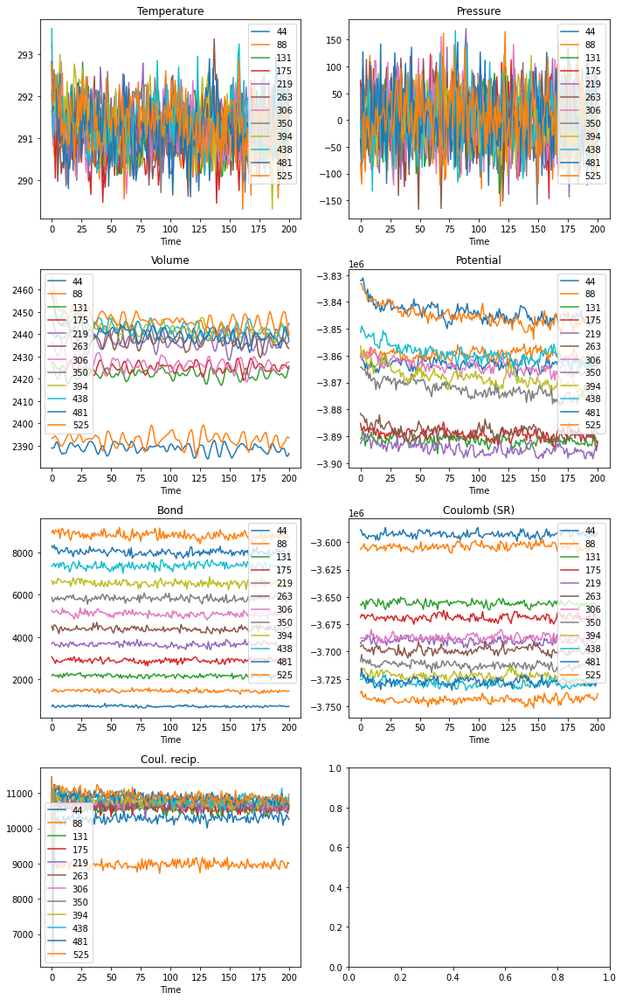

In [199]:
#n = len(res_df['nmolecules'].unique())
y_quantities = [
    'Temperature',
    'Pressure',
    'Volume',
    'Potential',
    'Bond',
    'Coulomb (SR)',
    'Coul. recip.',
    ]

n = len(y_quantities)
cols = 2
rows = round(n/cols)
if rows > 1:
    positions = [(i,j) for i in range(rows) for j in range(cols)][:n]
else:
    positions = [i for i in range(cols)][:n]
    
fig, ax = plt.subplots(rows,cols,figsize=(5*cols,4*rows))
for key, grp in res_df.groupby(['nmolecules']):
    for y_quantity, position in zip(y_quantities, positions):
        grp.plot('Time',y_quantity,ax=ax[position],label=key,title=y_quantity)
        
fig.tight_layout()

### Visualize trajectory

In [200]:
query = {
    'metadata.project': project_id,
    'metadata.step': 'GromacsRelaxation:ProcessAnalyzeAndVisualize:push_filepad',
    'metadata.type': 'mp4_file',
}

In [201]:
# use underlying MongoDB functionality to check total number of documents matching query
fp.filepad.count_documents(query)

12

In [202]:
parameter_dict = {'nmolecules': 'metadata.system.surfactant.nmolecules'}

aggregation_pipeline = [
    {
        "$match": query
    },
    {
        "$sort": { 
            "metadata.datetime": pymongo.DESCENDING,
        }
    },
    { 
        "$group": { 
            "_id": { field: '${}'.format(key) for field, key in parameter_dict.items() },
            "degeneracy": {"$sum": 1}, # number matching data sets
            "latest":     {"$first": "$gfs_id"} # unique gridfs id of file
        }
    },
]

cursor = fp.filepad.aggregate(aggregation_pipeline)

obj_dict = {}
for i, c in enumerate(cursor): 
    content, metadata = fp.get_file_by_id(c["latest"])
    # print(metadata['metadata'])
    with tempfile.NamedTemporaryFile(suffix='.mp4',delete=False) as tmp:
        tmp.write(content)
        # obj_list.append(Video(filename=tmp.name)) 
        # obj_list.append(tmp.name)
        key = tuple(c["_id"].values())
        obj_dict.update({key: Video.from_file(tmp.name)})
    print('.',end='')

............

In [203]:
for key, obj in obj_dict.items():
    print(key)
    display(obj)

(350,)


Video(value=b'\x00\x00\x00 ftypisom\x00\x00\x02\x00isomiso2avc1mp41\x00\x00\x00\x08free\x00J7Nmdat\x00\x00\x02…

(525,)


Video(value=b'\x00\x00\x00 ftypisom\x00\x00\x02\x00isomiso2avc1mp41\x00\x00\x00\x08free\x00N\xa2|mdat\x00\x00\…

(263,)


Video(value=b'\x00\x00\x00 ftypisom\x00\x00\x02\x00isomiso2avc1mp41\x00\x00\x00\x08free\x00Fv\x91mdat\x00\x00\…

(481,)


Video(value=b'\x00\x00\x00 ftypisom\x00\x00\x02\x00isomiso2avc1mp41\x00\x00\x00\x08free\x00N\xe1-mdat\x00\x00\…

(306,)


Video(value=b'\x00\x00\x00 ftypisom\x00\x00\x02\x00isomiso2avc1mp41\x00\x00\x00\x08free\x00L\x10Jmdat\x00\x00\…

(219,)


Video(value=b'\x00\x00\x00 ftypisom\x00\x00\x02\x00isomiso2avc1mp41\x00\x00\x00\x08free\x00Cq\xc6mdat\x00\x00\…

(175,)


Video(value=b'\x00\x00\x00 ftypisom\x00\x00\x02\x00isomiso2avc1mp41\x00\x00\x00\x08free\x00?\xce\x97mdat\x00\x…

(131,)


Video(value=b'\x00\x00\x00 ftypisom\x00\x00\x02\x00isomiso2avc1mp41\x00\x00\x00\x08free\x004\xdd\xeemdat\x00\x…

(88,)


Video(value=b'\x00\x00\x00 ftypisom\x00\x00\x02\x00isomiso2avc1mp41\x00\x00\x00\x08free\x00-\xf7Pmdat\x00\x00\…

(44,)


Video(value=b'\x00\x00\x00 ftypisom\x00\x00\x02\x00isomiso2avc1mp41\x00\x00\x00\x08free\x00 \x1dsmdat\x00\x00\…

(438,)


Video(value=b'\x00\x00\x00 ftypisom\x00\x00\x02\x00isomiso2avc1mp41\x00\x00\x00\x08free\x00N\xe4\x05mdat\x00\x…

(394,)


Video(value=b'\x00\x00\x00 ftypisom\x00\x00\x02\x00isomiso2avc1mp41\x00\x00\x00\x08free\x00In\xa2mdat\x00\x00\…


### Pre-evaluated RDF

#### Overview

In [204]:
query = { 
    "metadata.project": project_id,
    "metadata.type": {'$regex': '.*rdf$'},
    "metadata.step": "GromacsRelaxation:ProcessAnalyzeAndVisualize:push_filepad",
}

fp.filepad.count_documents(query)

120

In [205]:
# check files degenerate by 'metadata.type' ad 'metadata.name'
aggregation_pipeline = [
    {
        "$match": query
    },
    {  # group by unique project id
        "$group": { 
            "_id": { 
                'type': '$metadata.type',
            },
            "object_count": {"$sum": 1}, # count matching data sets
            "earliest":  {'$min': '$metadata.datetime' },
            "latest":  {'$max': '$metadata.datetime' },
        },
    },
    {  # sort by earliest date, descending
        "$sort": { 
            "earliest": pymongo.DESCENDING,
        }
    }
]

cursor = fp.filepad.aggregate(aggregation_pipeline)

res = [ {**c['_id'], **c} for c in cursor]
columns = ['type', 'earliest', 'latest', 'object_count', '_id']
res_df = pd.DataFrame(data=res, columns=columns) # pandas Dataframe is just nice for printing in notebook
del res_df["_id"]

In [206]:
res_df

,type,earliest,latest,object_count
0,surfactant_tail_surfactant_tail_rdf,2020-07-19 22:53:00.116623,2020-07-19 22:53:01.334567,12
1,surfactant_head_surfactant_tail_rdf,2020-07-19 22:53:00.116621,2020-07-19 22:53:01.334565,12
2,surfactant_head_surfactant_head_rdf,2020-07-19 22:53:00.116619,2020-07-19 22:53:01.334562,12
3,substrate_surfactant_tail_rdf,2020-07-19 22:53:00.116616,2020-07-19 22:53:01.334560,12
4,substrate_surfactant_head_rdf,2020-07-19 22:53:00.116614,2020-07-19 22:53:01.334558,12
5,substrate_substrate_rdf,2020-07-19 22:53:00.116612,2020-07-19 22:53:01.334556,12
6,counterion_surfactant_tail_rdf,2020-07-19 22:53:00.116609,2020-07-19 22:53:01.334554,12
7,counterion_surfactant_head_rdf,2020-07-19 22:53:00.116607,2020-07-19 22:53:01.334551,12
8,counterion_substrate_rdf,2020-07-19 22:53:00.116604,2020-07-19 22:53:01.334549,12
9,counterion_counterion_rdf,2020-07-19 22:53:00.116602,2020-07-19 22:53:01.334547,12


#### Substrate - surfactant head RDF

In [207]:
parameter_dict = {
    'nmolecules': 'metadata.system.surfactant.nmolecules'}

In [208]:
query = { 
    "metadata.project": project_id,
    "metadata.type": 'substrate_surfactant_head_rdf',
    "metadata.step": "GromacsRelaxation:ProcessAnalyzeAndVisualize:push_filepad",
}

fp.filepad.count_documents(query)

12

In [209]:
res_dict = {}
failed_list = []

match_aggregation = {
        "$match": query
    }
sort_aggregation = {
        "$sort": { 
            "metadata.datetime": pymongo.DESCENDING,
        }
    }
group_aggregation = { 
    "$group": { 
        "_id": { field: '${}'.format(key) for field, key in parameter_dict.items() },
        "degeneracy": {"$sum": 1}, # number matching data sets
        "latest":     {"$first": "$gfs_id"} # unique gridfs id of file
    }
}
aggregation_pipeline = [ match_aggregation, sort_aggregation, group_aggregation ]
cursor = fp.filepad.aggregate(aggregation_pipeline)

# res_list = []
for i, c in enumerate(cursor): 
    content, metadata = fp.get_file_by_id(c["latest"])
    nmolecules = int(c["_id"]["nmolecules"])
    data_str = io.StringIO(content.decode())
    data = np.loadtxt(data_str, comments='#')
    d = data[0] # distance bins
    rdf = data[1:]
    res_dict[nmolecules] = {'dist': d, 'rdf': rdf}
    # res_list.append(data)
    print('.',end='')
print('')

............


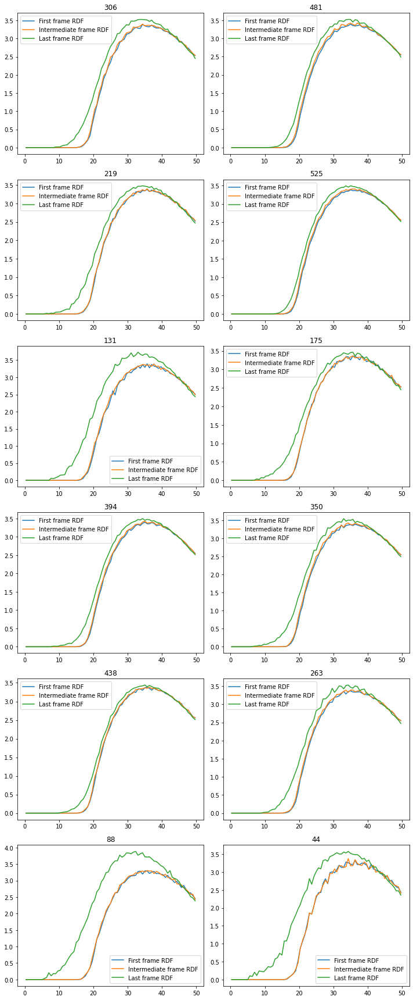

In [210]:
n = len(res_dict)
cols = 2 if n > 1 else 1
rows = round(n/cols)
if rows > 1:
    positions = [(i,j) for i in range(rows) for j in range(cols)][:n]
else:
    positions = [i for i in range(cols)][:n]
    
fig, ax = plt.subplots(rows,cols,figsize=(5*cols,4*rows))
if not isinstance(ax, Iterable):
    ax = [ax]
# for key, grp in res_df.groupby(['nmolecules']):
for pos, (nmolecules, data) in zip(positions, res_dict.items()):
    ax[pos].plot(data['dist'],data['rdf'][0], label='First frame RDF')
    ax[pos].plot(data['dist'],data['rdf'][len(data)//2],label='Intermediate frame RDF')
    ax[pos].plot(data['dist'],data['rdf'][-1],label='Last frame RDF')
    ax[pos].set_title(nmolecules)
    ax[pos].legend()

fig.tight_layout()
# fig.legend()
fig.show()

#### Substrate - surfactant tail RDF

In [211]:
parameter_dict = {
    'nmolecules': 'metadata.system.surfactant.nmolecules'}

In [212]:
query = { 
    "metadata.project": project_id,
    "metadata.type": 'substrate_surfactant_tail_rdf',
    "metadata.step": "GromacsRelaxation:ProcessAnalyzeAndVisualize:push_filepad",
}

fp.filepad.count_documents(query)

12

In [213]:
res_dict = {}
failed_list = []

match_aggregation = {
        "$match": query
    }
sort_aggregation = {
        "$sort": { 
            "metadata.datetime": pymongo.DESCENDING,
        }
    }
group_aggregation = { 
    "$group": { 
        "_id": { field: '${}'.format(key) for field, key in parameter_dict.items() },
        "degeneracy": {"$sum": 1}, # number matching data sets
        "latest":     {"$first": "$gfs_id"} # unique gridfs id of file
    }
}
second_sort_aggregation = {
    "$sort": { 
        "_id.nmolecules": pymongo.DESCENDING,
    }
}


aggregation_pipeline = [ 
    match_aggregation, sort_aggregation, group_aggregation, second_sort_aggregation ]
cursor = fp.filepad.aggregate(aggregation_pipeline)

# res_list = []
for i, c in enumerate(cursor): 
    content, metadata = fp.get_file_by_id(c["latest"])
    nmolecules = int(c["_id"]["nmolecules"])
    data_str = io.StringIO(content.decode())
    data = np.loadtxt(data_str, comments='#')
    d = data[0] # distance bins
    rdf = data[1:]
    res_dict[nmolecules] = {'dist': d, 'rdf': rdf}
    # res_list.append(data)
    print('.',end='')
print('')

............


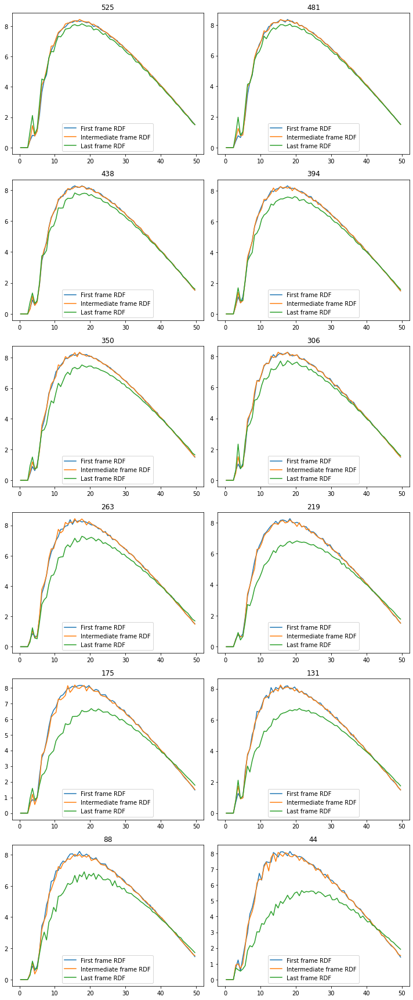

In [214]:
n = len(res_dict)
cols = 2 if n > 1 else 1
rows = round(n/cols)
if rows > 1:
    positions = [(i,j) for i in range(rows) for j in range(cols)][:n]
else:
    positions = [i for i in range(cols)][:n]
    
fig, ax = plt.subplots(rows,cols,figsize=(5*cols,4*rows))
if not isinstance(ax, Iterable):
    ax = [ax]
    
# for key, grp in res_df.groupby(['nmolecules']):
for pos, (nmolecules, data) in zip(positions, res_dict.items()):
    ax[pos].plot(data['dist'],data['rdf'][0], label='First frame RDF')
    ax[pos].plot(data['dist'],data['rdf'][len(data)//2],label='Intermediate frame RDF')
    ax[pos].plot(data['dist'],data['rdf'][-1],label='Last frame RDF')
    ax[pos].set_title(nmolecules)
    ax[pos].legend()

fig.tight_layout()
# fig.legend()
fig.show()

#### Surfactant head - surfactant tail RDF

In [215]:
parameter_dict = {
    'nmolecules': 'metadata.system.surfactant.nmolecules'}

In [216]:
query = { 
    "metadata.project": project_id,
    "metadata.type": 'surfactant_head_surfactant_tail_rdf',
    "metadata.step": "GromacsRelaxation:ProcessAnalyzeAndVisualize:push_filepad",
}

fp.filepad.count_documents(query)

12

In [217]:
res_dict = {}
failed_list = []

match_aggregation = {
        "$match": query
    }
sort_aggregation = {
        "$sort": { 
            "metadata.datetime": pymongo.DESCENDING,
        }
    }
group_aggregation = { 
    "$group": { 
        "_id": { field: '${}'.format(key) for field, key in parameter_dict.items() },
        "degeneracy": {"$sum": 1}, # number matching data sets
        "latest":     {"$first": "$gfs_id"} # unique gridfs id of file
    }
}
second_sort_aggregation = {
    "$sort": { 
        "_id.nmolecules": pymongo.DESCENDING,
    }
}


aggregation_pipeline = [ 
    match_aggregation, sort_aggregation, group_aggregation, second_sort_aggregation ]
cursor = fp.filepad.aggregate(aggregation_pipeline)

# res_list = []
for i, c in enumerate(cursor): 
    content, metadata = fp.get_file_by_id(c["latest"])
    nmolecules = int(c["_id"]["nmolecules"])
    data_str = io.StringIO(content.decode())
    data = np.loadtxt(data_str, comments='#')
    d = data[0] # distance bins
    rdf = data[1:]
    res_dict[nmolecules] = {'dist': d, 'rdf': rdf}
    # res_list.append(data)
    print('.',end='')
print('')

............


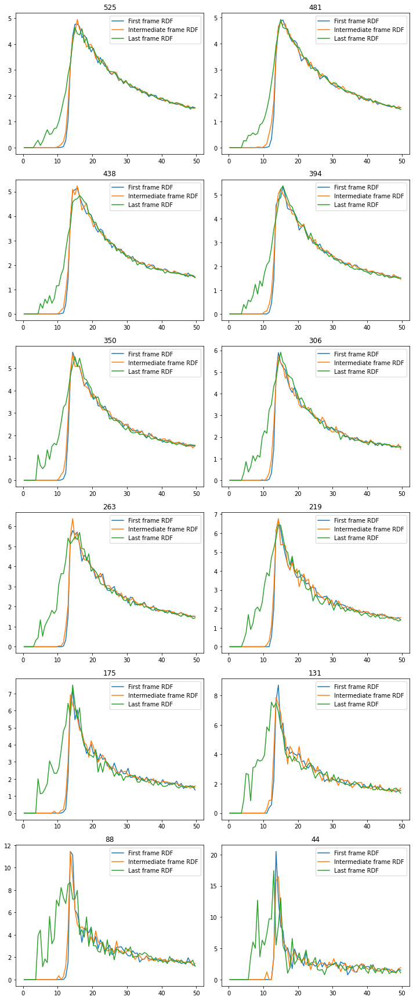

In [218]:
n = len(res_dict)
cols = 2 if n > 1 else 1
rows = round(n/cols)
if rows > 1:
    positions = [(i,j) for i in range(rows) for j in range(cols)][:n]
else:
    positions = [i for i in range(cols)][:n]
    
fig, ax = plt.subplots(rows,cols,figsize=(5*cols,4*rows))
if not isinstance(ax, Iterable):
    ax = [ax]
# for key, grp in res_df.groupby(['nmolecules']):
for pos, (nmolecules, data) in zip(positions, res_dict.items()):
    ax[pos].plot(data['dist'],data['rdf'][0], label='First frame RDF')
    ax[pos].plot(data['dist'],data['rdf'][len(data)//2],label='Intermediate frame RDF')
    ax[pos].plot(data['dist'],data['rdf'][-1],label='Last frame RDF')
    ax[pos].set_title(nmolecules)
    ax[pos].legend()

fig.tight_layout()
# fig.legend()
fig.show()

#### Surfactant head - counterion RDF

In [219]:
parameter_dict = {
    'nmolecules': 'metadata.system.surfactant.nmolecules'}

In [220]:
query = { 
    "metadata.project": project_id,
    "metadata.type": 'counterion_surfactant_head_rdf',
    "metadata.step": "GromacsRelaxation:ProcessAnalyzeAndVisualize:push_filepad",
}

fp.filepad.count_documents(query)

12

In [221]:
res_dict = {}
failed_list = []

match_aggregation = {
        "$match": query
    }
sort_aggregation = {
        "$sort": { 
            "metadata.datetime": pymongo.DESCENDING,
        }
    }
group_aggregation = { 
    "$group": { 
        "_id": { field: '${}'.format(key) for field, key in parameter_dict.items() },
        "degeneracy": {"$sum": 1}, # number matching data sets
        "latest":     {"$first": "$gfs_id"} # unique gridfs id of file
    }
}
second_sort_aggregation = {
    "$sort": { 
        "_id.nmolecules": pymongo.DESCENDING,
    }
}


aggregation_pipeline = [ 
    match_aggregation, sort_aggregation, group_aggregation, second_sort_aggregation ]
cursor = fp.filepad.aggregate(aggregation_pipeline)

# res_list = []
for i, c in enumerate(cursor): 
    content, metadata = fp.get_file_by_id(c["latest"])
    nmolecules = int(c["_id"]["nmolecules"])
    data_str = io.StringIO(content.decode())
    data = np.loadtxt(data_str, comments='#')
    d = data[0] # distance bins
    rdf = data[1:]
    res_dict[nmolecules] = {'dist': d, 'rdf': rdf}
    # res_list.append(data)
    print('.',end='')
print('')

............


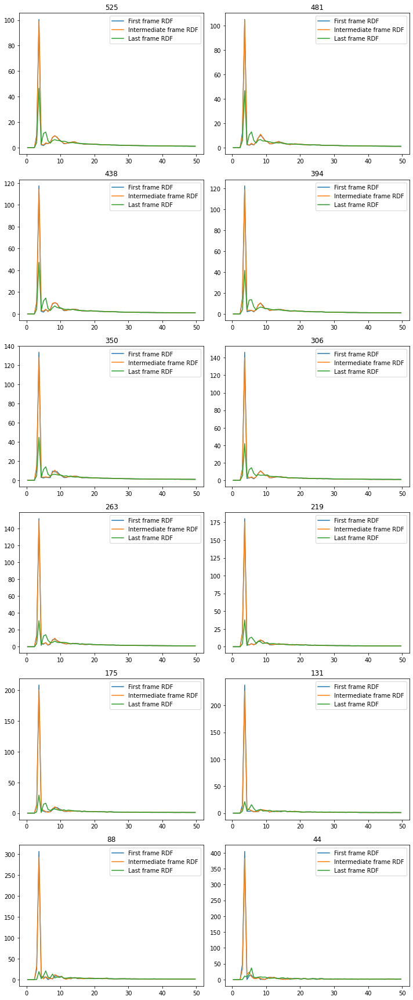

In [222]:
n = len(res_dict)
cols = 2 if n > 1 else 1
rows = round(n/cols)
if rows > 1:
    positions = [(i,j) for i in range(rows) for j in range(cols)][:n]
else:
    positions = [i for i in range(cols)][:n]
    
fig, ax = plt.subplots(rows,cols,figsize=(5*cols,4*rows))
if not isinstance(ax, Iterable):
    ax = [ax]
# for key, grp in res_df.groupby(['nmolecules']):
for pos, (nmolecules, data) in zip(positions, res_dict.items()):
    ax[pos].plot(data['dist'],data['rdf'][0], label='First frame RDF')
    ax[pos].plot(data['dist'],data['rdf'][len(data)//2],label='Intermediate frame RDF')
    ax[pos].plot(data['dist'],data['rdf'][-1],label='Last frame RDF')
    ax[pos].set_title(nmolecules)
    ax[pos].legend()

fig.tight_layout()
# fig.legend()
fig.show()

#### Surfactant head - surfactant head RDF

In [223]:
parameter_dict = {
    'nmolecules': 'metadata.system.surfactant.nmolecules'}

In [224]:
query = { 
    "metadata.project": project_id,
    "metadata.type": 'surfactant_head_surfactant_head_rdf',
    "metadata.step": "GromacsRelaxation:ProcessAnalyzeAndVisualize:push_filepad",
}

fp.filepad.count_documents(query)

12

In [225]:
res_dict = {}
failed_list = []

match_aggregation = {
        "$match": query
    }
sort_aggregation = {
        "$sort": { 
            "metadata.datetime": pymongo.DESCENDING,
        }
    }
group_aggregation = { 
    "$group": { 
        "_id": { field: '${}'.format(key) for field, key in parameter_dict.items() },
        "degeneracy": {"$sum": 1}, # number matching data sets
        "latest":     {"$first": "$gfs_id"} # unique gridfs id of file
    }
}
second_sort_aggregation = {
    "$sort": { 
        "_id.nmolecules": pymongo.DESCENDING,
    }
}


aggregation_pipeline = [ 
    match_aggregation, sort_aggregation, group_aggregation, second_sort_aggregation ]
cursor = fp.filepad.aggregate(aggregation_pipeline)

# res_list = []
for i, c in enumerate(cursor): 
    content, metadata = fp.get_file_by_id(c["latest"])
    nmolecules = int(c["_id"]["nmolecules"])
    data_str = io.StringIO(content.decode())
    data = np.loadtxt(data_str, comments='#')
    d = data[0] # distance bins
    rdf = data[1:]
    res_dict[nmolecules] = {'dist': d, 'rdf': rdf}
    # res_list.append(data)
    print('.',end='')
print('')

............


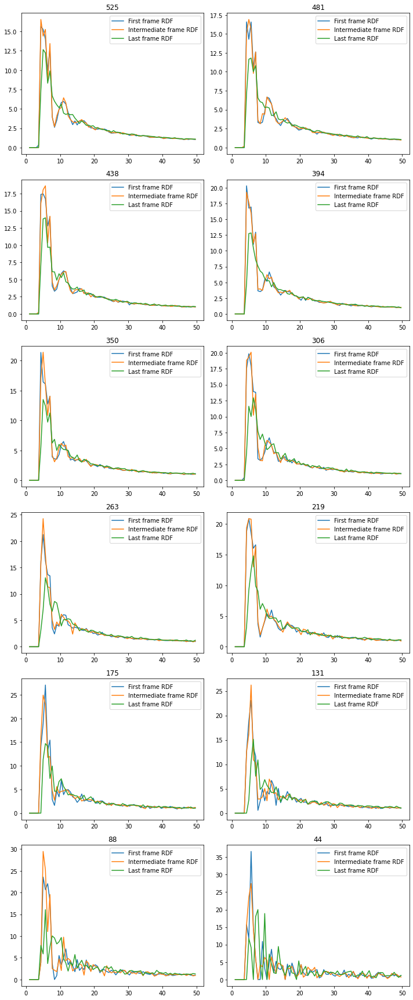

In [226]:
n = len(res_dict)
cols = 2 if n > 1 else 1
rows = round(n/cols)
cutoff_index_inner = 1
cutoff_index_outer = -1
if rows > 1:
    positions = [(i,j) for i in range(rows) for j in range(cols)][:n]
else:
    positions = [i for i in range(cols)][:n]
    
fig, ax = plt.subplots(rows,cols,figsize=(5*cols,4*rows))
if not isinstance(ax, Iterable):
    ax = [ax]
# for key, grp in res_df.groupby(['nmolecules']):
for pos, (nmolecules, data) in zip(positions, res_dict.items()):
    ax[pos].plot(data['dist'][cutoff_index_inner:],data['rdf'][0][cutoff_index_inner:], label='First frame RDF')
    ax[pos].plot(data['dist'][cutoff_index_inner:],data['rdf'][len(data)//2][cutoff_index_inner:],label='Intermediate frame RDF')
    ax[pos].plot(data['dist'][cutoff_index_inner:],data['rdf'][-1][cutoff_index_inner:],label='Last frame RDF')
    ax[pos].set_title(nmolecules)
    ax[pos].legend()

fig.tight_layout()
# fig.legend()
fig.show()

#### Surfactant tail - surfactant tail RDF

In [227]:
parameter_dict = {
    'nmolecules': 'metadata.system.surfactant.nmolecules'}

In [228]:
query = { 
    "metadata.project": project_id,
    "metadata.type": 'surfactant_tail_surfactant_tail_rdf',
    "metadata.step": "GromacsRelaxation:ProcessAnalyzeAndVisualize:push_filepad",
}

fp.filepad.count_documents(query)

12

In [229]:
res_dict = {}
failed_list = []

match_aggregation = {
        "$match": query
    }
sort_aggregation = {
        "$sort": { 
            "metadata.datetime": pymongo.DESCENDING,
        }
    }
group_aggregation = { 
    "$group": { 
        "_id": { field: '${}'.format(key) for field, key in parameter_dict.items() },
        "degeneracy": {"$sum": 1}, # number matching data sets
        "latest":     {"$first": "$gfs_id"} # unique gridfs id of file
    }
}
second_sort_aggregation = {
    "$sort": { 
        "_id.nmolecules": pymongo.DESCENDING,
    }
}


aggregation_pipeline = [ 
    match_aggregation, sort_aggregation, group_aggregation, second_sort_aggregation ]
cursor = fp.filepad.aggregate(aggregation_pipeline)

# res_list = []
for i, c in enumerate(cursor): 
    content, metadata = fp.get_file_by_id(c["latest"])
    nmolecules = int(c["_id"]["nmolecules"])
    data_str = io.StringIO(content.decode())
    data = np.loadtxt(data_str, comments='#')
    d = data[0] # distance bins
    rdf = data[1:]
    res_dict[nmolecules] = {'dist': d, 'rdf': rdf}
    # res_list.append(data)
    print('.',end='')
print('')

............


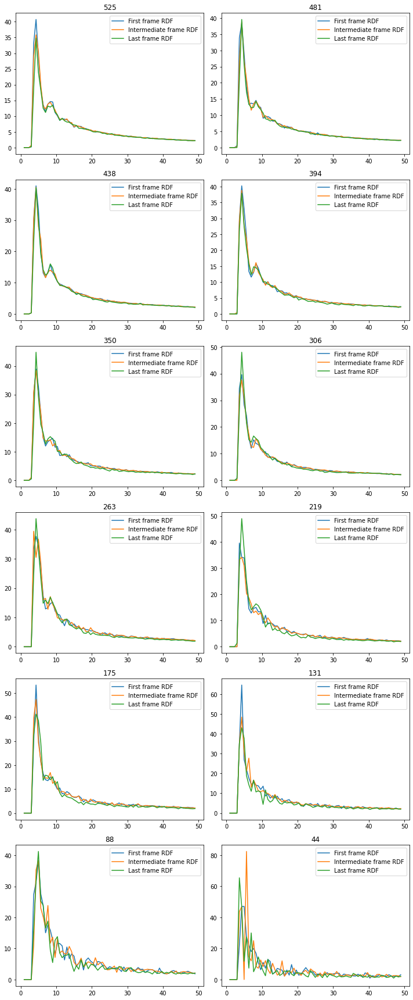

In [230]:
n = len(res_dict)
cols = 2 if n > 1 else 1
rows = round(n/cols)
cutoff_index_inner = 1
cutoff_index_outer = -1
if rows > 1:
    positions = [(i,j) for i in range(rows) for j in range(cols)][:n]
else:
    positions = [i for i in range(cols)][:n]
    
fig, ax = plt.subplots(rows,cols,figsize=(5*cols,4*rows))
if not isinstance(ax, Iterable):
    ax = [ax]
# for key, grp in res_df.groupby(['nmolecules']):
for pos, (nmolecules, data) in zip(positions, res_dict.items()):
    ax[pos].plot(data['dist'][cutoff_index_inner:cutoff_index_outer],data['rdf'][0][cutoff_index_inner:cutoff_index_outer], label='First frame RDF')
    ax[pos].plot(data['dist'][cutoff_index_inner:cutoff_index_outer],data['rdf'][len(data)//2][cutoff_index_inner:cutoff_index_outer],label='Intermediate frame RDF')
    ax[pos].plot(data['dist'][cutoff_index_inner:cutoff_index_outer],data['rdf'][-1][cutoff_index_inner:cutoff_index_outer],label='Last frame RDF')
    ax[pos].set_title(nmolecules)
    ax[pos].legend()

fig.tight_layout()
# fig.legend()
fig.show()

#### Substrate - substrate RDF

In [231]:
parameter_dict = {
    'nmolecules': 'metadata.system.surfactant.nmolecules'}

In [232]:
query = { 
    "metadata.project": project_id,
    "metadata.type": 'substrate_substrate_rdf',
    "metadata.step": "GromacsRelaxation:ProcessAnalyzeAndVisualize:push_filepad",
}

fp.filepad.count_documents(query)

12

In [233]:
res_dict = {}
failed_list = []

match_aggregation = {
        "$match": query
    }
sort_aggregation = {
        "$sort": { 
            "metadata.datetime": pymongo.DESCENDING,
        }
    }
group_aggregation = { 
    "$group": { 
        "_id": { field: '${}'.format(key) for field, key in parameter_dict.items() },
        "degeneracy": {"$sum": 1}, # number matching data sets
        "latest":     {"$first": "$gfs_id"} # unique gridfs id of file
    }
}
second_sort_aggregation = {
    "$sort": { 
        "_id.nmolecules": pymongo.DESCENDING,
    }
}


aggregation_pipeline = [ 
    match_aggregation, sort_aggregation, group_aggregation, second_sort_aggregation ]
cursor = fp.filepad.aggregate(aggregation_pipeline)

# res_list = []
for i, c in enumerate(cursor): 
    content, metadata = fp.get_file_by_id(c["latest"])
    nmolecules = int(c["_id"]["nmolecules"])
    data_str = io.StringIO(content.decode())
    data = np.loadtxt(data_str, comments='#')
    d = data[0] # distance bins
    rdf = data[1:]
    res_dict[nmolecules] = {'dist': d, 'rdf': rdf}
    # res_list.append(data)
    print('.',end='')
print('')

............


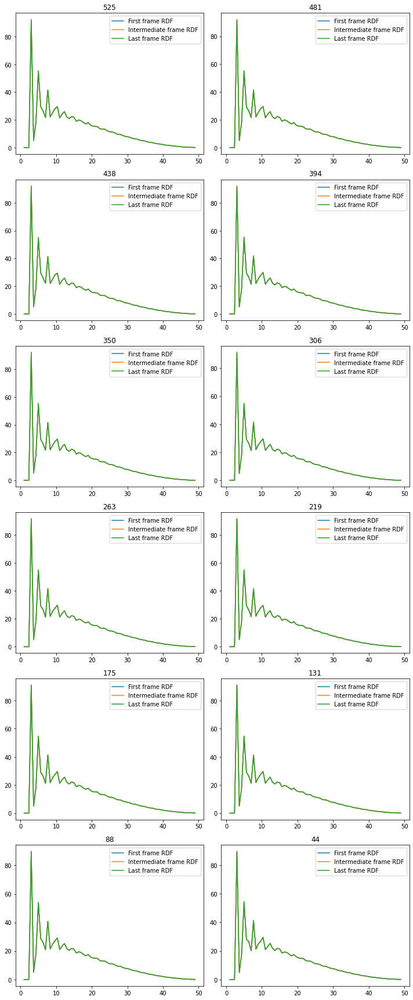

In [234]:
n = len(res_dict)
cols = 2 if n > 1 else 1
rows = round(n/cols)
cutoff_index_inner = 1
cutoff_index_outer = -1
if rows > 1:
    positions = [(i,j) for i in range(rows) for j in range(cols)][:n]
else:
    positions = [i for i in range(cols)][:n]
    
fig, ax = plt.subplots(rows,cols,figsize=(5*cols,4*rows))
if not isinstance(ax, Iterable):
    ax = [ax]
# for key, grp in res_df.groupby(['nmolecules']):
for pos, (nmolecules, data) in zip(positions, res_dict.items()):
    ax[pos].plot(data['dist'][cutoff_index_inner:cutoff_index_outer],data['rdf'][0][cutoff_index_inner:cutoff_index_outer], label='First frame RDF')
    ax[pos].plot(data['dist'][cutoff_index_inner:cutoff_index_outer],data['rdf'][len(data)//2][cutoff_index_inner:cutoff_index_outer],label='Intermediate frame RDF')
    ax[pos].plot(data['dist'][cutoff_index_inner:cutoff_index_outer],data['rdf'][-1][cutoff_index_inner:cutoff_index_outer],label='Last frame RDF')
    ax[pos].set_title(nmolecules)
    ax[pos].legend()

fig.tight_layout()
# fig.legend()
fig.show()